# Appendix B

#### In this appendix, we are investigating the error from Neural Networks.
#### Oliver's idea: Run everything again, but generate the simulation with different random seed!
#### This section corresponds to Appendix B of my thesis.

# Part 1. Enviroment setting

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import sys, os
sys.path.insert(0,os.path.realpath(os.path.join(os.getcwd(),'..')))
from getdist import plots, MCSamples
import getdist
import matplotlib.pyplot as plt
#import IPython
#print('GetDist Version: %s, Matplotlib version: %s'%(getdist.__version__, plt.matplotlib.__version__))

In [2]:
#%matplotlib notebook
import os
os.chdir("/home/r/R.Kanaki/Masterarbeit/מייַ_2023/prior_consideration")
import healpy as heal
import numpy as np
import tensorflow as tf
import keras_tuner as kt
from healpy_networks_custom import HealpyGCNN
import healpy_layers_custom as hp_layer
from tensorflow import keras
from tensorboard.plugins.hparams import api as hp
import matplotlib.pyplot as plt
from standard_2D import Standardize_Min_Max_2D, Rescale_MSE_Min_Max_2D
import build_model
from Loss_mean import MyLoss
from livelossplot import PlotLossesKeras
from cov_by_hand import cov, chisq
import pandas as pd
import tensorflow as tf
tf.keras.backend.clear_session()

In [3]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
        print(e)

3 Physical GPUs, 3 Logical GPUs


# Part 2. Getting datas and pretraining data sets

In [4]:
training_data_lognormal_1      = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_New/Training/NSIDE128/train_lognormal.npz')
training_data_lognormal_2      = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_Final/Training/NSIDE128/train_lognormal.npz')
training_data_Gauss_1          = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_New/Training/NSIDE128/train_Gauss.npz')
training_data_Gauss_2          = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_Final/Training/NSIDE128/train_Gauss.npz')
testing_data_T17               = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/bin34/T17_downgraded_to_128.npz')
testing_data_lognormal_1       = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34/Test/NSIDE128/Test_lognormal.npz')
testing_data_lognormal_2       = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_Final/Test/NSIDE128/Test_lognormal.npz')
testing_data_Gauss_1           = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34/Test/NSIDE128/Test_Gauss.npz')
testing_data_Gauss_2           = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_Final/Test/NSIDE128/Test_Gauss.npz')
validation_data_Gauss          = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_New/Validation/NSIDE128/train_Gauss.npz')
validation_data_lognormal      = np.load('/project/ls-gruen/users/r.kanaki/Masterarbeit/Takahashi/Flask34_New/Validation/NSIDE128/train_lognormal.npz')

In [5]:
## For lognormal realization of flask maps, cosmology is same 
train_data_lognormal_1           = training_data_lognormal_1['lognormal_map']
train_data_lognormal_2           = training_data_lognormal_2['lognormal_map']
train_data_Gauss_1               = training_data_Gauss_1['lognormal_map']
train_data_Gauss_2               = training_data_Gauss_2['lognormal_map']
val_data_lognormal               = validation_data_lognormal['lognormal_map']
val_data_Gauss                   = validation_data_Gauss['lognormal_map']
test_data_T17                    = testing_data_T17['lognormal_map']
test_data_lognormal_1            = testing_data_lognormal_1['lognormal_map']
test_data_lognormal_2            = testing_data_lognormal_2['lognormal_map']
test_data_Gauss_1                = testing_data_Gauss_1['lognormal_map']
test_data_Gauss_2                = testing_data_Gauss_2['lognormal_map']

train_label_Omega_M_Gauss       = training_data_Gauss_1['Omega_M']
train_label_sigma_8_Gauss       = training_data_Gauss_1['sigma_8']
val_label_Omega_M_Gauss         = validation_data_Gauss['Omega_M']
val_label_sigma_8_Gauss         = validation_data_Gauss['sigma_8']
train_label_Omega_M_lognormal   = training_data_lognormal_1['Omega_M']
train_label_sigma_8_lognormal   = training_data_lognormal_1['sigma_8']
val_label_Omega_M_lognormal     = validation_data_lognormal['Omega_M']
val_label_sigma_8_lognormal     = validation_data_lognormal['sigma_8']
test_label_Omega_M_T17          = testing_data_T17['Omega_M']
test_label_sigma_8_T17          = testing_data_T17['sigma_8']
test_label_Omega_M_lognormal    = testing_data_lognormal_1['Omega_M']
test_label_sigma_8_lognormal    = testing_data_lognormal_1['sigma_8']
test_label_Omega_M_Gauss        = testing_data_Gauss_1['Omega_M']
test_label_sigma_8_Gauss        = testing_data_Gauss_1['sigma_8']

In [6]:
fiducial_Omega_M = test_label_Omega_M_T17[0]
fiducial_sigma_8 = test_label_sigma_8_T17[0]

In [7]:
train_labels_Gauss          = np.zeros((10000,2))
train_labels_lognormal      = np.zeros((10000,2))
validation_labels_Gauss     = np.zeros((2500,2))
validation_labels_lognormal = np.zeros((2500,2))
test_labels_T17             = np.zeros((108,2))
test_labels_Gauss           = np.zeros((300,2))
test_labels_lognormal       = np.zeros((300,2))
for i in range(len(train_label_Omega_M_Gauss)):
    train_labels_Gauss[i]          = np.array((train_label_Omega_M_Gauss[i], train_label_sigma_8_Gauss[i]))
    train_labels_lognormal[i]      = np.array((train_label_Omega_M_lognormal[i], train_label_sigma_8_lognormal[i]))
for i in range(len(val_label_sigma_8_Gauss)):
    validation_labels_Gauss[i]     = np.array((val_label_Omega_M_Gauss[i], val_label_sigma_8_Gauss[i]))
    validation_labels_lognormal[i] = np.array((val_label_Omega_M_lognormal[i], val_label_sigma_8_lognormal[i]))
for i in range(len(test_label_Omega_M_T17)):
    test_labels_T17[i]             =np.array((test_label_Omega_M_T17[i], test_label_sigma_8_T17[i]))
for i in range(len(test_label_Omega_M_lognormal)):
    test_labels_lognormal[i]       =np.array((test_label_Omega_M_lognormal[i], test_label_sigma_8_lognormal[i]))
    test_labels_Gauss[i]           =np.array((test_label_Omega_M_Gauss[i], test_label_sigma_8_Gauss[i]))

In [8]:
def data_preprocessing_train(maps):
    outputs = maps.astype(np.float32)[..., None]
    np.random.RandomState(11).shuffle(outputs)
    return outputs

def data_preprocessing_test(maps):
    outputs = maps.astype(np.float32)[..., None]
    return outputs

def data_preprocessing_label_train(label):
    outputs = label.astype(np.float32)
    np.random.RandomState(11).shuffle(outputs)
    return outputs

def data_preprocessing_label_test(label):
    outputs = label.astype(np.float32)
    return outputs

In [9]:
lognormal_train_1        = data_preprocessing_train(train_data_lognormal_1)
lognormal_train_2        = data_preprocessing_train(train_data_lognormal_2)
lognormal_val            = data_preprocessing_train(val_data_lognormal)
Gauss_train_1            = data_preprocessing_train(train_data_Gauss_1)
Gauss_train_2            = data_preprocessing_train(train_data_Gauss_2)
Gauss_val                = data_preprocessing_train(val_data_Gauss)
T17_test                 = data_preprocessing_test(test_data_T17)
lognormal_test_1         = data_preprocessing_test(test_data_lognormal_1)
lognormal_test_2         = data_preprocessing_test(test_data_lognormal_2)
Gauss_test_1             = data_preprocessing_test(test_data_Gauss_1)
Gauss_test_2             = data_preprocessing_test(test_data_Gauss_2)
labels_train_lognormal   = data_preprocessing_label_train(train_labels_lognormal)
labels_val_lognormal     = data_preprocessing_label_train(validation_labels_lognormal)
labels_train_Gauss       = data_preprocessing_label_train(train_labels_Gauss)
labels_val_Gauss         = data_preprocessing_label_train(validation_labels_Gauss)
labels_test_T17          = data_preprocessing_label_test(test_labels_T17)
labels_test_lognormal    = data_preprocessing_label_test(test_labels_lognormal)
labels_test_Gauss        = data_preprocessing_label_test(test_labels_Gauss)

In [10]:
%matplotlib inline

In [12]:
nside=128
npix = heal.nside2npix(nside)
indices = np.arange(npix)

In [13]:
def create_lognormal_model_1(nside, indices):
    layers =[hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False,          #0
                                           activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #1
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #2
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #3
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #4
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #5
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #6
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #7
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #8
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #9   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #10
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #11   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #12
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),  #13
         tf.keras.layers.Flatten(),                                         #14
         tf.keras.layers.Dense(5,use_bias=False)] 
    model = HealpyGCNN(nside=nside, indices=indices, layers=layers, n_neighbors=20)
    model.build(input_shape=(None, len(indices), 1))
    return model
def create_lognormal_model_2(nside, indices):
    layers =[hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False,          #0
                                           activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #1
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #2
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #3
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #4
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #5
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #6
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #7
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #8
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #9   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #10
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #11   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #12
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),  #13
         tf.keras.layers.Flatten(),                                         #14
         tf.keras.layers.Dense(5,use_bias=False)] 
    model = HealpyGCNN(nside=nside, indices=indices, layers=layers, n_neighbors=20)
    model.build(input_shape=(None, len(indices), 1))
    return model
def create_Gaussian_model_1(nside, indices):
    layers =[hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False,          #0
                                           activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #1
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #2
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #3
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #4
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #5
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #6
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #7
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #8
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #9   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #10
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #11   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #12
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),  #13
         tf.keras.layers.Flatten(),                                         #14
         tf.keras.layers.Dense(5,use_bias=False)] 
    model = HealpyGCNN(nside=nside, indices=indices, layers=layers, n_neighbors=20)
    model.build(input_shape=(None, len(indices), 1))
    return model
def create_Gaussian_model_2(nside, indices):
    layers =[hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False,          #0
                                           activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #1
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #2
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #3
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #4
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #5
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #6
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #7
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #8
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #9   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #10
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),
         hp_layer.HealpyPool(p=1),                                          #11   
         hp_layer.HealpyChebyshev(K=5, Fout=10, use_bias=False, use_bn=False, #12
                                       activation=keras.layers.LeakyReLU(alpha=0.2), kernel_regularizer=None),  #13
         tf.keras.layers.Flatten(),                                         #14
         tf.keras.layers.Dense(5,use_bias=False)] 
    model = HealpyGCNN(nside=nside, indices=indices, layers=layers, n_neighbors=20)
    model.build(input_shape=(None, len(indices), 1))
    return model

In [14]:
loss_fc=MyLoss()
path_lognormal_1 = '/home/r/R.Kanaki/Masterarblearning_rate=023/NSIDE128_LogNormal_Test/callbacks/lognormal_model_ver5'
callbacks_lognormal = tf.keras.callbacks.ModelCheckpoint(
            filepath=path_lognormal_1,
            save_weights_only=True,
            monitor='val_loss',
            mode='min',
            save_best_only=True)
path_lognormal_2 = '/home/r/R.Kanaki/Masterarblearning_rate=023/NSIDE128_LogNormal_Test/callbacks/lognormal_model_ver7'
callbacks_lognormal_2 = tf.keras.callbacks.ModelCheckpoint(
            filepath=path_lognormal_2,
            save_weights_only=True,
            monitor='val_loss',
            mode='min',
            save_best_only=True)
path_Gauss_1 = '/home/r/R.Kanaki/Masterarblearning_rate=023/NSIDE128_LogNormal_Test/callbacks/Gauss_model_ver11'
callbacks_Gauss_1 = tf.keras.callbacks.ModelCheckpoint(
            filepath=path_Gauss_1,
            save_weights_only=True,
            monitor='val_loss',
            mode='min',
            save_best_only=True)
path_Gauss_2='/home/r/R.Kanaki/Masterarblearning_rate=023/NSIDE128_LogNormal_Test/callbacks/Gauss_model_ver12'
callbacks_Gauss = tf.keras.callbacks.ModelCheckpoint(
            filepath=path_Gauss_2,
            save_weights_only=True,
            monitor='val_loss',
            mode='min',
            save_best_only=True)
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
learning_rate = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=0.0001,
    decay_steps = 3000,
    end_learning_rate=0.00001,
    power=1.0,
    cycle=False,
    name=None
)

In [15]:
checkpoint_path_lognormal_1 = '/home/r/R.Kanaki/Master_Arbeit_Final/checkpoints_lognormal_1/checkpoints/lognormal_weights.h5'
checkpoint_path_lognormal_2 = '/home/r/R.Kanaki/Master_Arbeit_Final/checkpoints_lognormal_2/checkpoints/lognormal_weights.h5'
checkpoint_path_Gauss_1     = '/home/r/R.Kanaki/Master_Arbeit_Final/checkpoints_Gauss_1/checkpoints/lognormal_weights.h5'
checkpoint_path_Gauss_2     = '/home/r/R.Kanaki/Master_Arbeit_Final/checkpoints_Gauss_2/checkpoints/lognormal_weights.h5'

In [16]:
from keras import backend as K 
model_Gauss_1 = create_Gaussian_model_1(nside, indices)
model_Gauss_1.summary()
model_Gauss_1.load_weights(checkpoint_path_Gauss_1 , by_name=True)
model_Gauss_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
             loss=loss_fc,
             metrics=[loss_fc.log_det_Sigma, loss_fc.chisq, loss_fc.MSE])
prediction_T17_Gauss_1            = model_Gauss_1.predict(T17_test)
prediction_lognormal_1_Gauss_1    = model_Gauss_1.predict(lognormal_test_1)
prediction_Gauss_1_Gauss_1        = model_Gauss_1.predict(Gauss_test_1)
prediction_lognormal_2_Gauss_1    = model_Gauss_1.predict(lognormal_test_2)
prediction_Gauss_2_Gauss_1        = model_Gauss_1.predict(Gauss_test_2)
prediction_val_Gauss_1            = model_Gauss_1.predict(Gauss_val)
print(prediction_val_Gauss_1[1,0])
K.clear_session()
model_Gauss_2 = create_Gaussian_model_2(nside, indices)
model_Gauss_2.summary()
model_Gauss_2.load_weights(checkpoint_path_Gauss_2 , by_name=True)
model_Gauss_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
             loss=loss_fc,
             metrics=[loss_fc.log_det_Sigma, loss_fc.chisq, loss_fc.MSE])
prediction_T17_Gauss_2            = model_Gauss_2.predict(T17_test)
prediction_lognormal_1_Gauss_2    = model_Gauss_2.predict(lognormal_test_1)
prediction_Gauss_1_Gauss_2        = model_Gauss_2.predict(Gauss_test_1)
prediction_lognormal_2_Gauss_2    = model_Gauss_2.predict(lognormal_test_2)
prediction_Gauss_2_Gauss_2        = model_Gauss_2.predict(Gauss_test_2)
prediction_val_Gauss_2            = model_Gauss_2.predict(Gauss_val)
print(prediction_val_Gauss_2[1,0])
K.clear_session()
model_lognormal_1 = create_lognormal_model_1(nside, indices)
model_lognormal_1.summary()
model_lognormal_1.load_weights(checkpoint_path_lognormal_1, by_name=True)
model_lognormal_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
             loss=loss_fc,
             metrics=[loss_fc.log_det_Sigma, loss_fc.chisq, loss_fc.MSE])
prediction_T17_lognormal_1            = model_lognormal_1.predict(T17_test)
prediction_lognormal_1_lognormal_1    = model_lognormal_1.predict(lognormal_test_1)
prediction_Gauss_1_lognormal_1        = model_lognormal_1.predict(Gauss_test_1)
prediction_lognormal_2_lognormal_1    = model_lognormal_1.predict(lognormal_test_2)
prediction_Gauss_2_lognormal_1        = model_lognormal_1.predict(Gauss_test_2)
prediction_val_lognormal_1            = model_lognormal_1.predict(Gauss_val)
print(prediction_val_lognormal_1[1,0])
K.clear_session()
model_lognormal_2 = create_lognormal_model_2(nside, indices)
model_lognormal_2.summary()
model_lognormal_2.load_weights(checkpoint_path_lognormal_2, by_name=True)
model_lognormal_2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
             loss=loss_fc,
             metrics=[loss_fc.log_det_Sigma, loss_fc.chisq, loss_fc.MSE])
prediction_T17_lognormal_2            = model_lognormal_2.predict(T17_test)
prediction_lognormal_1_lognormal_2    = model_lognormal_2.predict(lognormal_test_1)
prediction_Gauss_1_lognormal_2        = model_lognormal_2.predict(Gauss_test_1)
prediction_lognormal_2_lognormal_2    = model_lognormal_2.predict(lognormal_test_2)
prediction_Gauss_2_lognormal_2        = model_lognormal_2.predict(Gauss_test_2)
prediction_val_lognormal_2            = model_lognormal_2.predict(Gauss_val)
print(prediction_val_lognormal_2[1,0])
K.clear_session()

Detected a reduction factor of 64.0, the input with nside 128 will be transformed to 2 during a forward pass. Checking for consistency with indices...
indices seem consistent...
Model: "healpy_gcnn_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 chebyshev (Chebyshev)       (None, 196608, 10)        50        
                                                                 
 healpy_pool (HealpyPool)    (None, 49152, 10)         0         
                                                                 
 chebyshev_1 (Chebyshev)     (None, 49152, 10)         500       
                                                                 
 healpy_pool_1 (HealpyPool)  (None, 12288, 10)         0         
                                                                 
 chebyshev_2 (Chebyshev)     (None, 12288, 10)         500       
                                                                 
 healpy

In [17]:
path_loss_Gauss_1     ='/home/r/R.Kanaki/Master_Arbeit_Final/Loss/Gauss_v11_loss_metrics_history.csv'
path_loss_Gauss_2     ='/home/r/R.Kanaki/Master_Arbeit_Final/Loss/Gauss_v12_loss_metrics_history.csv'
path_loss_lognormal_1 ='/home/r/R.Kanaki/Master_Arbeit_Final/Loss/lognormal_v5_loss_metrics_history.csv'
path_loss_lognormal_2 ='/home/r/R.Kanaki/Master_Arbeit_Final/Loss/lognormal_v7_loss_metrics_history.csv'
losses_Gauss_1     = pd.read_csv(path_loss_Gauss_1)
losses_Gauss_2     = pd.read_csv(path_loss_Gauss_2)
losses_lognormal_1 = pd.read_csv(path_loss_lognormal_1)
losses_lognormal_2 = pd.read_csv(path_loss_lognormal_2)

# Part 3. Loss Curve

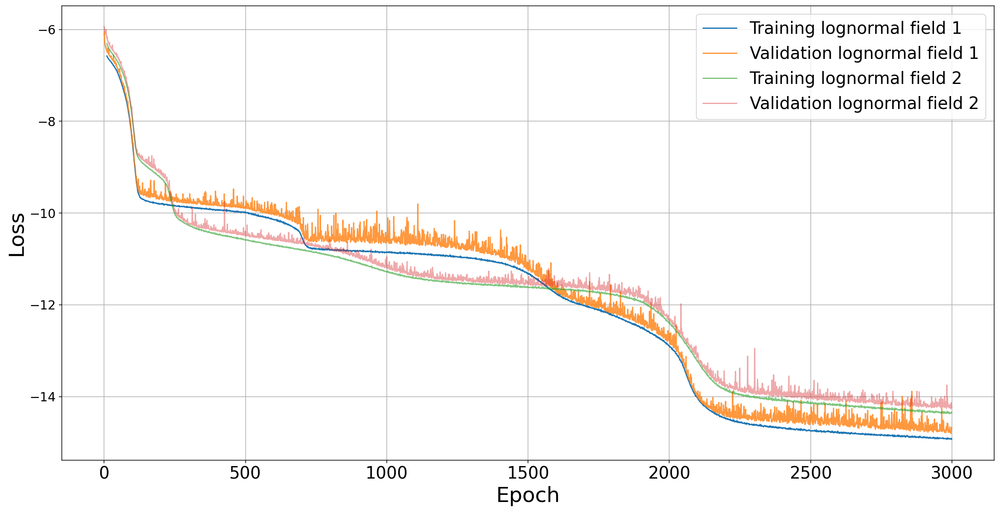

In [18]:
plt.figure(figsize=(20,10))
#plt.plot(losses_Gauss_1['loss'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_1['val_loss'][10:], label="Validation Gaussian field",alpha=0.9)
#plt.plot(losses_Gauss_2['loss'][10:], label="Training Gaussian field",alpha=0.8)
#plt.plot(losses_Gauss_2['val_loss'][10:], label="Validation Gaussian field",alpha=0.7)
plt.plot(losses_lognormal_1['loss'][10:], label="Training lognormal field 1")
plt.plot(losses_lognormal_1['val_loss'], label="Validation lognormal field 1",alpha=0.8)
plt.plot(losses_lognormal_2['loss'][10:], label="Training lognormal field 2",alpha=0.6)
plt.plot(losses_lognormal_2['val_loss'], label="Validation lognormal field 2",alpha=0.4)
plt.grid()
#plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel("Loss",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/loss_lognormal.png',bbox_inches='tight')

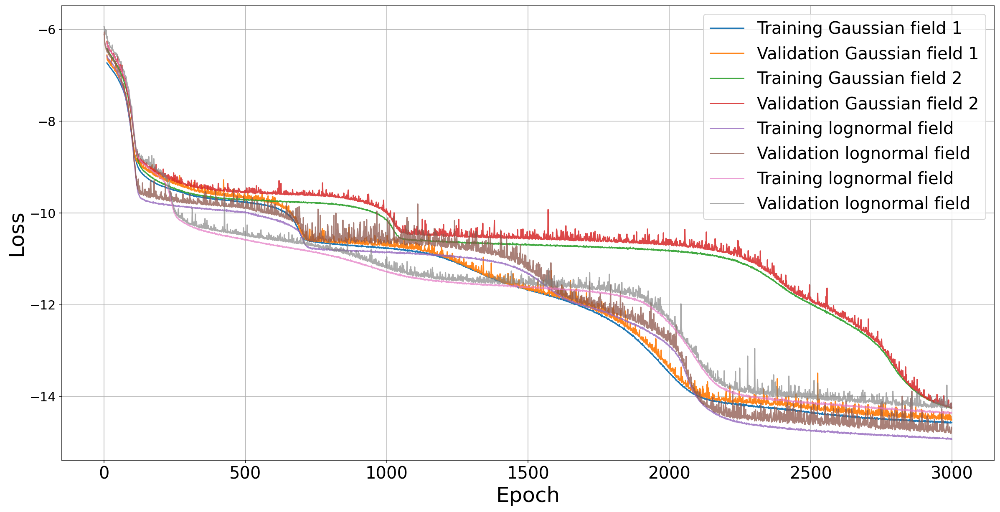

In [19]:
plt.figure(figsize=(20,10))
plt.plot(losses_Gauss_1['loss'][10:], label="Training Gaussian field 1")
plt.plot(losses_Gauss_1['val_loss'][10:], label="Validation Gaussian field 1",alpha=0.95)
plt.plot(losses_Gauss_2['loss'][10:], label="Training Gaussian field 2",alpha=0.9)
plt.plot(losses_Gauss_2['val_loss'][10:], label="Validation Gaussian field 2",alpha=0.85)
plt.plot(losses_lognormal_1['loss'][10:], label="Training lognormal field",alpha=0.8)
plt.plot(losses_lognormal_1['val_loss'], label="Validation lognormal field",alpha=0.75)
plt.plot(losses_lognormal_2['loss'][10:], label="Training lognormal field",alpha=0.7)
plt.plot(losses_lognormal_2['val_loss'], label="Validation lognormal field",alpha=0.65)
plt.grid()
#plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel("Loss",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/loss_2.png',bbox_inches='tight')

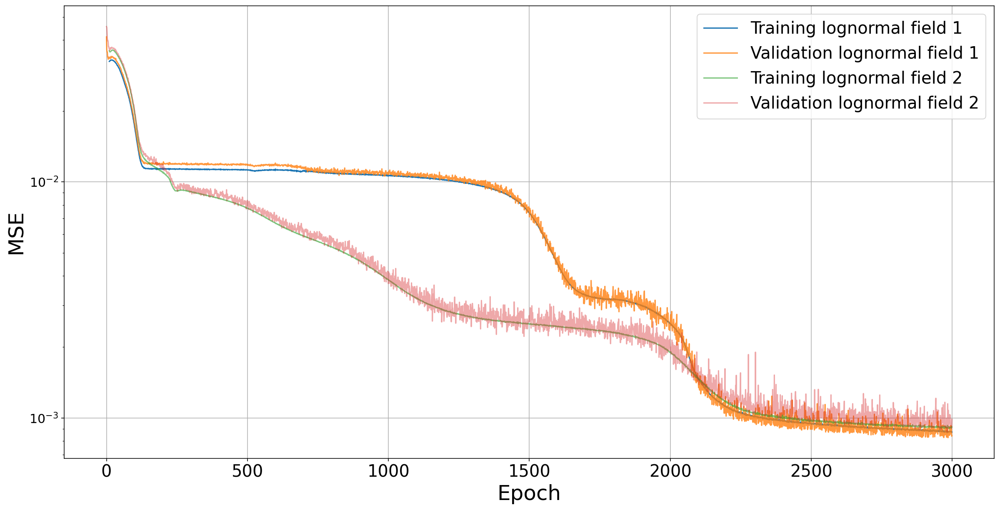

In [20]:
plt.figure(figsize=(20,10))
#plt.plot(losses_Gauss_1['MSE'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_1['val_MSE'][10:], label="Validation Gaussian field",alpha=0.8)
#plt.plot(losses_Gauss_2['MSE'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_2['val_MSE'][10:], label="Validation Gaussian field",alpha=0.8)
plt.plot(losses_lognormal_1['MSE'][10:], label="Training lognormal field 1")
plt.plot(losses_lognormal_1['val_MSE'], label="Validation lognormal field 1",alpha=0.8)
plt.plot(losses_lognormal_2['MSE'][10:], label="Training lognormal field 2",alpha=0.6)
plt.plot(losses_lognormal_2['val_MSE'], label="Validation lognormal field 2",alpha=0.4)
plt.grid()
plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel("MSE",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/MSE_lognormal.png',bbox_inches='tight')

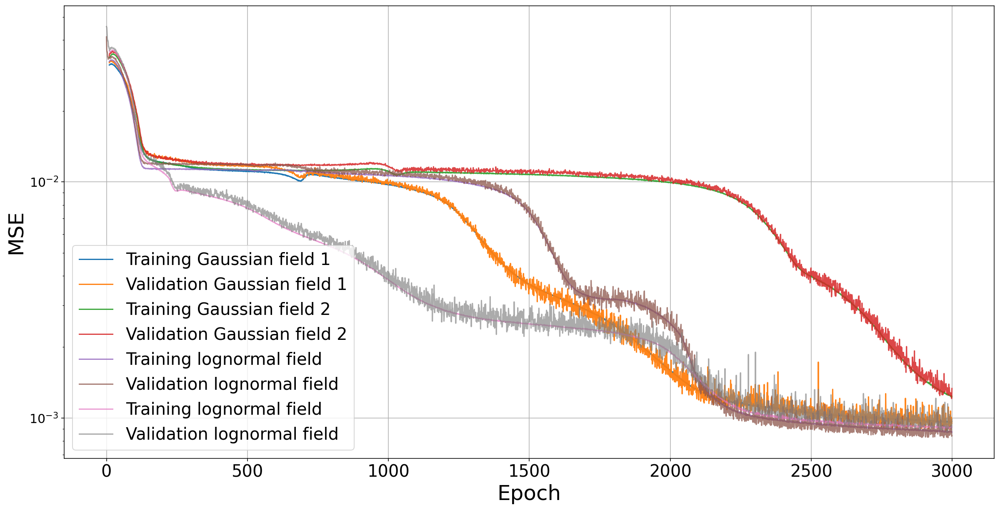

In [21]:
plt.figure(figsize=(20,10))
plt.plot(losses_Gauss_1['MSE'][10:], label="Training Gaussian field 1")
plt.plot(losses_Gauss_1['val_MSE'][10:], label="Validation Gaussian field 1",alpha=0.95)
plt.plot(losses_Gauss_2['MSE'][10:], label="Training Gaussian field 2",alpha=0.9)
plt.plot(losses_Gauss_2['val_MSE'][10:], label="Validation Gaussian field 2",alpha=0.85)
plt.plot(losses_lognormal_1['MSE'][10:], label="Training lognormal field",alpha=0.8)
plt.plot(losses_lognormal_1['val_MSE'], label="Validation lognormal field",alpha=0.75)
plt.plot(losses_lognormal_2['MSE'][10:], label="Training lognormal field",alpha=0.7)
plt.plot(losses_lognormal_2['val_MSE'], label="Validation lognormal field",alpha=0.65)
plt.grid()
plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel("MSE",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/MSE_2.png',bbox_inches='tight')

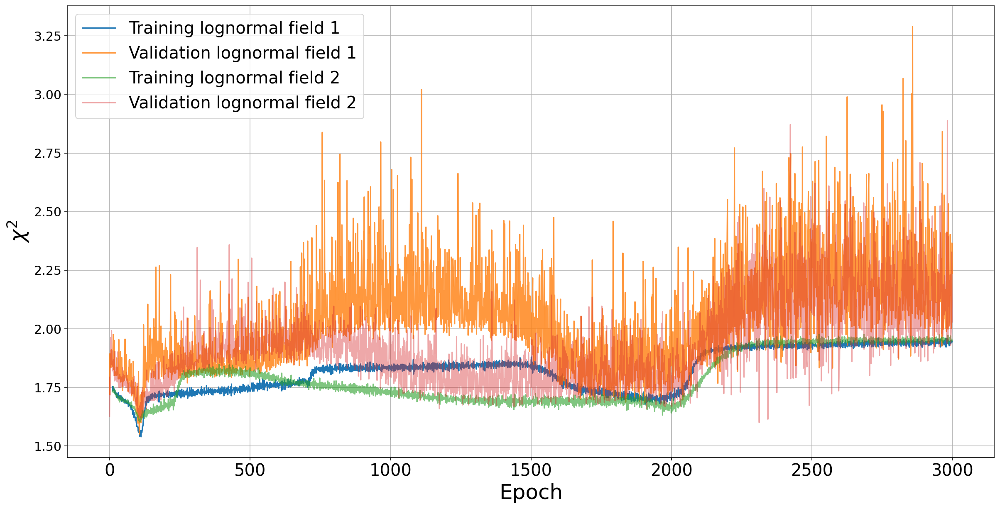

In [22]:
plt.figure(figsize=(20,10))
#plt.plot(losses_Gauss_1['chisq'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_1['val_chisq'][10:], label="Validation Gaussian field",alpha=0.8)
#plt.plot(losses_Gauss_2['chisq'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_2['val_chisq'][10:], label="Validation Gaussian field",alpha=0.8)
plt.plot(losses_lognormal_1['chisq'][10:], label="Training lognormal field 1")
plt.plot(losses_lognormal_1['val_chisq'], label="Validation lognormal field 1",alpha=0.8)
plt.plot(losses_lognormal_2['chisq'][10:], label="Training lognormal field 2",alpha=0.6)
plt.plot(losses_lognormal_2['val_chisq'], label="Validation lognormal field 2",alpha=0.4)
plt.grid()
#plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel(f"$\chi^2$",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/chisq_lognormal.png',bbox_inches='tight')

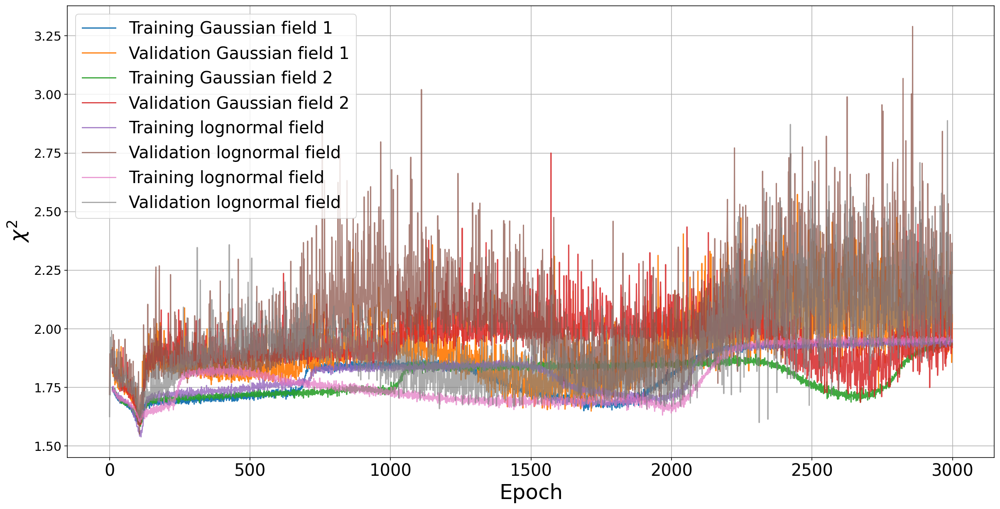

In [23]:
plt.figure(figsize=(20,10))
plt.plot(losses_Gauss_1['chisq'][10:], label="Training Gaussian field 1")
plt.plot(losses_Gauss_1['val_chisq'][10:], label="Validation Gaussian field 1",alpha=0.95)
plt.plot(losses_Gauss_2['chisq'][10:], label="Training Gaussian field 2",alpha=0.9)
plt.plot(losses_Gauss_2['val_chisq'][10:], label="Validation Gaussian field 2",alpha=0.85)
plt.plot(losses_lognormal_1['chisq'][10:], label="Training lognormal field",alpha=0.8)
plt.plot(losses_lognormal_1['val_chisq'], label="Validation lognormal field",alpha=0.75)
plt.plot(losses_lognormal_2['chisq'][10:], label="Training lognormal field",alpha=0.7)
plt.plot(losses_lognormal_2['val_chisq'], label="Validation lognormal field",alpha=0.65)
plt.grid()
#plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel(f"$\chi^2$",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/chisq_2.png',bbox_inches='tight')

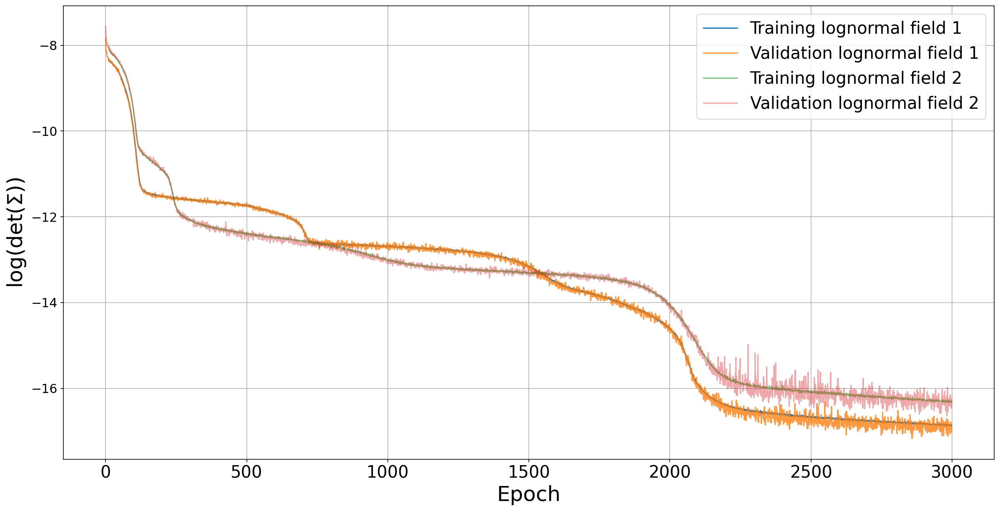

In [24]:
plt.figure(figsize=(20,10))
#plt.plot(losses_Gauss_1['log_det_Sigma'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_1['val_log_det_Sigma'][10:], label="Validation Gaussian field",alpha=0.8)
#plt.plot(losses_Gauss_2['log_det_Sigma'][10:], label="Training Gaussian field")
#plt.plot(losses_Gauss_2['val_log_det_Sigma'][10:], label="Validation Gaussian field",alpha=0.8)
plt.plot(losses_lognormal_1['log_det_Sigma'][10:], label="Training lognormal field 1")
plt.plot(losses_lognormal_1['val_log_det_Sigma'], label="Validation lognormal field 1",alpha=0.8)
plt.plot(losses_lognormal_2['log_det_Sigma'][10:], label="Training lognormal field 2",alpha=0.6)
plt.plot(losses_lognormal_2['val_log_det_Sigma'], label="Validation lognormal field 2",alpha=0.4)
plt.grid()
#plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel(f"log(det($\Sigma$))",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/log_det_Sigma_lognormal.png',bbox_inches='tight')

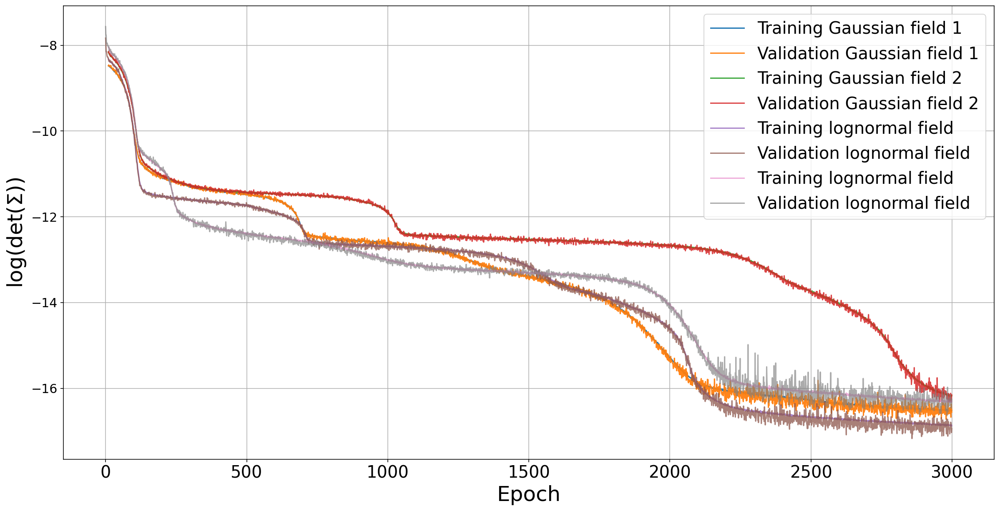

In [25]:
plt.figure(figsize=(20,10))
plt.plot(losses_Gauss_1['log_det_Sigma'][10:], label="Training Gaussian field 1")
plt.plot(losses_Gauss_1['val_log_det_Sigma'][10:], label="Validation Gaussian field 1",alpha=0.95)
plt.plot(losses_Gauss_2['log_det_Sigma'][10:], label="Training Gaussian field 2",alpha=0.9)
plt.plot(losses_Gauss_2['val_log_det_Sigma'][10:], label="Validation Gaussian field 2",alpha=0.85)
plt.plot(losses_lognormal_1['log_det_Sigma'][10:], label="Training lognormal field",alpha=0.8)
plt.plot(losses_lognormal_1['val_log_det_Sigma'], label="Validation lognormal field",alpha=0.75)
plt.plot(losses_lognormal_2['log_det_Sigma'][10:], label="Training lognormal field",alpha=0.6)
plt.plot(losses_lognormal_2['val_log_det_Sigma'], label="Validation lognormal field",alpha=0.65)
plt.grid()
#plt.yscale("log")
plt.legend(fontsize=20)
plt.xlabel("Epoch",fontsize=25)
plt.ylabel(f"log(det($\Sigma$))",fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#plt.xticks(range(10, len(history.history["loss"])), fontsize=15)
plt.yticks(fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/log_det_Sigma_2.png',bbox_inches='tight')

#### It's bad, since the loss curve looks different.
#### I think the training steps is too unstable, therefore we should give large batch size.
#### But it is difficult due to the computational cost!

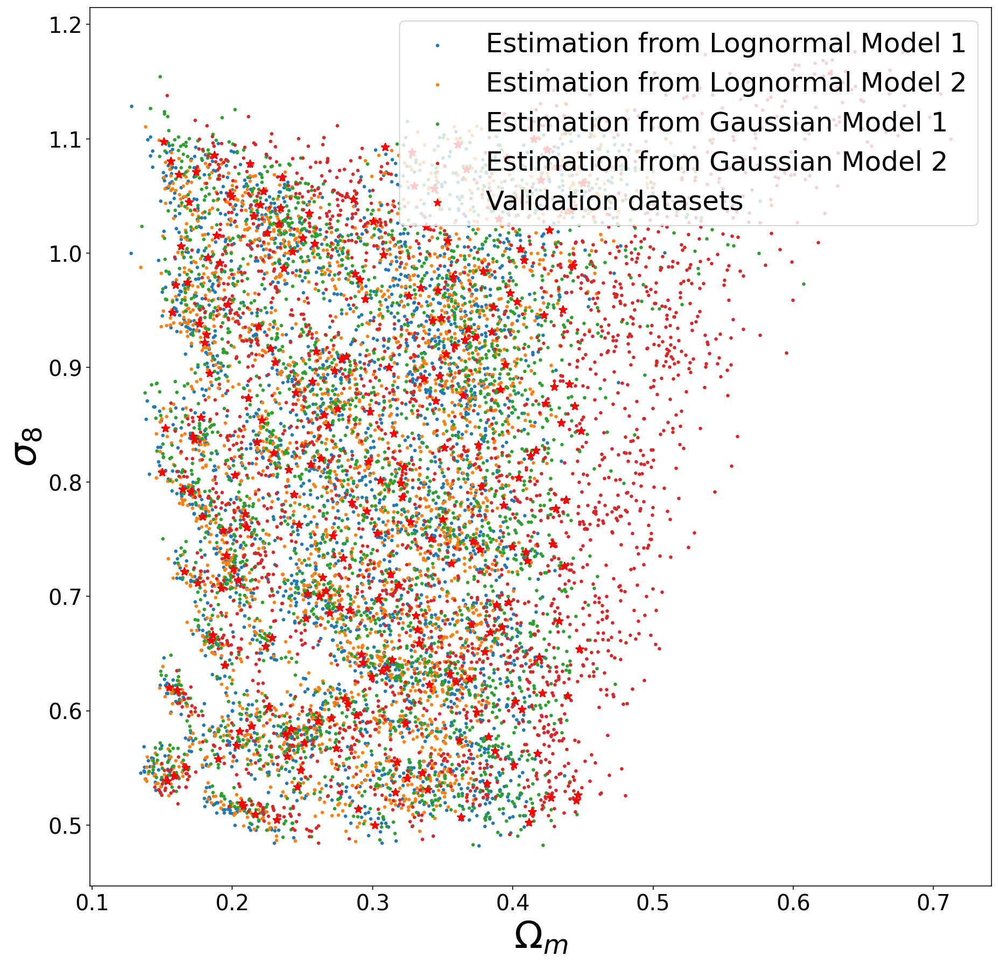

In [26]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_val_Gauss_1[:,0],prediction_val_Gauss_1[:,1], label=f'Estimation from Lognormal Model 1',s=5)
plt.scatter(prediction_val_Gauss_2[:,0],prediction_val_Gauss_2[:,1], label=f'Estimation from Lognormal Model 2',s=5)
plt.scatter(prediction_val_lognormal_1[:,0],prediction_val_lognormal_1[:,1], label=f'Estimation from Gaussian Model 1',s=5)
plt.scatter(prediction_val_lognormal_2[:,0],prediction_val_lognormal_2[:,1], label=f'Estimation from Gaussian Model 2',s=5)
plt.scatter(labels_val_lognormal[:,0], labels_val_lognormal[:,1], marker='*', label='Validation datasets', s=50, color="red")
plt.legend(fontsize=25)
plt.ylabel(f"$\sigma_8$", fontsize=35)
plt.xlabel(f"$\Omega_m$", fontsize=35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Validation_test_2D_2.jpg',bbox_inches='tight')
plt.show();

In [27]:
Omega_M_x                 =np.linspace(np.amax(labels_val_Gauss[:,0]), np.amin(labels_val_Gauss[:,0]),100)
sigma_8_x                 =np.linspace(np.amax(labels_val_Gauss[:,1]), np.amin(labels_val_Gauss[:,1]),100)
Omega_M_MSE_Gauss_1       = 1. / len(prediction_val_Gauss_1[:,0]) * np.sum((labels_val_Gauss[:,0]-prediction_val_Gauss_1[:,0])**2)
sigma_8_MSE_Gauss_1       = 1. / len(prediction_val_Gauss_1[:,1]) * np.sum((labels_val_Gauss[:,1]-prediction_val_Gauss_1[:,1])**2)
Omega_M_MSE_Gauss_2       = 1. / len(prediction_val_Gauss_2[:,0]) * np.sum((labels_val_Gauss[:,0]-prediction_val_Gauss_2[:,0])**2)
sigma_8_MSE_Gauss_2       = 1. / len(prediction_val_Gauss_2[:,1]) * np.sum((labels_val_Gauss[:,1]-prediction_val_Gauss_2[:,1])**2)
Omega_M_MSE_lognormal_1   = 1. / len(prediction_val_lognormal_1[:,0]) * np.sum((labels_val_lognormal[:,0]-prediction_val_lognormal_1[:,0])**2)
sigma_8_MSE_lognormal_1   = 1. / len(prediction_val_lognormal_1[:,1]) * np.sum((labels_val_lognormal[:,1]-prediction_val_lognormal_1[:,1])**2)
Omega_M_MSE_lognormal_2   = 1. / len(prediction_val_lognormal_2[:,0]) * np.sum((labels_val_lognormal[:,0]-prediction_val_lognormal_2[:,0])**2)
sigma_8_MSE_lognormal_2   = 1. / len(prediction_val_lognormal_2[:,1]) * np.sum((labels_val_lognormal[:,1]-prediction_val_lognormal_2[:,1])**2)

In [28]:
step_size = 5

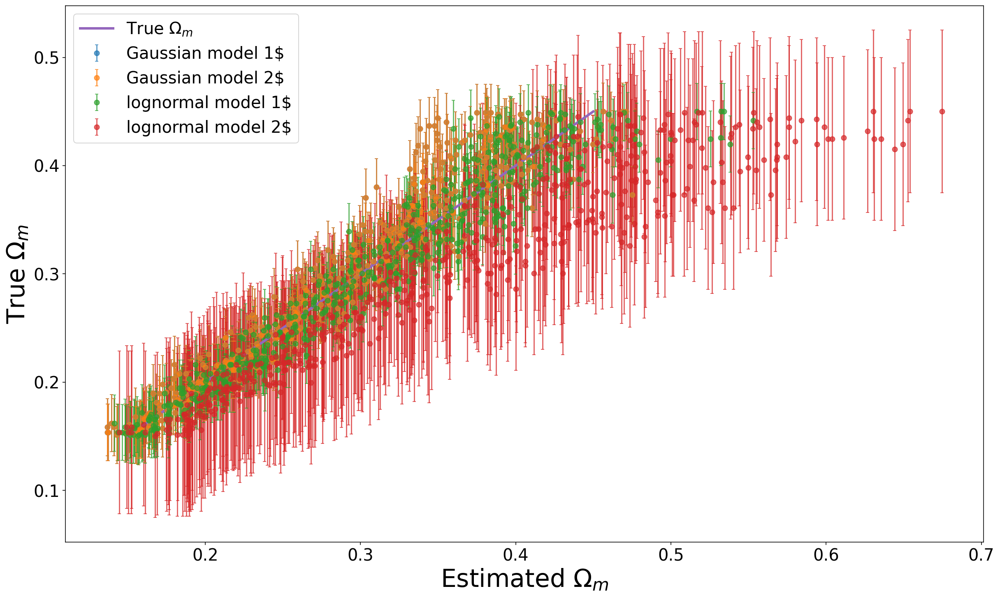

In [29]:
plt.figure(figsize=(20,12))
plt.errorbar(prediction_val_Gauss_1[::step_size, 0],labels_val_Gauss[::step_size, 0], np.sqrt(Omega_M_MSE_Gauss_1), label=f'Gaussian model 1$', fmt='o',capsize=2, alpha=0.7)
plt.errorbar(prediction_val_Gauss_1[::step_size, 0],labels_val_Gauss[::step_size, 0], np.sqrt(Omega_M_MSE_Gauss_1), label=f'Gaussian model 2$', fmt='o',capsize=2, alpha=0.7)
plt.errorbar(prediction_val_lognormal_1[::step_size, 0],labels_val_lognormal[::step_size, 0], np.sqrt(Omega_M_MSE_lognormal_1), label=f'lognormal model 1$', fmt='o',capsize=2, alpha=0.7)
plt.errorbar(prediction_val_lognormal_2[::step_size, 0],labels_val_lognormal[::step_size, 0], np.sqrt(Omega_M_MSE_lognormal_2), label=f'lognormal model 2$', fmt='o',capsize=2, alpha=0.7)
plt.plot(Omega_M_x, Omega_M_x, label="True $\Omega_m$",linewidth=3)
plt.legend(fontsize=20)
plt.xlabel(f"Estimated $\Omega_m$", fontsize=30)
plt.ylabel(f"True $\Omega_m$", 
           fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v4/Errobar_Omega_M_2.png',bbox_inches='tight')
plt.show()

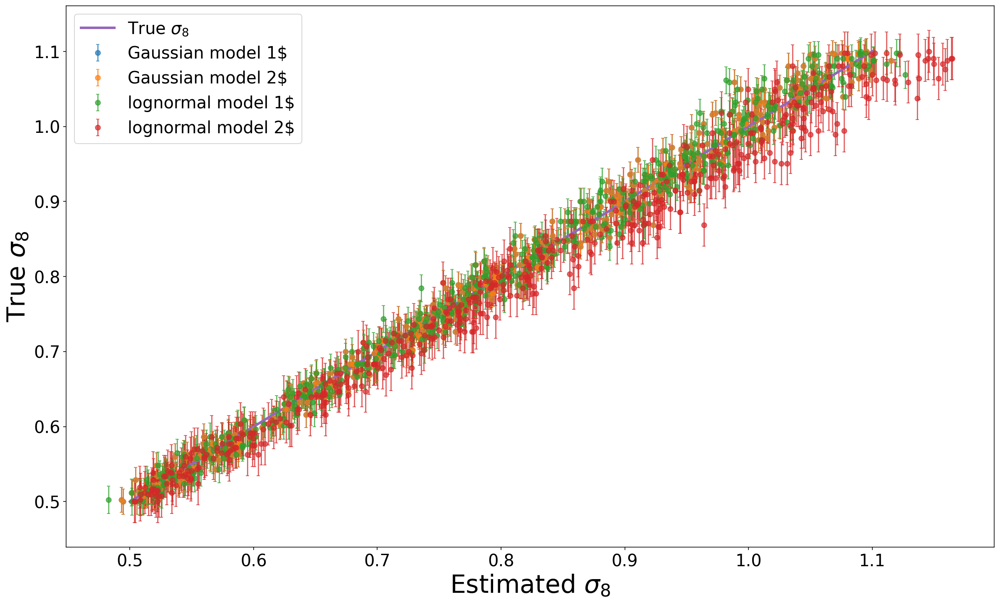

In [30]:
plt.figure(figsize=(20,12))
plt.errorbar(prediction_val_Gauss_1[::step_size, 1],labels_val_Gauss[::step_size, 1], np.sqrt(sigma_8_MSE_Gauss_1), label=f'Gaussian model 1$', fmt='o',capsize=2, alpha=0.7)
plt.errorbar(prediction_val_Gauss_1[::step_size, 1],labels_val_Gauss[::step_size, 1], np.sqrt(sigma_8_MSE_Gauss_1), label=f'Gaussian model 2$', fmt='o',capsize=2, alpha=0.7)
plt.errorbar(prediction_val_lognormal_1[::step_size, 1],labels_val_lognormal[::step_size, 1], np.sqrt(sigma_8_MSE_lognormal_1), label=f'lognormal model 1$', fmt='o',capsize=2, alpha=0.7)
plt.errorbar(prediction_val_lognormal_2[::step_size, 1],labels_val_lognormal[::step_size, 1], np.sqrt(sigma_8_MSE_lognormal_2), label=f'lognormal model 2$', fmt='o',capsize=2, alpha=0.7)
plt.plot(sigma_8_x, sigma_8_x, label="True $\sigma_8$",linewidth=3)
plt.legend(fontsize=20)
plt.xlabel(f"Estimated $\sigma_8$", fontsize=30)
plt.ylabel(f"True $\sigma_8$", 
           fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v4/Errobar_sigma_8_2.png',bbox_inches='tight')
plt.show()

#### There is no systematics in measurement, but additional systematics from ML

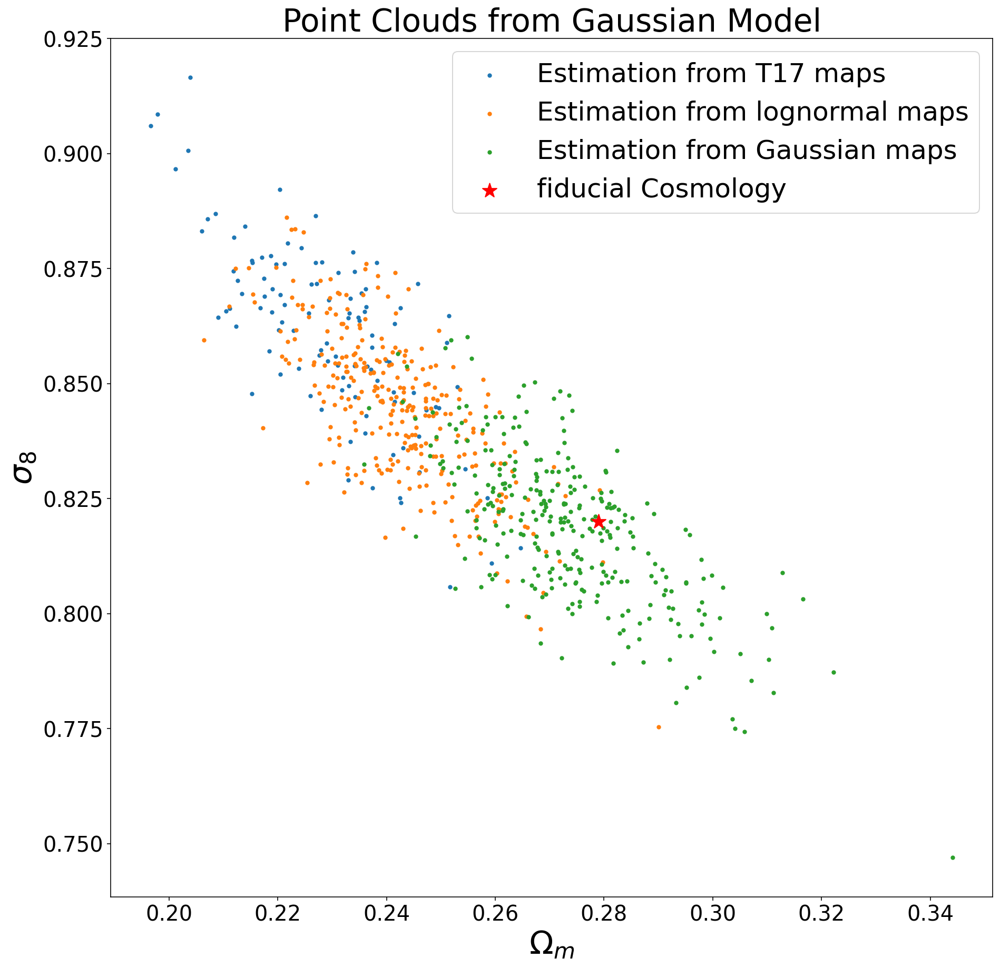

In [31]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_1[:,0],prediction_T17_Gauss_1[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_1_Gauss_1[:,0],prediction_lognormal_1_Gauss_1[:,1], label=f'Estimation from lognormal maps',s=10)
plt.scatter(prediction_Gauss_1_Gauss_1[:,0],prediction_Gauss_1_Gauss_1[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=25) 
plt.title('Point Clouds from Gaussian Model',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_Gauss_11.png',bbox_inches='tight')
plt.show();

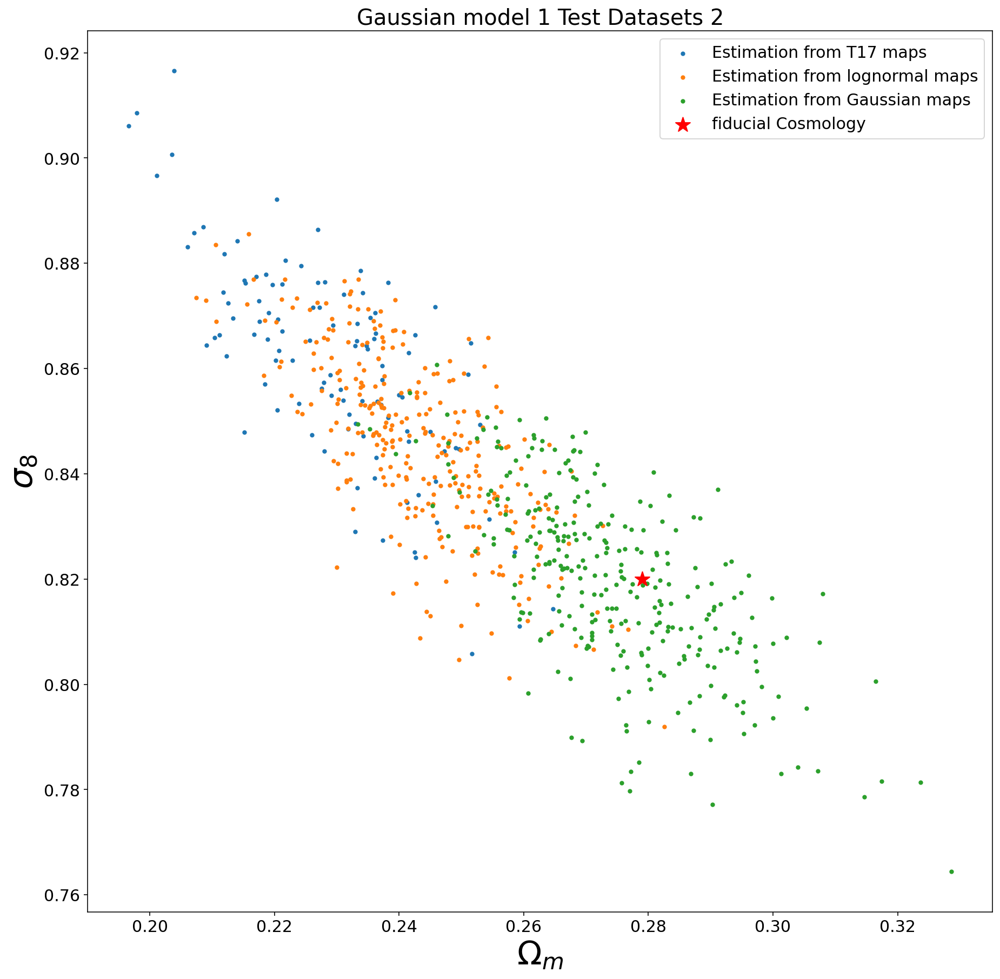

In [32]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_1[:,0],prediction_T17_Gauss_1[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_2_Gauss_1[:,0],prediction_lognormal_2_Gauss_1[:,1], label=f'Estimation from lognormal maps',s=10)
plt.scatter(prediction_Gauss_2_Gauss_1[:,0],prediction_Gauss_2_Gauss_1[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.title('Gaussian model 1 Test Datasets 2',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_Gauss_21.png',bbox_inches='tight')
plt.show();

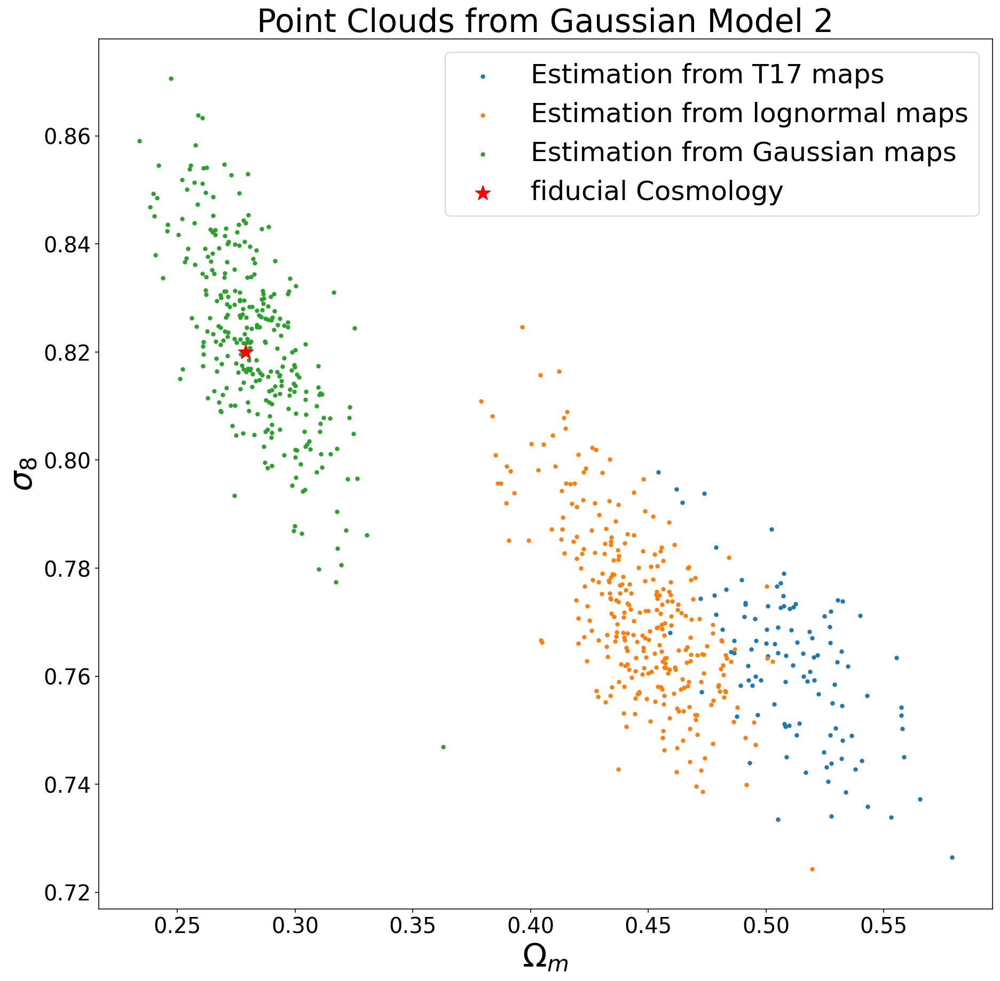

In [33]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_2[:,0],prediction_T17_Gauss_2[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_1_Gauss_2[:,0],prediction_lognormal_1_Gauss_2[:,1], label=f'Estimation from lognormal maps',s=10)
plt.scatter(prediction_Gauss_1_Gauss_2[:,0],prediction_Gauss_1_Gauss_2[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=25) 
plt.title('Point Clouds from Gaussian Model 2',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_Gauss_12.jpg',bbox_inches='tight')
plt.show();

#### Ok changing test data sets doesn't change so much, but training data not.
#### Totally different direction biased.
#### Can we predict the direction of bias?
#### It is interesting to know which content of information is trained, filter-based interpretation...

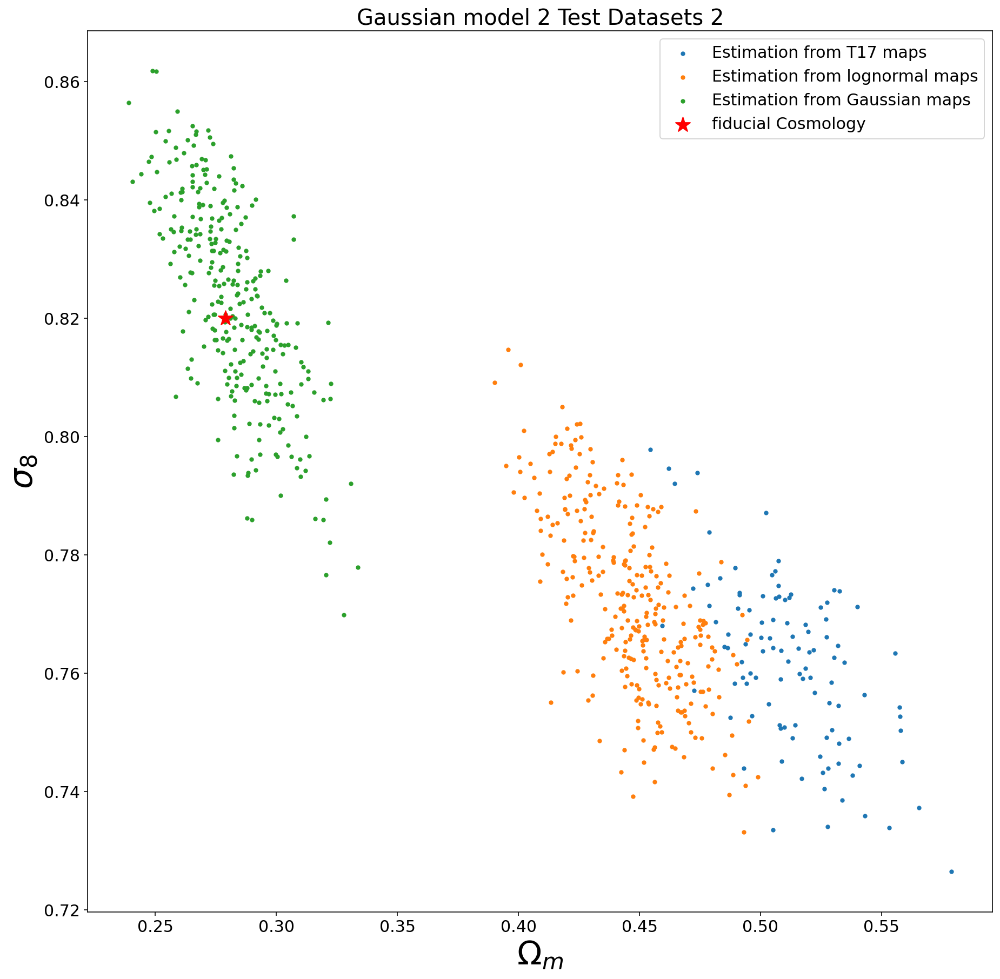

In [34]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_2[:,0],prediction_T17_Gauss_2[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_2_Gauss_2[:,0],prediction_lognormal_2_Gauss_2[:,1], label=f'Estimation from lognormal maps',s=10)
plt.scatter(prediction_Gauss_2_Gauss_2[:,0],prediction_Gauss_2_Gauss_2[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.title('Gaussian model 2 Test Datasets 2',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_Gauss_22.png',bbox_inches='tight')
plt.show();

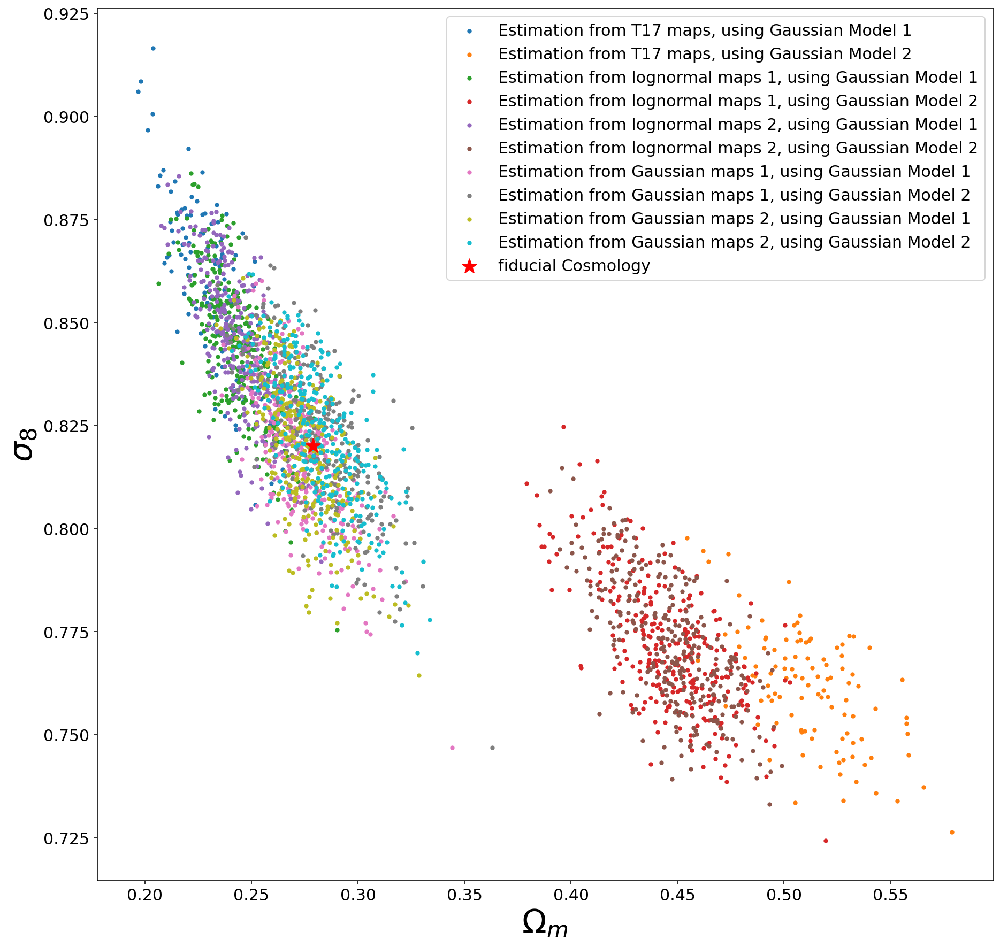

In [35]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_1[:,0],prediction_T17_Gauss_1[:,1], label=f'Estimation from T17 maps, using Gaussian Model 1',s=10)
plt.scatter(prediction_T17_Gauss_2[:,0],prediction_T17_Gauss_2[:,1], label=f'Estimation from T17 maps, using Gaussian Model 2',s=10)
plt.scatter(prediction_lognormal_1_Gauss_1[:,0],prediction_lognormal_1_Gauss_1[:,1], label=f'Estimation from lognormal maps 1, using Gaussian Model 1',s=10)
plt.scatter(prediction_lognormal_1_Gauss_2[:,0],prediction_lognormal_1_Gauss_2[:,1], label=f'Estimation from lognormal maps 1, using Gaussian Model 2',s=10)
plt.scatter(prediction_lognormal_2_Gauss_1[:,0],prediction_lognormal_2_Gauss_1[:,1], label=f'Estimation from lognormal maps 2, using Gaussian Model 1',s=10)
plt.scatter(prediction_lognormal_2_Gauss_2[:,0],prediction_lognormal_2_Gauss_2[:,1], label=f'Estimation from lognormal maps 2, using Gaussian Model 2',s=10)
plt.scatter(prediction_Gauss_1_Gauss_1[:,0],prediction_Gauss_1_Gauss_1[:,1], label=f'Estimation from Gaussian maps 1, using Gaussian Model 1',s=10)
plt.scatter(prediction_Gauss_1_Gauss_2[:,0],prediction_Gauss_1_Gauss_2[:,1], label=f'Estimation from Gaussian maps 1, using Gaussian Model 2',s=10)
plt.scatter(prediction_Gauss_2_Gauss_1[:,0],prediction_Gauss_2_Gauss_1[:,1], label=f'Estimation from Gaussian maps 2, using Gaussian Model 1',s=10)
plt.scatter(prediction_Gauss_2_Gauss_2[:,0],prediction_Gauss_2_Gauss_2[:,1], label=f'Estimation from Gaussian maps 2, using Gaussian Model 2',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
#plt.title('Gaussian model 2 Test Datasets 2',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_Gauss.png',bbox_inches='tight')
plt.show();

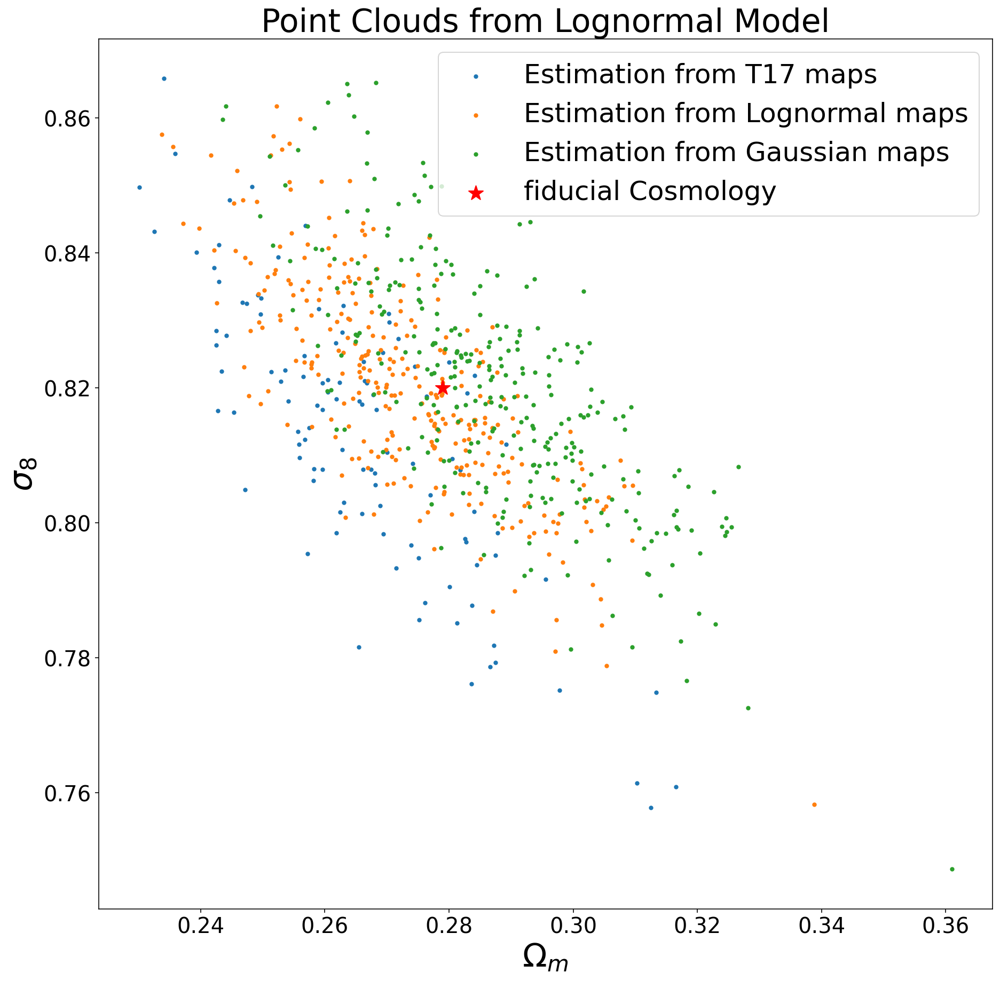

In [36]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_1[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_1_lognormal_1[:,0],prediction_lognormal_1_lognormal_1[:,1], label=f'Estimation from Lognormal maps',s=10)
plt.scatter(prediction_Gauss_1_lognormal_1[:,0],prediction_Gauss_1_lognormal_1[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=25) 
plt.title('Point Clouds from Lognormal Model',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_lognormal_11.png',bbox_inches='tight')
plt.show();

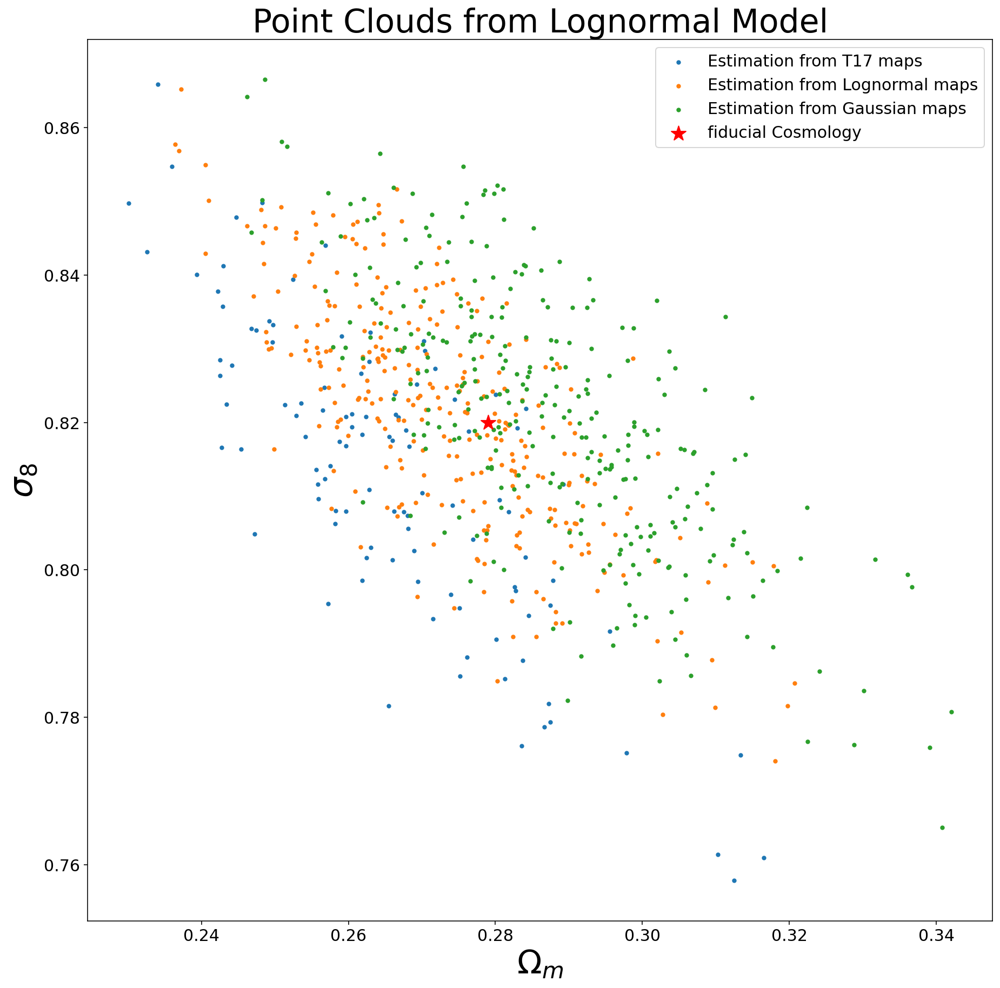

In [37]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_1[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_2_lognormal_1[:,0],prediction_lognormal_2_lognormal_1[:,1], label=f'Estimation from Lognormal maps',s=10)
plt.scatter(prediction_Gauss_2_lognormal_1[:,0],prediction_Gauss_2_lognormal_1[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.title('Point Clouds from Lognormal Model',fontsize=30)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_lognormal_21.png',bbox_inches='tight')
plt.show();

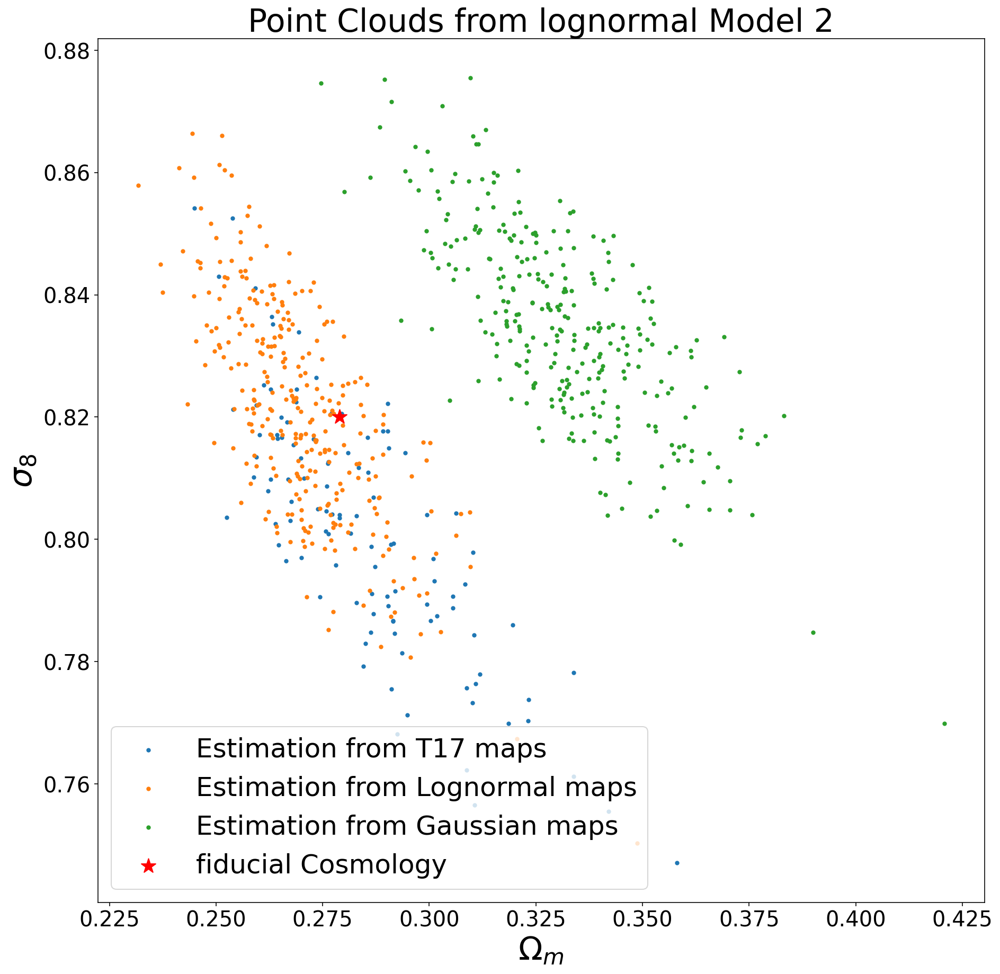

In [38]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_lognormal_2[:,0],prediction_T17_lognormal_2[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_1_lognormal_2[:,0],prediction_lognormal_1_lognormal_2[:,1], label=f'Estimation from Lognormal maps',s=10)
plt.scatter(prediction_Gauss_1_lognormal_2[:,0],prediction_Gauss_1_lognormal_2[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=25) 
plt.title('Point Clouds from lognormal Model 2',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_lognormal_12.jpg',bbox_inches='tight')
plt.show();

#### That looks nicer, I use for result section.

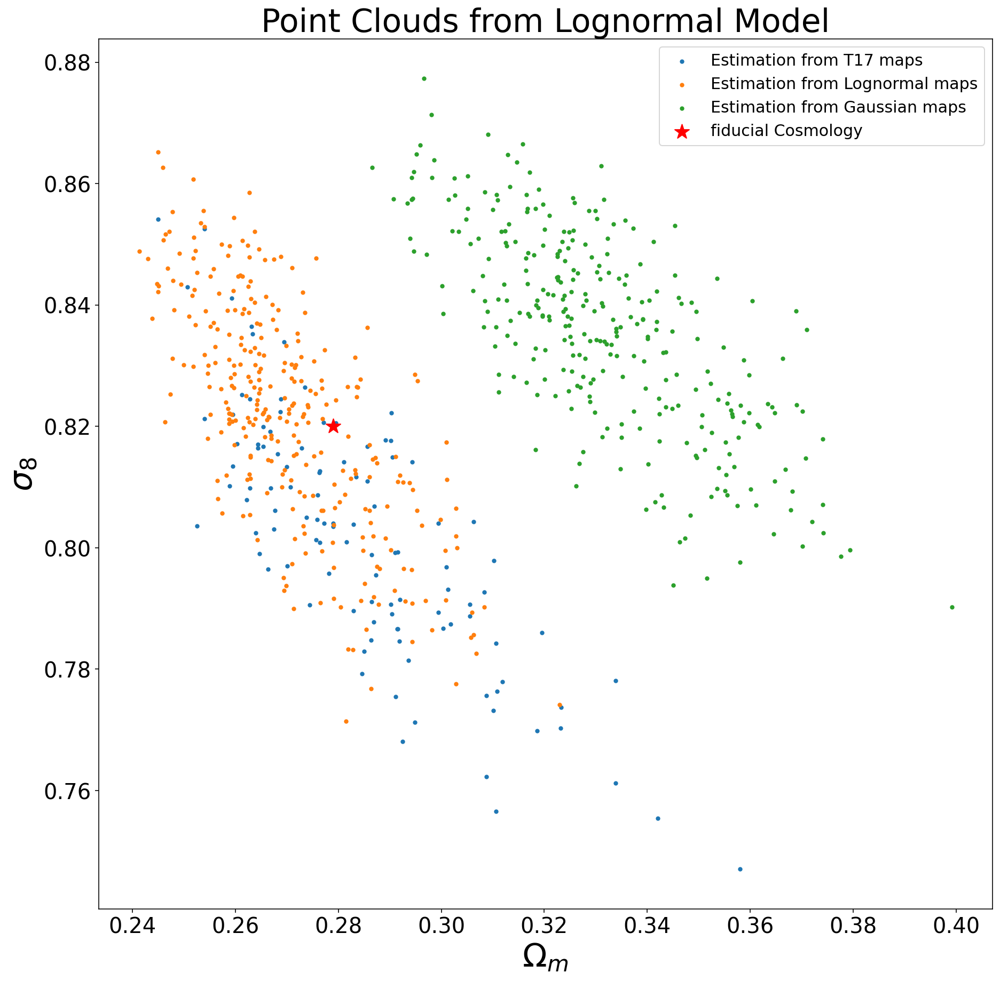

In [39]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_lognormal_2[:,0],prediction_T17_lognormal_2[:,1], label=f'Estimation from T17 maps',s=10)
plt.scatter(prediction_lognormal_2_lognormal_2[:,0],prediction_lognormal_2_lognormal_2[:,1], label=f'Estimation from Lognormal maps',s=10)
plt.scatter(prediction_Gauss_2_lognormal_2[:,0],prediction_Gauss_2_lognormal_2[:,1], label=f'Estimation from Gaussian maps',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.title('Point Clouds from Lognormal Model',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_lognormal_22.png',bbox_inches='tight')
plt.show();

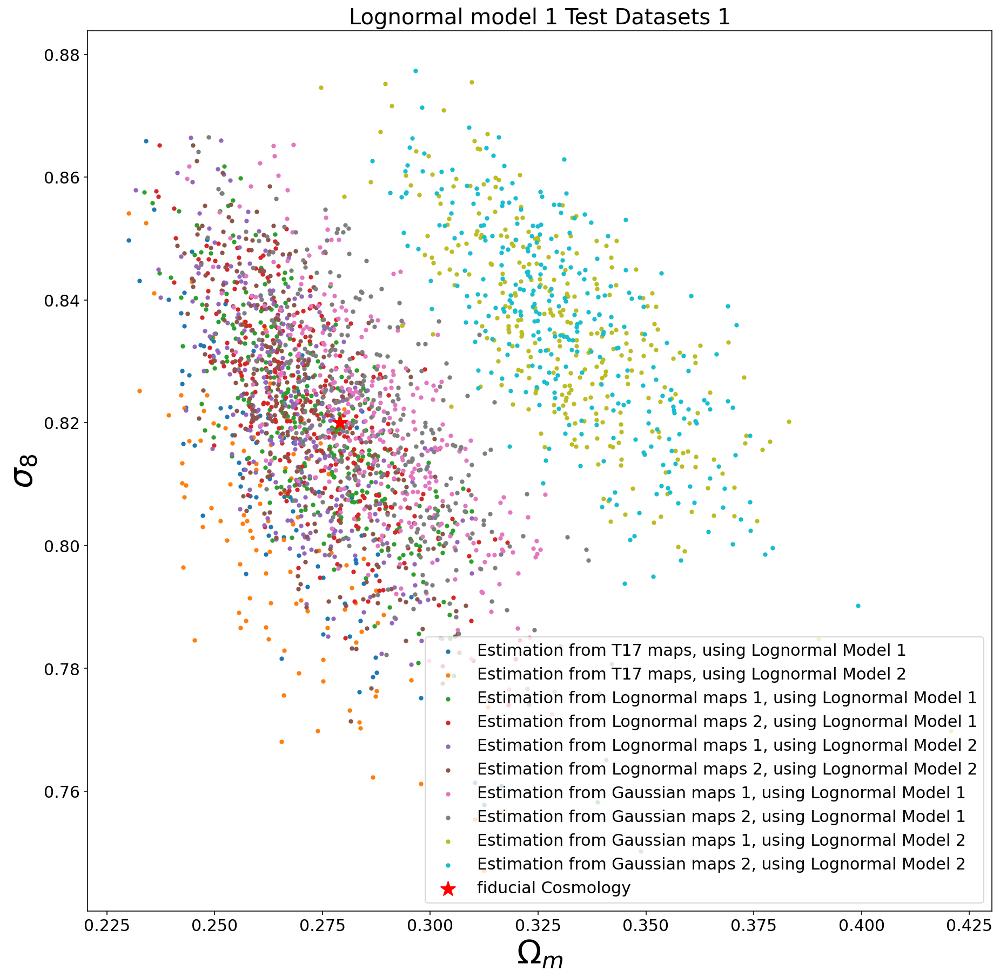

In [40]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_1[:,1], label=f'Estimation from T17 maps, using Lognormal Model 1',s=10)
plt.scatter(prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_2[:,1], label=f'Estimation from T17 maps, using Lognormal Model 2',s=10)
plt.scatter(prediction_lognormal_1_lognormal_1[:,0],prediction_lognormal_1_lognormal_1[:,1], label=f'Estimation from Lognormal maps 1, using Lognormal Model 1',s=10)
plt.scatter(prediction_lognormal_2_lognormal_1[:,0],prediction_lognormal_2_lognormal_1[:,1], label=f'Estimation from Lognormal maps 2, using Lognormal Model 1',s=10)
plt.scatter(prediction_lognormal_1_lognormal_2[:,0],prediction_lognormal_1_lognormal_2[:,1], label=f'Estimation from Lognormal maps 1, using Lognormal Model 2',s=10)
plt.scatter(prediction_lognormal_2_lognormal_2[:,0],prediction_lognormal_2_lognormal_2[:,1], label=f'Estimation from Lognormal maps 2, using Lognormal Model 2',s=10)
plt.scatter(prediction_Gauss_1_lognormal_1[:,0],prediction_Gauss_1_lognormal_1[:,1], label=f'Estimation from Gaussian maps 1, using Lognormal Model 1',s=10)
plt.scatter(prediction_Gauss_2_lognormal_1[:,0],prediction_Gauss_2_lognormal_1[:,1], label=f'Estimation from Gaussian maps 2, using Lognormal Model 1',s=10)
plt.scatter(prediction_Gauss_1_lognormal_2[:,0],prediction_Gauss_1_lognormal_2[:,1], label=f'Estimation from Gaussian maps 1, using Lognormal Model 2',s=10)
plt.scatter(prediction_Gauss_2_lognormal_2[:,0],prediction_Gauss_2_lognormal_2[:,1], label=f'Estimation from Gaussian maps 2, using Lognormal Model 2',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.title('Lognormal model 1 Test Datasets 1',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_2D_lognormal.png',bbox_inches='tight')
plt.show();

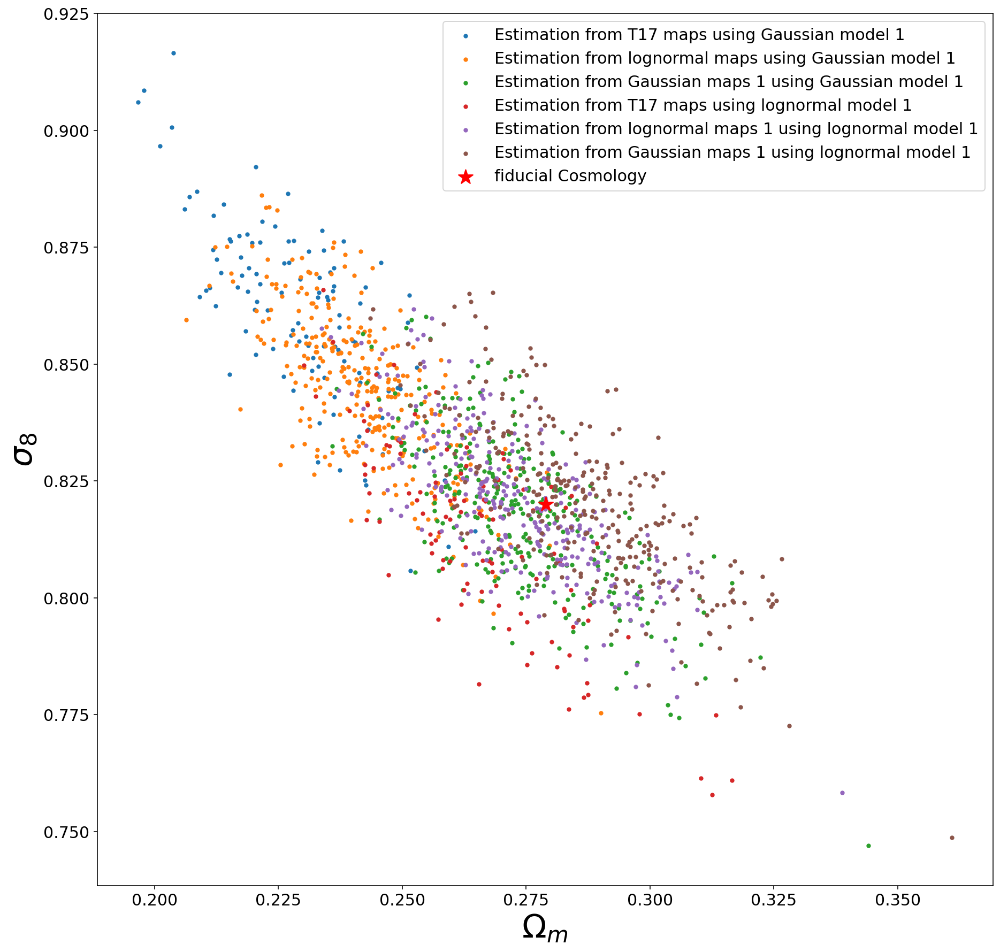

In [41]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_1[:,0],prediction_T17_Gauss_1[:,1], label=f'Estimation from T17 maps using Gaussian model 1',s=10)
plt.scatter(prediction_lognormal_1_Gauss_1[:,0],prediction_lognormal_1_Gauss_1[:,1], label=f'Estimation from lognormal maps using Gaussian model 1',s=10)
plt.scatter(prediction_Gauss_1_Gauss_1[:,0],prediction_Gauss_1_Gauss_1[:,1], label=f'Estimation from Gaussian maps 1 using Gaussian model 1',s=10)
plt.scatter(prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_1[:,1], label=f'Estimation from T17 maps using lognormal model 1',s=10)
plt.scatter(prediction_lognormal_1_lognormal_1[:,0],prediction_lognormal_1_lognormal_1[:,1], label=f'Estimation from lognormal maps 1 using lognormal model 1',s=10)
plt.scatter(prediction_Gauss_1_lognormal_1[:,0],prediction_Gauss_1_lognormal_1[:,1], label=f'Estimation from Gaussian maps 1 using lognormal model 1',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v4/Test_prediction_2D_11.png',bbox_inches='tight')
plt.show();

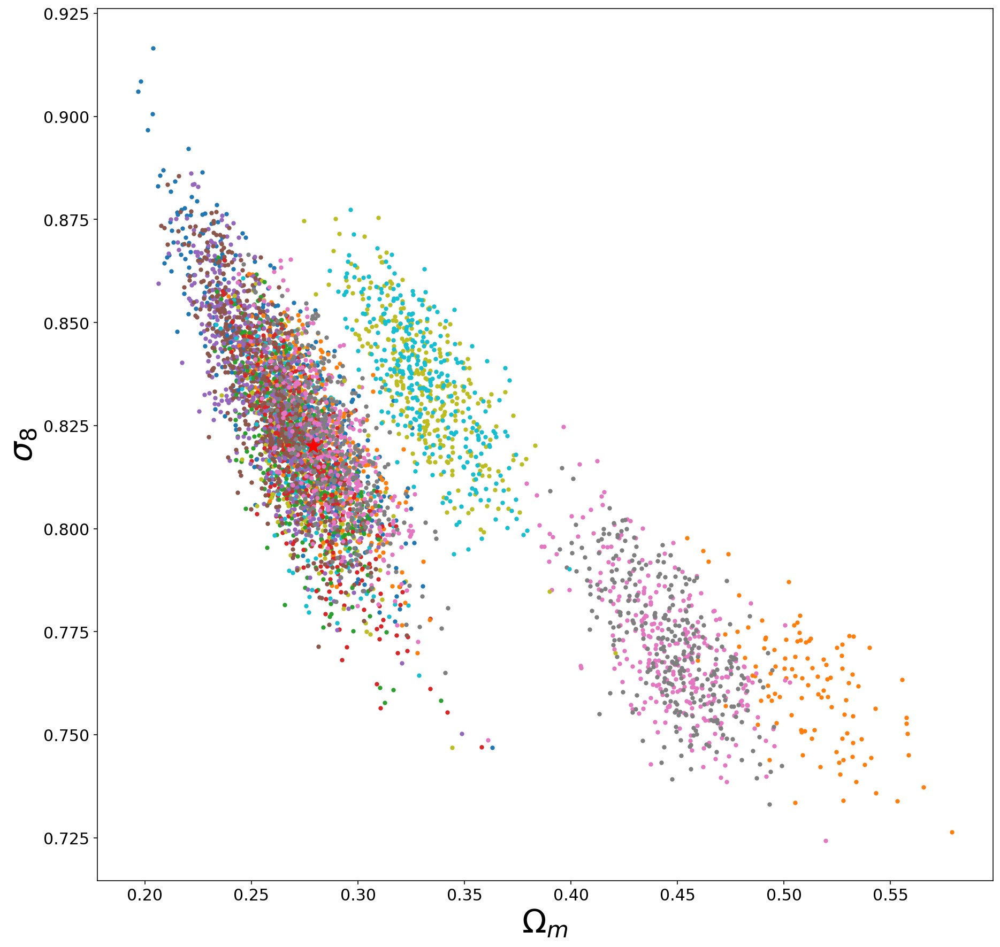

In [42]:
plt.figure(figsize=(15,15))
plt.scatter(prediction_T17_Gauss_1[:,0],prediction_T17_Gauss_1[:,1], label=f'Estimation from T17 maps using Gaussian model 1',s=10)
plt.scatter(prediction_T17_Gauss_2[:,0],prediction_T17_Gauss_2[:,1], label=f'Estimation from T17 maps using Gaussian model 2',s=10)
plt.scatter(prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_1[:,1], label=f'Estimation from T17 maps using lognormal model 1',s=10)
plt.scatter(prediction_T17_lognormal_2[:,0],prediction_T17_lognormal_2[:,1], label=f'Estimation from T17 maps using lognormal model 2',s=10)
plt.scatter(prediction_lognormal_1_Gauss_1[:,0],prediction_lognormal_1_Gauss_1[:,1], label=f'Estimation from lognormal maps 1 using Gaussian model 1',s=10)
plt.scatter(prediction_lognormal_2_Gauss_1[:,0],prediction_lognormal_2_Gauss_1[:,1], label=f'Estimation from lognormal maps 2 using Gaussian model 1',s=10)
plt.scatter(prediction_lognormal_1_Gauss_2[:,0],prediction_lognormal_1_Gauss_2[:,1], label=f'Estimation from lognormal maps 1 using Gaussian model 2',s=10)
plt.scatter(prediction_lognormal_2_Gauss_2[:,0],prediction_lognormal_2_Gauss_2[:,1], label=f'Estimation from lognormal maps 2 using Gaussian model 2',s=10)
plt.scatter(prediction_Gauss_1_Gauss_1[:,0],prediction_Gauss_1_Gauss_1[:,1], label=f'Estimation from Gaussian maps 1 using Gaussian model 1',s=10)
plt.scatter(prediction_Gauss_2_Gauss_1[:,0],prediction_Gauss_2_Gauss_1[:,1], label=f'Estimation from Gaussian maps 2 using Gaussian model 1',s=10)
plt.scatter(prediction_Gauss_1_Gauss_2[:,0],prediction_Gauss_1_Gauss_2[:,1], label=f'Estimation from Gaussian maps 1 using Gaussian model 2',s=10)
plt.scatter(prediction_Gauss_2_Gauss_2[:,0],prediction_Gauss_2_Gauss_2[:,1], label=f'Estimation from Gaussian maps 2 using Gaussian model 2',s=10)
plt.scatter(prediction_lognormal_1_lognormal_1[:,0],prediction_lognormal_1_lognormal_1[:,1], label=f'Estimation from lognormal maps 1 using lognormal model 1',s=10)
plt.scatter(prediction_lognormal_2_lognormal_1[:,0],prediction_lognormal_2_lognormal_1[:,1], label=f'Estimation from lognormal maps 2 using lognormal model 1',s=10)
plt.scatter(prediction_lognormal_1_lognormal_2[:,0],prediction_lognormal_1_lognormal_2[:,1], label=f'Estimation from lognormal maps 1 using lognormal model 2',s=10)
plt.scatter(prediction_lognormal_2_lognormal_2[:,0],prediction_lognormal_2_lognormal_2[:,1], label=f'Estimation from lognormal maps 2 using lognormal model 2',s=10)
plt.scatter(prediction_Gauss_1_lognormal_1[:,0],prediction_Gauss_1_lognormal_1[:,1], label=f'Estimation from Gaussian maps 1 using lognormal model 1',s=10)
plt.scatter(prediction_Gauss_2_lognormal_1[:,0],prediction_Gauss_2_lognormal_1[:,1], label=f'Estimation from Gaussian maps 2 using lognormal model 1',s=10)
plt.scatter(prediction_Gauss_1_lognormal_2[:,0],prediction_Gauss_1_lognormal_2[:,1], label=f'Estimation from Gaussian maps 1 using lognormal model 2',s=10)
plt.scatter(prediction_Gauss_2_lognormal_2[:,0],prediction_Gauss_2_lognormal_2[:,1], label=f'Estimation from Gaussian maps 2 using lognormal model 2',s=10)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
#plt.legend(fontsize=20) 
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v4/Test_prediction_2D.png',bbox_inches='tight')
plt.show();

# Part 4. Bias and Variance
## $Bias=\theta_{fid}-\langle\theta_{est}\rangle$
## $Variance=\frac{1}{N-1}\sum^{N}_{i=1}(\theta_{est,i}-\langle\theta_{est}\rangle)^2$

In [43]:
def bias_predic(fiducial,prediction_mean):
    bias = fiducial-prediction_mean
    return bias

def variance_predic(prediction_vec, prediction_mean):
    var = np.sum((prediction_vec-prediction_mean)**2)/(len(prediction_vec)-1)
    return var

def mean_predic(prediction):
    mean = np.mean(prediction)
    return mean

def bias_var_mean(fiducial, prediction):
    mean = mean_predic(prediction)
    bias = bias_predic(fiducial, mean)
    var  = variance_predic(prediction, mean)
    return mean, bias, var

In [44]:
prediction_T17_Gauss_1_Omega_M_mean, bias_T17_Gauss_1_Omega_M, var_T17_Gauss_1_Omega_M                                       = bias_var_mean(fiducial_Omega_M, prediction_T17_Gauss_1[:,0])
prediction_T17_Gauss_2_Omega_M_mean, bias_T17_Gauss_2_Omega_M, var_T17_Gauss_2_Omega_M                                       = bias_var_mean(fiducial_Omega_M, prediction_T17_Gauss_2[:,0])
prediction_T17_lognormal_1_Omega_M_mean, bias_T17_lognormal_1_Omega_M, var_T17_lognormal_1_Omega_M                           = bias_var_mean(fiducial_Omega_M, prediction_T17_lognormal_1[:,0])
prediction_T17_lognormal_2_Omega_M_mean, bias_T17_lognormal_2_Omega_M, var_T17_lognormal_2_Omega_M                           = bias_var_mean(fiducial_Omega_M, prediction_T17_lognormal_2[:,0])
prediction_lognormal_1_Gauss_1_Omega_M_mean, bias_lognormal_1_Gauss_1_Omega_M, var_lognormal_1_Gauss_1_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_lognormal_1_Gauss_1[:,0])
prediction_lognormal_2_Gauss_1_Omega_M_mean, bias_lognormal_2_Gauss_1_Omega_M, var_lognormal_2_Gauss_1_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_lognormal_2_Gauss_1[:,0])
prediction_lognormal_1_Gauss_2_Omega_M_mean, bias_lognormal_1_Gauss_2_Omega_M, var_lognormal_1_Gauss_2_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_lognormal_1_Gauss_2[:,0])
prediction_lognormal_2_Gauss_2_Omega_M_mean, bias_lognormal_2_Gauss_2_Omega_M, var_lognormal_2_Gauss_2_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_lognormal_2_Gauss_2[:,0])
prediction_lognormal_1_lognormal_1_Omega_M_mean, bias_lognormal_1_lognormal_1_Omega_M, var_lognormal_1_lognormal_1_Omega_M   = bias_var_mean(fiducial_Omega_M, prediction_lognormal_1_lognormal_1[:,0])
prediction_lognormal_2_lognormal_1_Omega_M_mean, bias_lognormal_2_lognormal_1_Omega_M, var_lognormal_2_lognormal_1_Omega_M   = bias_var_mean(fiducial_Omega_M, prediction_lognormal_2_lognormal_1[:,0])
prediction_lognormal_1_lognormal_2_Omega_M_mean, bias_lognormal_1_lognormal_2_Omega_M, var_lognormal_1_lognormal_2_Omega_M   = bias_var_mean(fiducial_Omega_M, prediction_lognormal_1_lognormal_2[:,0])
prediction_lognormal_2_lognormal_2_Omega_M_mean, bias_lognormal_2_lognormal_2_Omega_M, var_lognormal_2_lognormal_2_Omega_M   = bias_var_mean(fiducial_Omega_M, prediction_lognormal_2_lognormal_2[:,0])
prediction_Gauss_1_Gauss_1_Omega_M_mean, bias_Gauss_1_Gauss_1_Omega_M, var_Gauss_1_Gauss_1_Omega_M                           = bias_var_mean(fiducial_Omega_M, prediction_Gauss_1_Gauss_1[:,0])
prediction_Gauss_2_Gauss_1_Omega_M_mean, bias_Gauss_2_Gauss_1_Omega_M, var_Gauss_2_Gauss_1_Omega_M                           = bias_var_mean(fiducial_Omega_M, prediction_Gauss_2_Gauss_1[:,0])
prediction_Gauss_1_Gauss_2_Omega_M_mean, bias_Gauss_1_Gauss_2_Omega_M, var_Gauss_1_Gauss_2_Omega_M                           = bias_var_mean(fiducial_Omega_M, prediction_Gauss_1_Gauss_2[:,0])
prediction_Gauss_2_Gauss_2_Omega_M_mean, bias_Gauss_2_Gauss_2_Omega_M, var_Gauss_2_Gauss_2_Omega_M                           = bias_var_mean(fiducial_Omega_M, prediction_Gauss_2_Gauss_2[:,0])
prediction_Gauss_1_lognormal_1_Omega_M_mean, bias_Gauss_1_lognormal_1_Omega_M, var_Gauss_1_lognormal_1_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_Gauss_1_lognormal_1[:,0])
prediction_Gauss_2_lognormal_1_Omega_M_mean, bias_Gauss_2_lognormal_1_Omega_M, var_Gauss_2_lognormal_1_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_Gauss_2_lognormal_1[:,0])
prediction_Gauss_1_lognormal_2_Omega_M_mean, bias_Gauss_1_lognormal_2_Omega_M, var_Gauss_1_lognormal_2_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_Gauss_1_lognormal_2[:,0])
prediction_Gauss_2_lognormal_2_Omega_M_mean, bias_Gauss_2_lognormal_2_Omega_M, var_Gauss_2_lognormal_2_Omega_M               = bias_var_mean(fiducial_Omega_M, prediction_Gauss_2_lognormal_2[:,0])

prediction_T17_Gauss_1_sigma_8_mean, bias_T17_Gauss_1_sigma_8, var_T17_Gauss_1_sigma_8                                       = bias_var_mean(fiducial_sigma_8, prediction_T17_Gauss_1[:,1])
prediction_T17_Gauss_2_sigma_8_mean, bias_T17_Gauss_2_sigma_8, var_T17_Gauss_2_sigma_8                                       = bias_var_mean(fiducial_sigma_8, prediction_T17_Gauss_2[:,1])
prediction_T17_lognormal_1_sigma_8_mean, bias_T17_lognormal_1_sigma_8, var_T17_lognormal_1_sigma_8                           = bias_var_mean(fiducial_sigma_8, prediction_T17_lognormal_1[:,1])
prediction_T17_lognormal_2_sigma_8_mean, bias_T17_lognormal_2_sigma_8, var_T17_lognormal_2_sigma_8                           = bias_var_mean(fiducial_sigma_8, prediction_T17_lognormal_2[:,1])
prediction_lognormal_1_Gauss_1_sigma_8_mean, bias_lognormal_1_Gauss_1_sigma_8, var_lognormal_1_Gauss_1_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_lognormal_1_Gauss_1[:,1])
prediction_lognormal_2_Gauss_1_sigma_8_mean, bias_lognormal_2_Gauss_1_sigma_8, var_lognormal_2_Gauss_1_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_lognormal_2_Gauss_1[:,1])
prediction_lognormal_1_Gauss_2_sigma_8_mean, bias_lognormal_1_Gauss_2_sigma_8, var_lognormal_1_Gauss_2_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_lognormal_1_Gauss_2[:,1])
prediction_lognormal_2_Gauss_2_sigma_8_mean, bias_lognormal_2_Gauss_2_sigma_8, var_lognormal_2_Gauss_2_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_lognormal_2_Gauss_2[:,1])
prediction_lognormal_1_lognormal_1_sigma_8_mean, bias_lognormal_1_lognormal_1_sigma_8, var_lognormal_1_lognormal_1_sigma_8   = bias_var_mean(fiducial_sigma_8, prediction_lognormal_1_lognormal_1[:,1])
prediction_lognormal_2_lognormal_1_sigma_8_mean, bias_lognormal_2_lognormal_1_sigma_8, var_lognormal_2_lognormal_1_sigma_8   = bias_var_mean(fiducial_sigma_8, prediction_lognormal_2_lognormal_1[:,1])
prediction_lognormal_1_lognormal_2_sigma_8_mean, bias_lognormal_1_lognormal_2_sigma_8, var_lognormal_1_lognormal_2_sigma_8   = bias_var_mean(fiducial_sigma_8, prediction_lognormal_1_lognormal_2[:,1])
prediction_lognormal_2_lognormal_2_sigma_8_mean, bias_lognormal_2_lognormal_2_sigma_8, var_lognormal_2_lognormal_2_sigma_8   = bias_var_mean(fiducial_sigma_8, prediction_lognormal_2_lognormal_2[:,1])
prediction_Gauss_1_Gauss_1_sigma_8_mean, bias_Gauss_1_Gauss_1_sigma_8, var_Gauss_1_Gauss_1_sigma_8                           = bias_var_mean(fiducial_sigma_8, prediction_Gauss_1_Gauss_1[:,1])
prediction_Gauss_2_Gauss_1_sigma_8_mean, bias_Gauss_2_Gauss_1_sigma_8, var_Gauss_2_Gauss_1_sigma_8                           = bias_var_mean(fiducial_sigma_8, prediction_Gauss_2_Gauss_1[:,1])
prediction_Gauss_1_Gauss_2_sigma_8_mean, bias_Gauss_1_Gauss_2_sigma_8, var_Gauss_1_Gauss_2_sigma_8                           = bias_var_mean(fiducial_sigma_8, prediction_Gauss_1_Gauss_2[:,1])
prediction_Gauss_2_Gauss_2_sigma_8_mean, bias_Gauss_2_Gauss_2_sigma_8, var_Gauss_2_Gauss_2_sigma_8                           = bias_var_mean(fiducial_sigma_8, prediction_Gauss_2_Gauss_2[:,1])
prediction_Gauss_1_lognormal_1_sigma_8_mean, bias_Gauss_1_lognormal_1_sigma_8, var_Gauss_1_lognormal_1_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_Gauss_1_lognormal_1[:,1])
prediction_Gauss_2_lognormal_1_sigma_8_mean, bias_Gauss_2_lognormal_1_sigma_8, var_Gauss_2_lognormal_1_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_Gauss_2_lognormal_1[:,1])
prediction_Gauss_1_lognormal_2_sigma_8_mean, bias_Gauss_1_lognormal_2_sigma_8, var_Gauss_1_lognormal_2_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_Gauss_1_lognormal_2[:,1])
prediction_Gauss_2_lognormal_2_sigma_8_mean, bias_Gauss_2_lognormal_2_sigma_8, var_Gauss_2_lognormal_2_sigma_8               = bias_var_mean(fiducial_sigma_8, prediction_Gauss_2_lognormal_2[:,1])

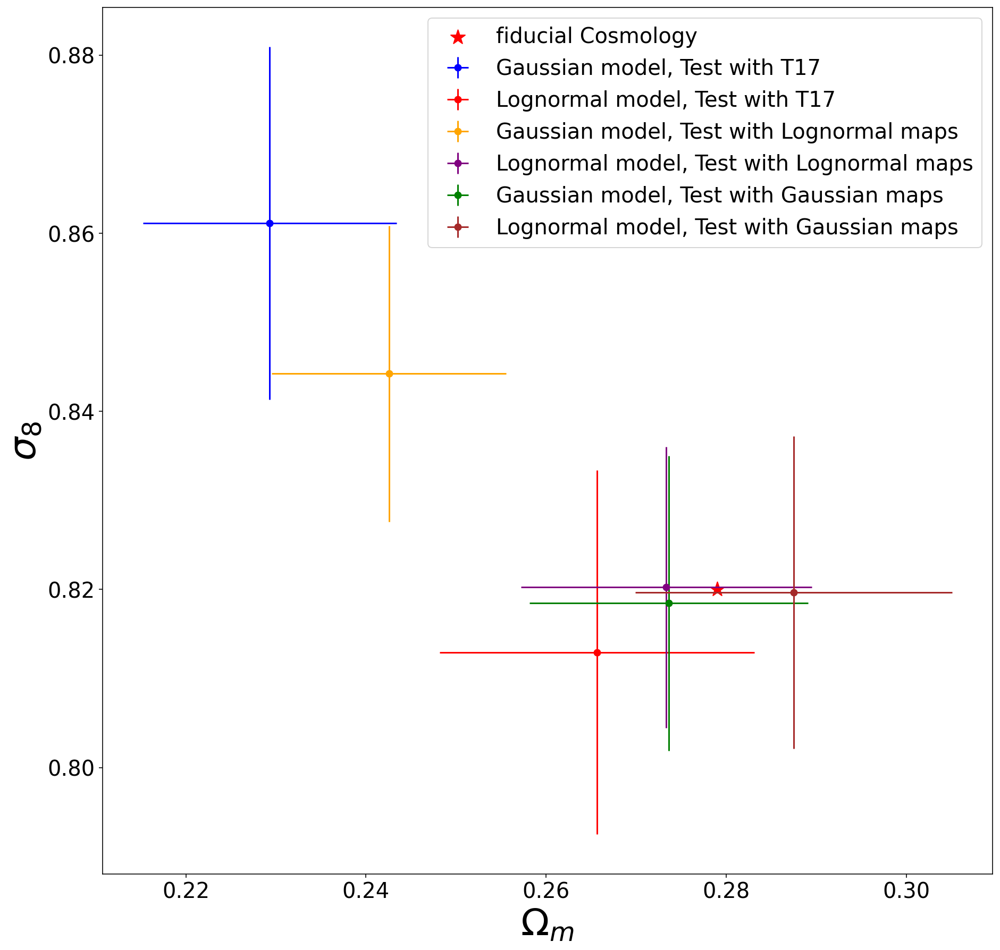

In [45]:
plt.figure(figsize=(15,15))
plt.errorbar(prediction_T17_Gauss_1_Omega_M_mean, prediction_T17_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_Gauss_1_Omega_M), yerr=np.sqrt(var_T17_Gauss_1_sigma_8),color='blue',label='Gaussian model, Test with T17')
plt.errorbar(prediction_T17_lognormal_1_Omega_M_mean, prediction_T17_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_lognormal_1_Omega_M), yerr=np.sqrt(var_T17_lognormal_1_sigma_8),color='red',label='Lognormal model, Test with T17')
plt.errorbar(prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_1_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_Gauss_1_Omega_M), yerr=np.sqrt(var_lognormal_1_Gauss_1_sigma_8),color='orange',label='Gaussian model, Test with Lognormal maps')
plt.errorbar(prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_1_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_lognormal_1_Omega_M), yerr=np.sqrt(var_lognormal_1_lognormal_1_sigma_8),color='purple',label='Lognormal model, Test with Lognormal maps')
plt.errorbar(prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_1_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_Gauss_1_Omega_M), yerr=np.sqrt(var_Gauss_1_Gauss_1_sigma_8),color='green',label='Gaussian model, Test with Gaussian maps')
plt.errorbar(prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_1_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_lognormal_1_Omega_M), yerr=np.sqrt(var_Gauss_1_lognormal_1_sigma_8),color='brown',label='Lognormal model, Test with Gaussian maps')
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=20) 
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=35)
plt.xlabel(f"$\Omega_m$", fontsize=35)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_mean_2D_11.jpg',bbox_inches='tight')
plt.show();

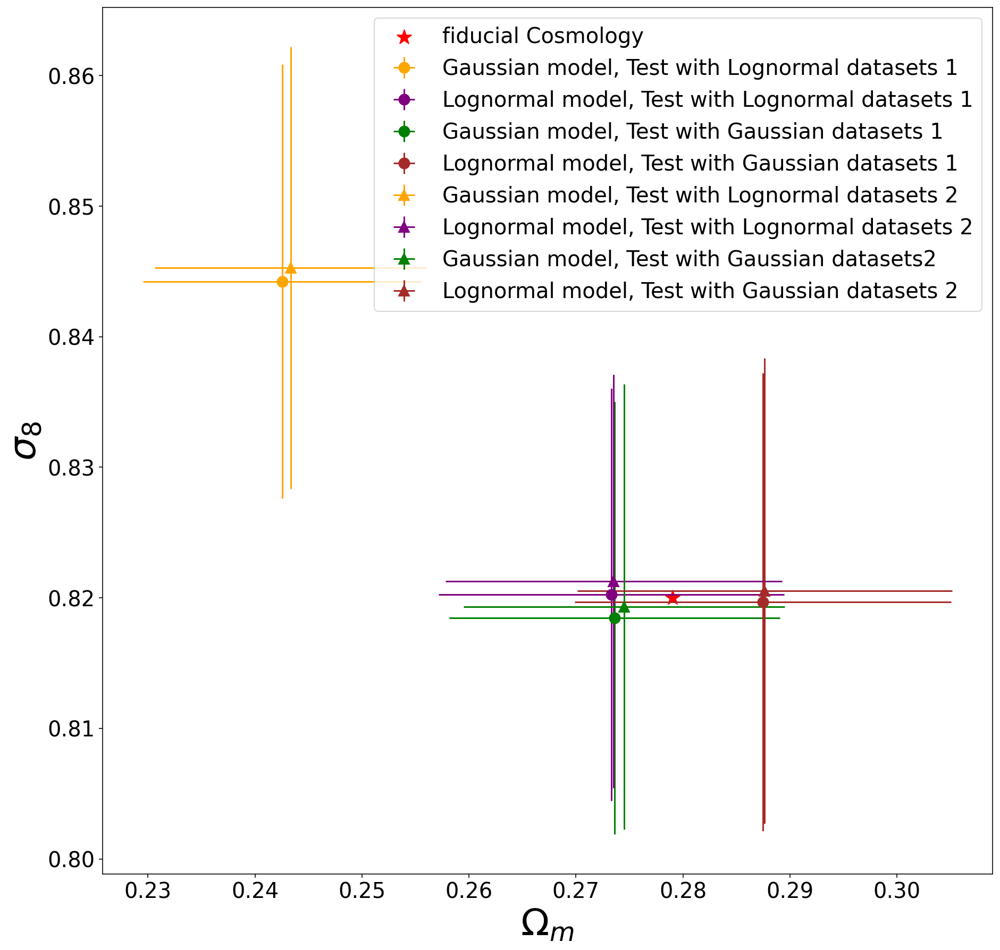

In [46]:
plt.figure(figsize=(15,15))
plt.errorbar(prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_1_Gauss_1_sigma_8_mean, fmt='o',markersize=10, xerr=np.sqrt(var_lognormal_1_Gauss_1_Omega_M), yerr=np.sqrt(var_lognormal_1_Gauss_1_sigma_8),color='orange',label='Gaussian model, Test with Lognormal datasets 1')
plt.errorbar(prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_1_lognormal_1_sigma_8_mean, fmt='o',markersize=10, xerr=np.sqrt(var_lognormal_1_lognormal_1_Omega_M), yerr=np.sqrt(var_lognormal_1_lognormal_1_sigma_8),color='purple',label='Lognormal model, Test with Lognormal datasets 1')
plt.errorbar(prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_1_Gauss_1_sigma_8_mean, fmt='o',markersize=10, xerr=np.sqrt(var_Gauss_1_Gauss_1_Omega_M), yerr=np.sqrt(var_Gauss_1_Gauss_1_sigma_8),color='green',label='Gaussian model, Test with Gaussian datasets 1')
plt.errorbar(prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_1_lognormal_1_sigma_8_mean, fmt='o',markersize=10, xerr=np.sqrt(var_Gauss_1_lognormal_1_Omega_M), yerr=np.sqrt(var_Gauss_1_lognormal_1_sigma_8),color='brown',label='Lognormal model, Test with Gaussian datasets 1')
plt.errorbar(prediction_lognormal_2_Gauss_1_Omega_M_mean, prediction_lognormal_2_Gauss_1_sigma_8_mean, fmt='^',markersize=10, xerr=np.sqrt(var_lognormal_2_Gauss_1_Omega_M), yerr=np.sqrt(var_lognormal_2_Gauss_1_sigma_8),color='orange',label='Gaussian model, Test with Lognormal datasets 2')
plt.errorbar(prediction_lognormal_2_lognormal_1_Omega_M_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean, fmt='^',markersize=10, xerr=np.sqrt(var_lognormal_2_lognormal_1_Omega_M), yerr=np.sqrt(var_lognormal_2_lognormal_1_sigma_8),color='purple',label='Lognormal model, Test with Lognormal datasets 2')
plt.errorbar(prediction_Gauss_2_Gauss_1_Omega_M_mean, prediction_Gauss_2_Gauss_1_sigma_8_mean, fmt='^',markersize=10, xerr=np.sqrt(var_Gauss_2_Gauss_1_Omega_M), yerr=np.sqrt(var_Gauss_2_Gauss_1_sigma_8),color='green',label='Gaussian model, Test with Gaussian datasets2 ')
plt.errorbar(prediction_Gauss_2_lognormal_1_Omega_M_mean, prediction_Gauss_2_lognormal_1_sigma_8_mean, fmt='^',markersize=10, xerr=np.sqrt(var_Gauss_2_lognormal_1_Omega_M), yerr=np.sqrt(var_Gauss_2_lognormal_1_sigma_8),color='brown',label='Lognormal model, Test with Gaussian datasets 2')
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=20) 
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=35)
plt.xlabel(f"$\Omega_m$", fontsize=35)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_mean_2D_tc.jpg',bbox_inches='tight')
plt.show();

#### Ok changing the test data sets don't change so much
#### Problem of inconsistency is coming from training proccess
#### The problem is hytuning, I think with this computational limitation, it is difficult
#### -> therefore same test in flat sky and different NSIDE

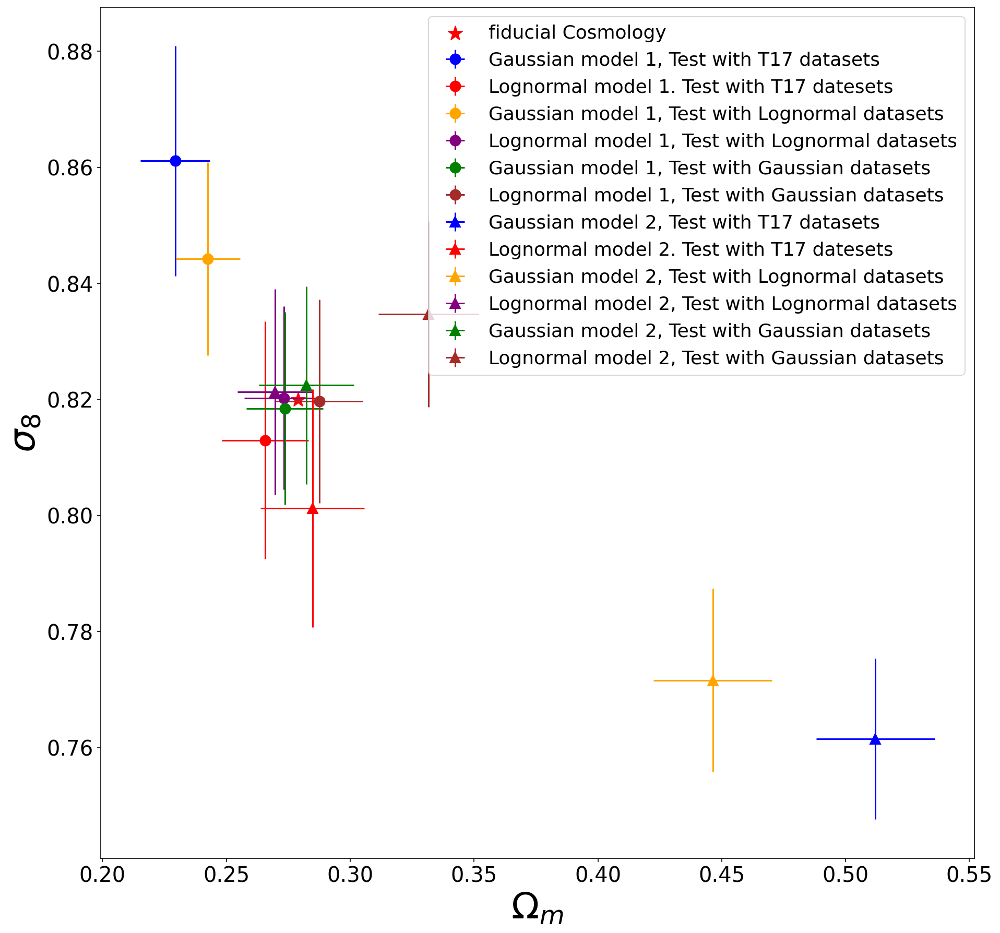

In [47]:
plt.figure(figsize=(15,15))
plt.errorbar(prediction_T17_Gauss_1_Omega_M_mean, prediction_T17_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_Gauss_1_Omega_M), yerr=np.sqrt(var_T17_Gauss_1_sigma_8),color='blue',markersize=10,label='Gaussian model 1, Test with T17 datasets')
plt.errorbar(prediction_T17_lognormal_1_Omega_M_mean, prediction_T17_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_lognormal_1_Omega_M), yerr=np.sqrt(var_T17_lognormal_1_sigma_8),color='red',markersize=10,label='Lognormal model 1. Test with T17 datesets')
plt.errorbar(prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_1_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_Gauss_1_Omega_M), yerr=np.sqrt(var_lognormal_1_Gauss_1_sigma_8),color='orange',markersize=10,label='Gaussian model 1, Test with Lognormal datasets')
plt.errorbar(prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_1_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_lognormal_1_Omega_M), yerr=np.sqrt(var_lognormal_1_lognormal_1_sigma_8),color='purple',markersize=10,label='Lognormal model 1, Test with Lognormal datasets')
plt.errorbar(prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_1_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_Gauss_1_Omega_M), yerr=np.sqrt(var_Gauss_1_Gauss_1_sigma_8),color='green',markersize=10,label='Gaussian model 1, Test with Gaussian datasets')
plt.errorbar(prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_1_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_lognormal_1_Omega_M), yerr=np.sqrt(var_Gauss_1_lognormal_1_sigma_8),color='brown',markersize=10,label='Lognormal model 1, Test with Gaussian datasets')
plt.errorbar(prediction_T17_Gauss_2_Omega_M_mean, prediction_T17_Gauss_2_sigma_8_mean, fmt='^', xerr=np.sqrt(var_T17_Gauss_2_Omega_M), yerr=np.sqrt(var_T17_Gauss_2_sigma_8),color='blue',markersize=10,label='Gaussian model 2, Test with T17 datasets')
plt.errorbar(prediction_T17_lognormal_2_Omega_M_mean, prediction_T17_lognormal_2_sigma_8_mean, fmt='^', xerr=np.sqrt(var_T17_lognormal_2_Omega_M), yerr=np.sqrt(var_T17_lognormal_2_sigma_8),color='red',markersize=10,label='Lognormal model 2. Test with T17 datesets')
plt.errorbar(prediction_lognormal_1_Gauss_2_Omega_M_mean, prediction_lognormal_1_Gauss_2_sigma_8_mean, fmt='^', xerr=np.sqrt(var_lognormal_1_Gauss_2_Omega_M), yerr=np.sqrt(var_lognormal_1_Gauss_2_sigma_8),color='orange',markersize=10,label='Gaussian model 2, Test with Lognormal datasets')
plt.errorbar(prediction_lognormal_1_lognormal_2_Omega_M_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean, fmt='^', xerr=np.sqrt(var_lognormal_1_lognormal_2_Omega_M), yerr=np.sqrt(var_lognormal_1_lognormal_2_sigma_8),color='purple',markersize=10,label='Lognormal model 2, Test with Lognormal datasets')
plt.errorbar(prediction_Gauss_1_Gauss_2_Omega_M_mean, prediction_Gauss_1_Gauss_2_sigma_8_mean, fmt='^', xerr=np.sqrt(var_Gauss_1_Gauss_2_Omega_M), yerr=np.sqrt(var_Gauss_1_Gauss_2_sigma_8),color='green',markersize=10,label='Gaussian model 2, Test with Gaussian datasets')
plt.errorbar(prediction_Gauss_1_lognormal_2_Omega_M_mean, prediction_Gauss_1_lognormal_2_sigma_8_mean, fmt='^', xerr=np.sqrt(var_Gauss_1_lognormal_2_Omega_M), yerr=np.sqrt(var_Gauss_1_lognormal_2_sigma_8),color='brown',markersize=10,label='Lognormal model 2, Test with Gaussian datasets')
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=18) 
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel(f"$\sigma_8$", fontsize=35)
plt.xlabel(f"$\Omega_m$", fontsize=35)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_mean_2D_trc.jpg',bbox_inches='tight')
plt.show();

In [48]:
def dis(predic1_x, predic1_y, predic2_x, predic2_y):
    dis = np.sqrt((predic1_x-predic2_x)**2+(predic1_y-predic2_y)**2)
    return dis

In [49]:
dis_lognormal_lognormal = dis(prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_1_lognormal_1_sigma_8_mean,prediction_lognormal_2_lognormal_1_Omega_M_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean)
dis_lognormal_Gauss     = dis(prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_1_Gauss_1_sigma_8_mean,prediction_lognormal_2_Gauss_1_Omega_M_mean, prediction_lognormal_2_Gauss_1_sigma_8_mean)
dis_Gauss_lognormal     = dis(prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_1_lognormal_1_sigma_8_mean,prediction_Gauss_2_lognormal_1_Omega_M_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean)
dis_Gauss_Gauss         = dis(prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_1_Gauss_1_sigma_8_mean,prediction_Gauss_2_Gauss_1_Omega_M_mean, prediction_Gauss_2_Gauss_1_sigma_8_mean)

In [50]:
def frac_diff(x,y):
    frac=np.abs(1.-x/y)
    return frac

In [51]:
fr_dis_ll_Om = frac_diff(prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_2_lognormal_1_Omega_M_mean)
fr_dis_lg_Om = frac_diff(prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_2_Gauss_1_Omega_M_mean)
fr_dis_gl_Om = frac_diff(prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_2_lognormal_1_Omega_M_mean)
fr_dis_gg_Om = frac_diff(prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_2_Gauss_1_Omega_M_mean)

fr_dis_ll_sg = frac_diff(prediction_lognormal_1_lognormal_1_sigma_8_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean)
fr_dis_lg_sg = frac_diff(prediction_lognormal_1_Gauss_1_sigma_8_mean, prediction_lognormal_2_Gauss_1_sigma_8_mean)
fr_dis_gl_sg = frac_diff(prediction_Gauss_1_lognormal_1_sigma_8_mean, prediction_Gauss_2_lognormal_1_sigma_8_mean)
fr_dis_gg_sg = frac_diff(prediction_Gauss_1_Gauss_1_sigma_8_mean, prediction_Gauss_2_Gauss_1_sigma_8_mean)

<Figure size 864x576 with 0 Axes>

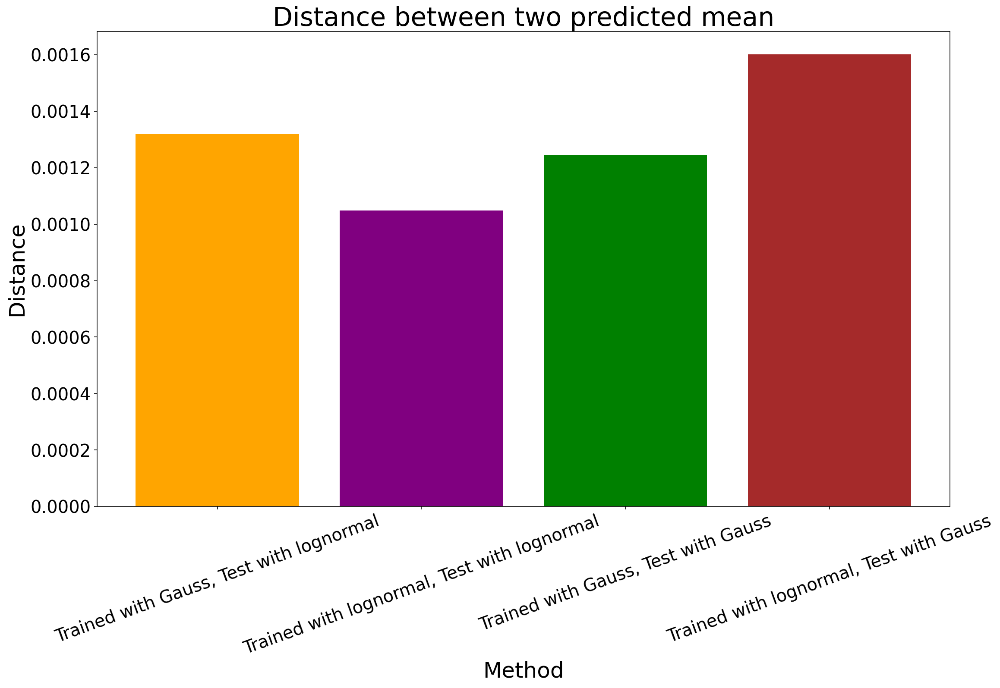

In [52]:
all_samples_dis = [dis_lognormal_Gauss, dis_lognormal_lognormal, dis_Gauss_Gauss, dis_Gauss_lognormal]
labels = ['Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
dis= []
for sample in all_samples_dis:
    dis.append(sample)

plt.figure(figsize=(12, 8))
colors = ['orange', 'purple', 'green', 'brown']
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, dis, color=colors)
plt.xlabel('Method', fontsize=25)
plt.ylabel('Distance', fontsize=25)
plt.title('Distance between two predicted mean',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/dis.jpg',bbox_inches='tight')
# Display the plot
plt.show();

#### T17 test is removed

<Figure size 864x576 with 0 Axes>

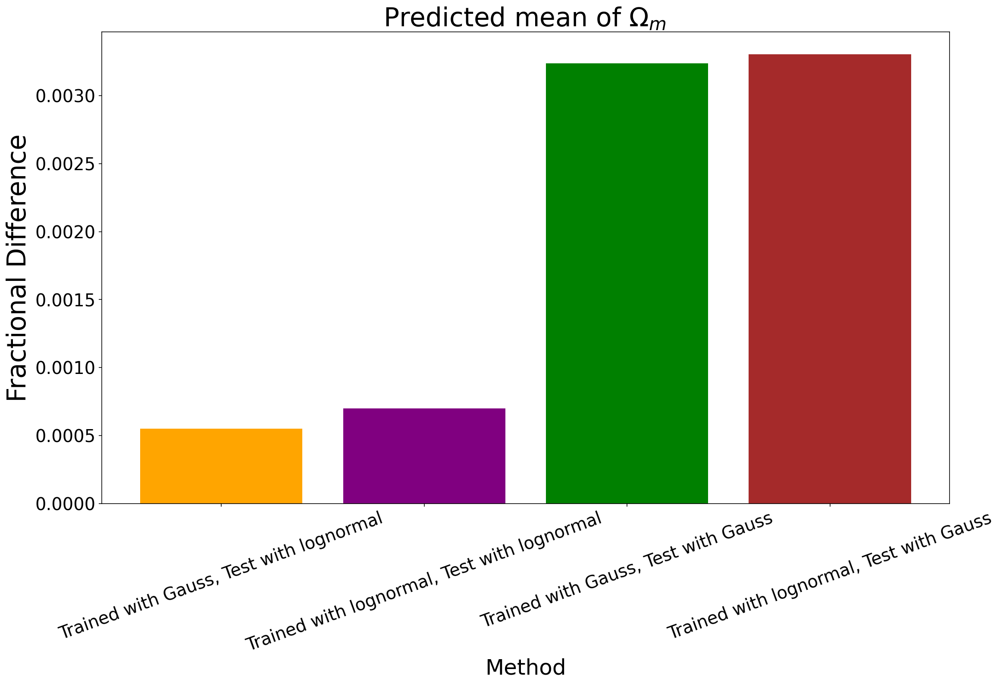

In [53]:
all_samples_frac = [fr_dis_gl_Om, fr_dis_ll_Om, fr_dis_gg_Om, fr_dis_lg_Om]
labels = ['Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
frac= []
for sample in all_samples_frac:
    frac.append(sample)

plt.figure(figsize=(12, 8))
colors = ['orange', 'purple', 'green', 'brown']
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, frac, color=colors)
plt.xlabel('Method', fontsize=25)
plt.ylabel('Fractional Difference', fontsize=30)
plt.title(f'Predicted mean of $\Omega_m$ ',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/frac_Om.jpg',bbox_inches='tight')
# Display the plot
plt.show();

<Figure size 864x576 with 0 Axes>

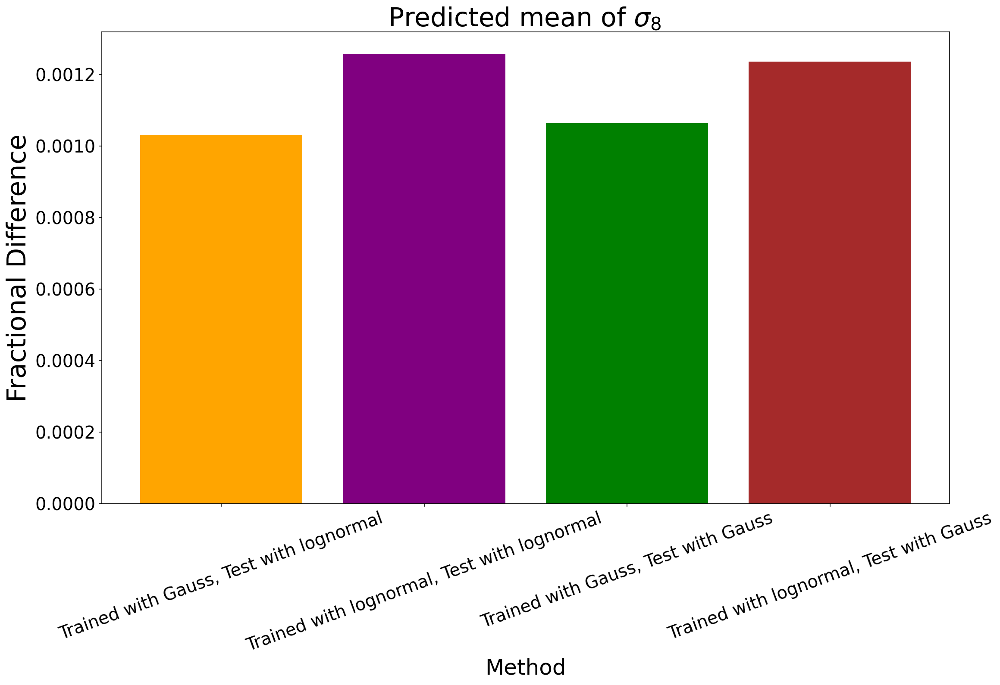

In [54]:
all_samples_frac = [fr_dis_gl_sg, fr_dis_ll_sg, fr_dis_gg_sg, fr_dis_lg_sg]
labels = ['Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
frac= []
for sample in all_samples_frac:
    frac.append(sample)

plt.figure(figsize=(12, 8))
colors = ['orange', 'purple', 'green', 'brown']
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, frac, color=colors)
plt.xlabel('Method', fontsize=25)
plt.ylabel('Fractional Difference', fontsize=30)
plt.title(f'Predicted mean of $\sigma_8$ ',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/frac_sg.jpg',bbox_inches='tight')
# Display the plot
plt.show();

In [55]:
fr_var_ll_Om = frac_diff(var_lognormal_1_lognormal_1_Omega_M, var_lognormal_2_lognormal_1_Omega_M)
fr_var_lg_Om = frac_diff(var_lognormal_1_Gauss_1_Omega_M, var_lognormal_2_Gauss_1_Omega_M)
fr_var_gl_Om = frac_diff(var_Gauss_1_lognormal_1_Omega_M, var_Gauss_2_lognormal_1_Omega_M)
fr_var_gg_Om = frac_diff(var_Gauss_1_Gauss_1_Omega_M, var_Gauss_2_Gauss_1_Omega_M)

fr_var_ll_sg = frac_diff(var_lognormal_1_lognormal_1_sigma_8, var_lognormal_2_lognormal_1_sigma_8)
fr_var_lg_sg = frac_diff(var_lognormal_1_Gauss_1_sigma_8, var_lognormal_2_Gauss_1_sigma_8)
fr_var_gl_sg = frac_diff(var_Gauss_1_lognormal_1_sigma_8, var_Gauss_2_lognormal_1_sigma_8)
fr_var_gg_sg = frac_diff(var_Gauss_1_Gauss_1_sigma_8, var_Gauss_2_Gauss_1_sigma_8)

<Figure size 864x576 with 0 Axes>

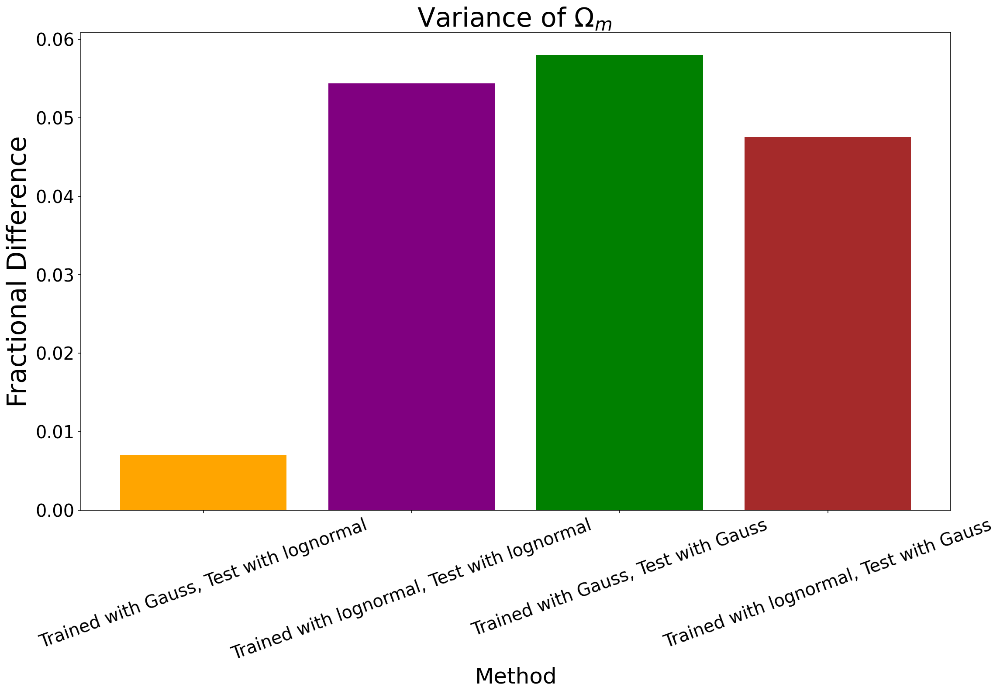

In [56]:
all_samples_frac = [fr_var_gl_Om, fr_var_ll_Om, fr_var_gg_Om, fr_var_lg_Om]
labels = ['Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
frac= []
for sample in all_samples_frac:
    frac.append(sample)

plt.figure(figsize=(12, 8))
colors = ['orange', 'purple', 'green', 'brown']
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, frac, color=colors)
plt.xlabel('Method', fontsize=25)
plt.ylabel('Fractional Difference', fontsize=30)
plt.title(f'Variance of $\Omega_m$ ',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/frac_var_Om.jpg',bbox_inches='tight')
# Display the plot
plt.show();

<Figure size 864x576 with 0 Axes>

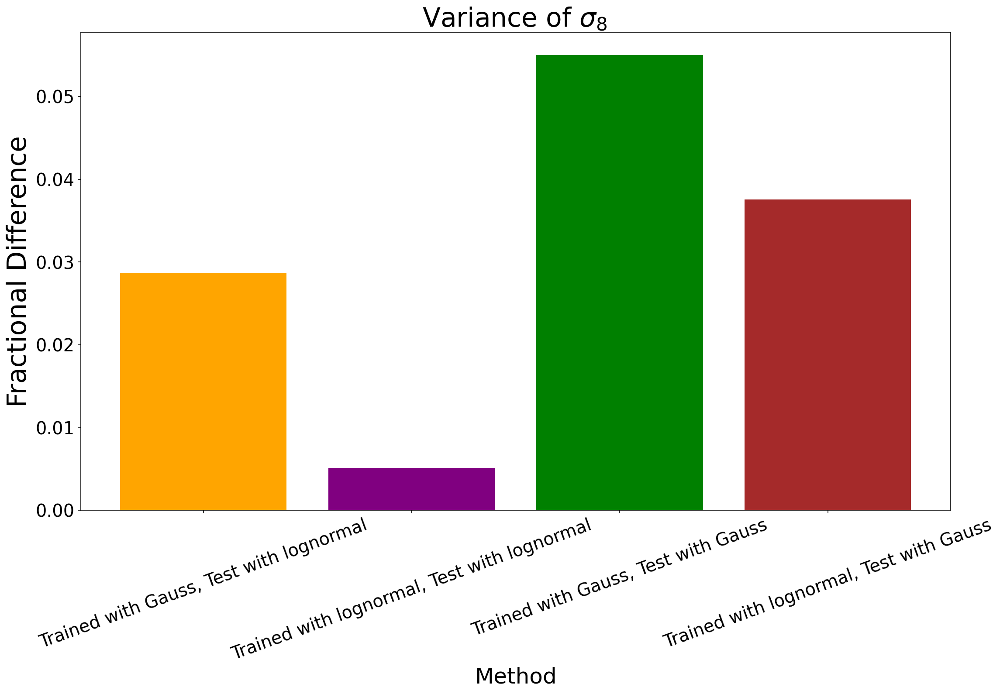

In [57]:
all_samples_frac = [fr_var_gl_sg, fr_var_ll_sg, fr_var_gg_sg, fr_var_lg_sg]
labels = ['Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
frac= []
for sample in all_samples_frac:
    frac.append(sample)

plt.figure(figsize=(12, 8))
colors = ['orange', 'purple', 'green', 'brown']
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, frac, color=colors)
plt.xlabel('Method', fontsize=25)
plt.ylabel('Fractional Difference', fontsize=30)
plt.title(f'Variance of $\sigma_8$ ',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/frac_var_sg.jpg',bbox_inches='tight')
# Display the plot
plt.show();

In [58]:
print(np.sqrt((var_lognormal_1_lognormal_1_Omega_M)**2+(var_lognormal_1_lognormal_1_sigma_8)**2))
print(np.sqrt((var_Gauss_1_lognormal_1_Omega_M)**2+(var_Gauss_1_lognormal_1_sigma_8)**2))
print(var_Gauss_1_lognormal_1_Omega_M)
print(var_Gauss_1_lognormal_1_sigma_8)

0.0003604275820179308
0.00043630331799534655
0.0003087501163068025
0.0003082757709815749


In [59]:
datasets = [
    {
        'x': prediction_T17_Gauss_1_Omega_M_mean,
        'y': prediction_T17_Gauss_1_sigma_8_mean,
        'var_x': var_T17_Gauss_1_Omega_M,
        'var_y': var_T17_Gauss_1_sigma_8,
        'label': 'Gaussian model 1, Test with T17'
    },
    {
        'x': prediction_T17_Gauss_2_Omega_M_mean,
        'y': prediction_T17_Gauss_2_sigma_8_mean,
        'var_x': var_T17_Gauss_2_Omega_M,
        'var_y': var_T17_Gauss_2_sigma_8,
        'label': 'Gaussian model 2, Test with T17'
    },
   {
        'x': prediction_T17_lognormal_1_Omega_M_mean,
        'y': prediction_T17_lognormal_1_sigma_8_mean,
        'var_x': var_T17_lognormal_1_Omega_M,
        'var_y': var_T17_lognormal_1_sigma_8,
        'label': 'Lognormal model 1, Test with T17'
    },
    {
        'x': prediction_T17_lognormal_2_Omega_M_mean,
        'y': prediction_T17_lognormal_2_sigma_8_mean,
        'var_x': var_T17_lognormal_2_Omega_M,
        'var_y': var_T17_lognormal_2_sigma_8,
        'label': 'Lognormal model 2, Test with T17'
    },
    {
        'x': prediction_lognormal_1_Gauss_1_Omega_M_mean,
        'y': prediction_lognormal_1_Gauss_1_sigma_8_mean,
        'var_x': var_lognormal_1_Gauss_1_Omega_M,
        'var_y': var_lognormal_1_Gauss_1_sigma_8,
        'label': 'Gaussian model 1, Test with lognormal maps 1'
    },
    {
        'x': prediction_lognormal_2_Gauss_1_Omega_M_mean,
        'y': prediction_lognormal_2_Gauss_1_sigma_8_mean,
        'var_x': var_lognormal_2_Gauss_1_Omega_M,
        'var_y': var_lognormal_2_Gauss_1_sigma_8,
        'label': 'Gaussian model 1, Test with lognormal maps 2'
    },
    {
        'x': prediction_lognormal_1_Gauss_2_Omega_M_mean,
        'y': prediction_lognormal_1_Gauss_2_sigma_8_mean,
        'var_x': var_lognormal_1_Gauss_2_Omega_M,
        'var_y': var_lognormal_1_Gauss_2_sigma_8,
        'label': 'Gaussian model 2, Test with lognormal maps 1'
    },
    {
        'x': prediction_lognormal_2_Gauss_2_Omega_M_mean,
        'y': prediction_lognormal_2_Gauss_2_sigma_8_mean,
        'var_x': var_lognormal_2_Gauss_2_Omega_M,
        'var_y': var_lognormal_2_Gauss_2_sigma_8,
        'label': 'Gaussian model 2, Test with lognormal maps 2'
    },
    {
        'x': prediction_lognormal_1_lognormal_1_Omega_M_mean,
        'y': prediction_lognormal_1_lognormal_1_sigma_8_mean,
        'var_x': var_lognormal_1_lognormal_1_Omega_M,
        'var_y': var_lognormal_1_lognormal_1_sigma_8,
        'label': 'Lognormal model 1, Test with lognormal maps 1'
    },
    {
        'x': prediction_lognormal_2_lognormal_1_Omega_M_mean,
        'y': prediction_lognormal_2_lognormal_1_sigma_8_mean,
        'var_x': var_lognormal_2_lognormal_1_Omega_M,
        'var_y': var_lognormal_2_lognormal_1_sigma_8,
        'label': 'Lognormal model 1, Test with lognormal maps 2'
    },
    {
        'x': prediction_lognormal_1_lognormal_2_Omega_M_mean,
        'y': prediction_lognormal_1_lognormal_2_sigma_8_mean,
        'var_x': var_lognormal_1_lognormal_2_Omega_M,
        'var_y': var_lognormal_1_lognormal_2_sigma_8,
        'label': 'Lognormal model 2, Test with lognormal maps 1'
    },
    {
        'x': prediction_lognormal_2_lognormal_2_Omega_M_mean,
        'y': prediction_lognormal_2_lognormal_2_sigma_8_mean,
        'var_x': var_lognormal_2_lognormal_2_Omega_M,
        'var_y': var_lognormal_2_lognormal_2_sigma_8,
        'label': 'Lognormal model 2, Test with lognormal maps 2'
    },
    {
        'x': prediction_Gauss_1_Gauss_1_Omega_M_mean,
        'y': prediction_Gauss_1_Gauss_1_sigma_8_mean,
        'var_x': var_Gauss_1_Gauss_1_Omega_M,
        'var_y': var_Gauss_1_Gauss_1_sigma_8,
        'label': 'Gaussian model 1, Test with Gaussian maps 1'
    },
    {
        'x': prediction_Gauss_2_Gauss_1_Omega_M_mean,
        'y': prediction_Gauss_2_Gauss_1_sigma_8_mean,
        'var_x': var_Gauss_2_Gauss_1_Omega_M,
        'var_y': var_Gauss_2_Gauss_1_sigma_8,
        'label': 'Gaussian model 1, Test with Gaussian maps 2'
    },
    {
        'x': prediction_Gauss_1_Gauss_2_Omega_M_mean,
        'y': prediction_Gauss_1_Gauss_2_sigma_8_mean,
        'var_x': var_Gauss_1_Gauss_2_Omega_M,
        'var_y': var_Gauss_1_Gauss_2_sigma_8,
        'label': 'Gaussian model 2, Test with Gaussian maps 1'
    },
    {
        'x': prediction_Gauss_2_Gauss_2_Omega_M_mean,
        'y': prediction_Gauss_2_Gauss_2_sigma_8_mean,
        'var_x': var_Gauss_2_Gauss_2_Omega_M,
        'var_y': var_Gauss_2_Gauss_2_sigma_8,
        'label': 'Gaussian model 2, Test with Gaussian maps 2'
    },
    {
        'x': prediction_Gauss_1_lognormal_1_Omega_M_mean,
        'y': prediction_Gauss_1_lognormal_1_sigma_8_mean,
        'var_x': var_Gauss_1_lognormal_1_Omega_M,
        'var_y': var_Gauss_1_lognormal_1_sigma_8,
        'label': 'Lognormal model 1, Test with Gaussian maps 1'
    },
    {
        'x': prediction_Gauss_2_lognormal_1_Omega_M_mean,
        'y': prediction_Gauss_2_lognormal_1_sigma_8_mean,
        'var_x': var_Gauss_2_lognormal_1_Omega_M,
        'var_y': var_Gauss_2_lognormal_1_sigma_8,
        'label': 'Lognormal model 1, Test with Gaussian maps 2'
    },
    {
        'x': prediction_Gauss_1_lognormal_2_Omega_M_mean,
        'y': prediction_Gauss_1_lognormal_2_sigma_8_mean,
        'var_x': var_Gauss_1_lognormal_2_Omega_M,
        'var_y': var_Gauss_1_lognormal_2_sigma_8,
        'label': 'Lognormal model 2, Test with Gaussian maps 1'
    },
    {
        'x': prediction_Gauss_2_lognormal_2_Omega_M_mean,
        'y': prediction_Gauss_2_lognormal_2_sigma_8_mean,
        'var_x': var_Gauss_2_lognormal_2_Omega_M,
        'var_y': var_Gauss_2_lognormal_2_sigma_8,
        'label': 'Lognormal model 2, Test with Gaussian maps 2'
    }
]

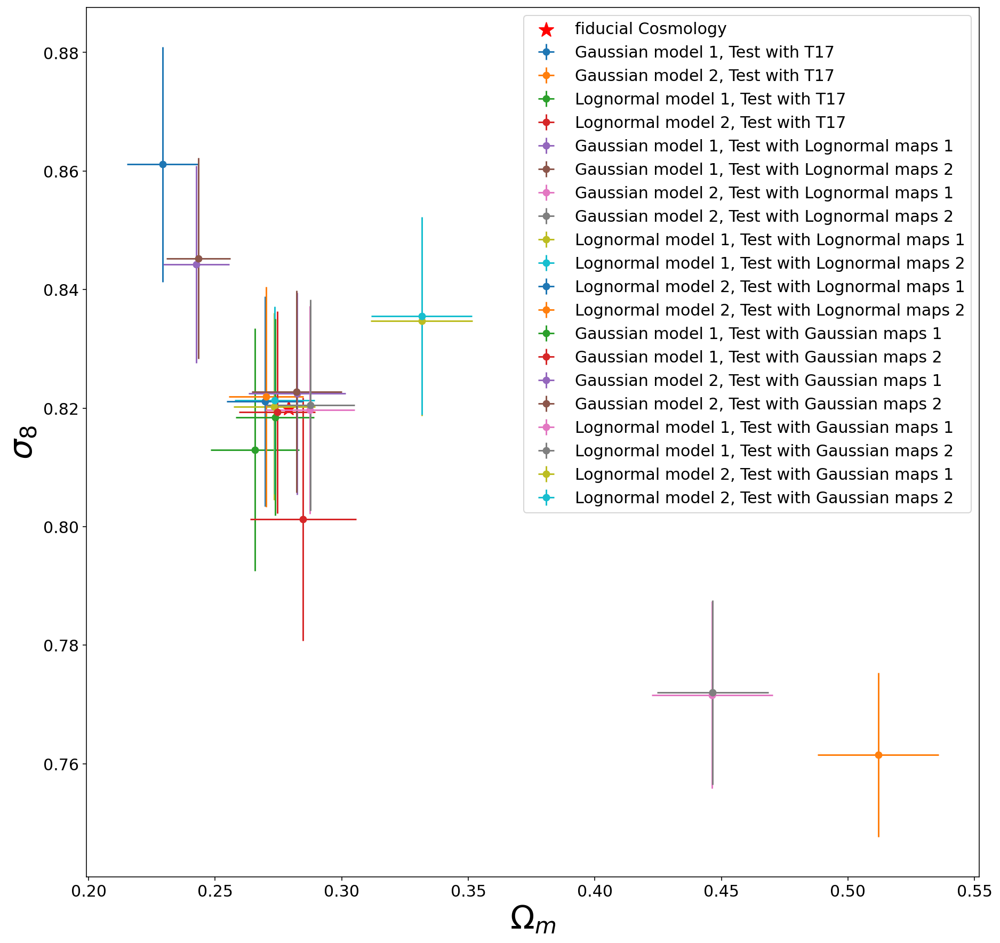

In [60]:
plt.figure(figsize=(15,15))
plt.errorbar(prediction_T17_Gauss_1_Omega_M_mean, prediction_T17_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_Gauss_1_Omega_M), yerr=np.sqrt(var_T17_Gauss_1_sigma_8),label='Gaussian model 1, Test with T17')
plt.errorbar(prediction_T17_Gauss_2_Omega_M_mean, prediction_T17_Gauss_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_Gauss_2_Omega_M), yerr=np.sqrt(var_T17_Gauss_2_sigma_8),label='Gaussian model 2, Test with T17')
plt.errorbar(prediction_T17_lognormal_1_Omega_M_mean, prediction_T17_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_lognormal_1_Omega_M), yerr=np.sqrt(var_T17_lognormal_1_sigma_8),label='Lognormal model 1, Test with T17')
plt.errorbar(prediction_T17_lognormal_2_Omega_M_mean, prediction_T17_lognormal_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_T17_lognormal_2_Omega_M), yerr=np.sqrt(var_T17_lognormal_2_sigma_8),label='Lognormal model 2, Test with T17')
plt.errorbar(prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_1_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_Gauss_1_Omega_M), yerr=np.sqrt(var_lognormal_1_Gauss_1_sigma_8),label='Gaussian model 1, Test with Lognormal maps 1')
plt.errorbar(prediction_lognormal_2_Gauss_1_Omega_M_mean, prediction_lognormal_2_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_2_Gauss_1_Omega_M), yerr=np.sqrt(var_lognormal_2_Gauss_1_sigma_8),label='Gaussian model 1, Test with Lognormal maps 2')
plt.errorbar(prediction_lognormal_1_Gauss_2_Omega_M_mean, prediction_lognormal_1_Gauss_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_Gauss_2_Omega_M), yerr=np.sqrt(var_lognormal_1_Gauss_2_sigma_8),label='Gaussian model 2, Test with Lognormal maps 1')
plt.errorbar(prediction_lognormal_2_Gauss_2_Omega_M_mean, prediction_lognormal_2_Gauss_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_2_Gauss_2_Omega_M), yerr=np.sqrt(var_lognormal_2_Gauss_2_sigma_8),label='Gaussian model 2, Test with Lognormal maps 2')
plt.errorbar(prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_1_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_lognormal_1_Omega_M), yerr=np.sqrt(var_lognormal_1_lognormal_1_sigma_8),label='Lognormal model 1, Test with Lognormal maps 1')
plt.errorbar(prediction_lognormal_2_lognormal_1_Omega_M_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_2_lognormal_1_Omega_M), yerr=np.sqrt(var_lognormal_2_lognormal_1_sigma_8),label='Lognormal model 1, Test with Lognormal maps 2')
plt.errorbar(prediction_lognormal_1_lognormal_2_Omega_M_mean, prediction_lognormal_1_lognormal_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_1_lognormal_2_Omega_M), yerr=np.sqrt(var_lognormal_1_lognormal_2_sigma_8),label='Lognormal model 2, Test with Lognormal maps 1')
plt.errorbar(prediction_lognormal_2_lognormal_2_Omega_M_mean, prediction_lognormal_2_lognormal_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_lognormal_2_lognormal_2_Omega_M), yerr=np.sqrt(var_lognormal_2_lognormal_2_sigma_8),label='Lognormal model 2, Test with Lognormal maps 2')
plt.errorbar(prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_1_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_Gauss_1_Omega_M), yerr=np.sqrt(var_Gauss_1_Gauss_1_sigma_8),label='Gaussian model 1, Test with Gaussian maps 1')
plt.errorbar(prediction_Gauss_2_Gauss_1_Omega_M_mean, prediction_Gauss_2_Gauss_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_2_Gauss_1_Omega_M), yerr=np.sqrt(var_Gauss_2_Gauss_1_sigma_8),label='Gaussian model 1, Test with Gaussian maps 2')
plt.errorbar(prediction_Gauss_1_Gauss_2_Omega_M_mean, prediction_Gauss_1_Gauss_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_Gauss_2_Omega_M), yerr=np.sqrt(var_Gauss_1_Gauss_2_sigma_8),label='Gaussian model 2, Test with Gaussian maps 1')
plt.errorbar(prediction_Gauss_2_Gauss_2_Omega_M_mean, prediction_Gauss_2_Gauss_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_2_Gauss_2_Omega_M), yerr=np.sqrt(var_Gauss_2_Gauss_2_sigma_8),label='Gaussian model 2, Test with Gaussian maps 2')
plt.errorbar(prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_1_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_lognormal_1_Omega_M), yerr=np.sqrt(var_Gauss_1_lognormal_1_sigma_8),label='Lognormal model 1, Test with Gaussian maps 1')
plt.errorbar(prediction_Gauss_2_lognormal_1_Omega_M_mean, prediction_Gauss_2_lognormal_1_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_2_lognormal_1_Omega_M), yerr=np.sqrt(var_Gauss_2_lognormal_1_sigma_8),label='Lognormal model 1, Test with Gaussian maps 2')
plt.errorbar(prediction_Gauss_1_lognormal_2_Omega_M_mean, prediction_Gauss_1_lognormal_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_1_lognormal_2_Omega_M), yerr=np.sqrt(var_Gauss_1_lognormal_2_sigma_8),label='Lognormal model 2, Test with Gaussian maps 1')
plt.errorbar(prediction_Gauss_2_lognormal_2_Omega_M_mean, prediction_Gauss_2_lognormal_2_sigma_8_mean, fmt='o', xerr=np.sqrt(var_Gauss_2_lognormal_2_Omega_M), yerr=np.sqrt(var_Gauss_2_lognormal_2_sigma_8),label='Lognormal model 2, Test with Gaussian maps 2')
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='fiducial Cosmology', s=200, color="red")
plt.legend(fontsize=15) 
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel(f"$\sigma_8$", fontsize=30)
plt.xlabel(f"$\Omega_m$", fontsize=30)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_mean_2D.png',bbox_inches='tight')
plt.show();

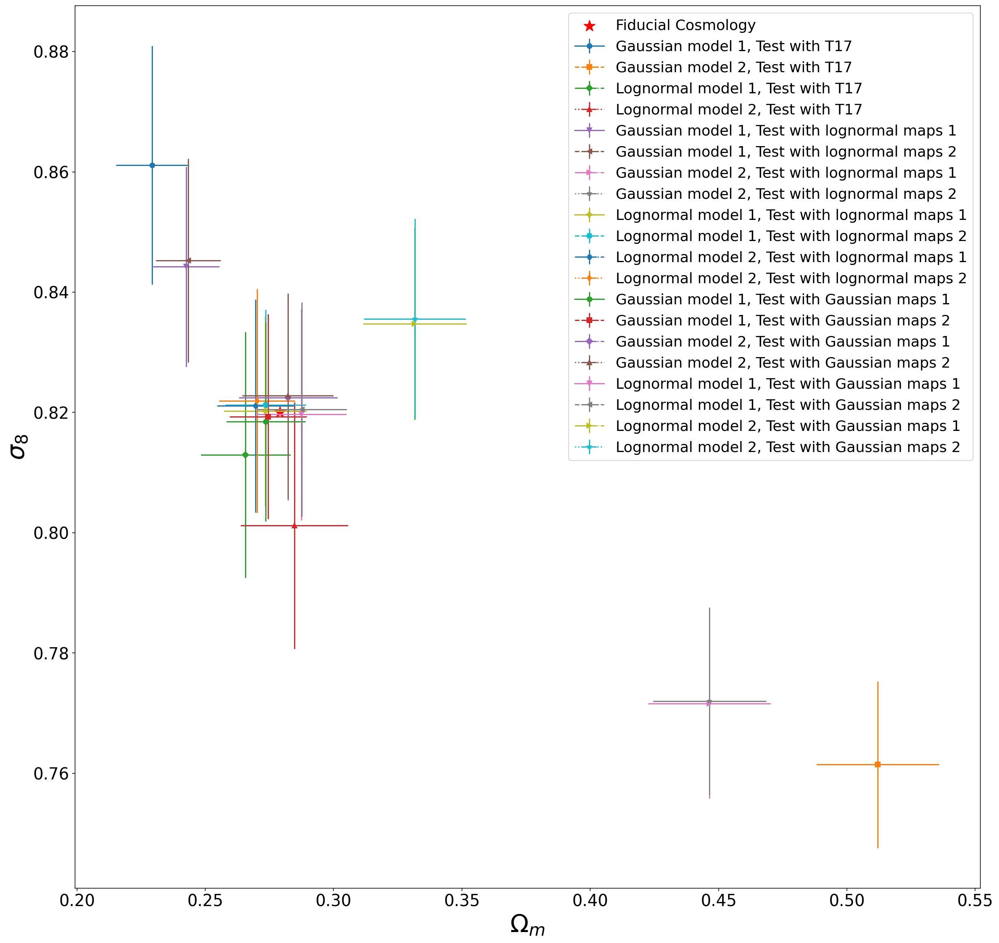

In [61]:
plt.figure(figsize=(20, 20))

# Define markers and line styles
markers = ['o', 's', 'D', '^', 'v', '<', '>', '*', 'P', 'X', 'H', 'd']
line_styles = ['-', '--', '-.', ':']

# Loop through your data and markers
for i, data in enumerate(datasets):
    marker = markers[i % len(markers)]  # Cycle through markers
    line_style = line_styles[i % len(line_styles)]  # Cycle through line styles

    plt.errorbar(
        data['x'],
        data['y'],
        fmt=marker + line_style,  # Use both marker and line style
        xerr=np.sqrt(data['var_x']),
        yerr=np.sqrt(data['var_y']),
        label=data['label'],
    )

# Add a red star for the fiducial Cosmology
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', label='Fiducial Cosmology', s=200, color="red")

# Customize the plot
plt.legend(fontsize=18)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylabel("$\sigma_8$", fontsize=30)
plt.xlabel("$\Omega_m$", fontsize=30)

# Save and display the plot
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Test_prediction_mean_2D.png', bbox_inches='tight')
plt.show()

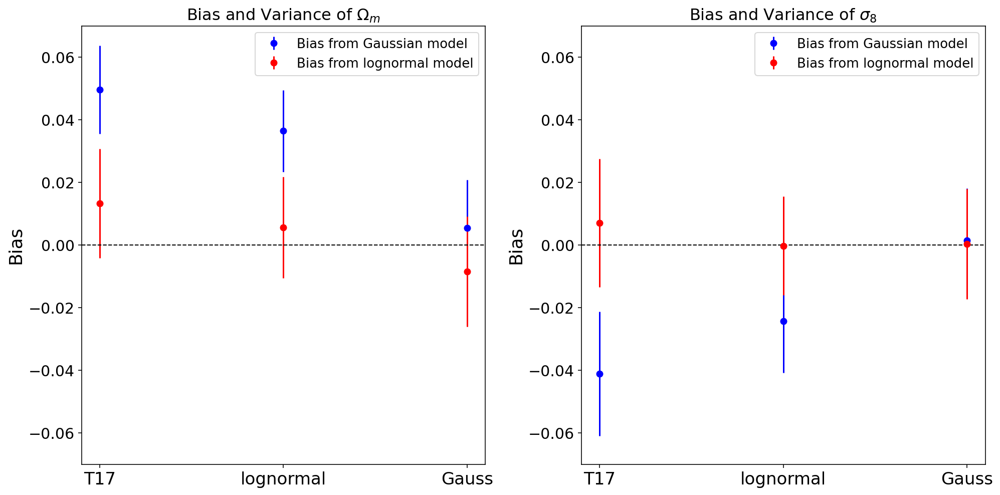

In [62]:
labels = ['T17', 'lognormal', 'Gauss']
bias_Omega_M_Gauss_1         = [bias_T17_Gauss_1_Omega_M, bias_lognormal_1_Gauss_1_Omega_M, bias_Gauss_1_Gauss_1_Omega_M]
variance_Omega_M_Gauss_1     = [var_T17_Gauss_1_Omega_M, var_lognormal_1_Gauss_1_Omega_M, var_Gauss_1_Gauss_1_Omega_M]
bias_Omega_M_lognormal_1     = [bias_T17_lognormal_1_Omega_M, bias_lognormal_1_lognormal_1_Omega_M, bias_Gauss_1_lognormal_1_Omega_M]
variance_Omega_M_lognormal_1 = [var_T17_lognormal_1_Omega_M, var_lognormal_1_lognormal_1_Omega_M, var_Gauss_1_lognormal_1_Omega_M]

bias_sigma_8_Gauss_1         = [bias_T17_Gauss_1_sigma_8, bias_lognormal_1_Gauss_1_sigma_8, bias_Gauss_1_Gauss_1_sigma_8]
variance_sigma_8_Gauss_1     = [var_T17_Gauss_1_sigma_8, var_lognormal_1_Gauss_1_sigma_8, var_Gauss_1_Gauss_1_sigma_8]
bias_sigma_8_lognormal_1     = [bias_T17_lognormal_1_sigma_8, bias_lognormal_1_lognormal_1_sigma_8, bias_Gauss_1_lognormal_1_sigma_8]
variance_sigma_8_lognormal_1 = [var_T17_lognormal_1_sigma_8, var_lognormal_1_lognormal_1_sigma_8, var_Gauss_1_lognormal_1_sigma_8]

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Plot bias for Omega_M
ax1.errorbar(labels, bias_Omega_M_Gauss_1, yerr=np.sqrt(variance_Omega_M_Gauss_1), fmt='o', color='b', label='Bias from Gaussian model')
ax1.errorbar(labels, bias_Omega_M_lognormal_1, yerr=np.sqrt(variance_Omega_M_lognormal_1), fmt='o', color='r', label='Bias from lognormal model')
ax1.set_title('Bias and Variance of $\Omega_m$', fontsize=16)
ax1.axhline(y=0, color='k', linestyle='--', linewidth=1) 
ax1.tick_params(axis='x', labelsize=17)
ax1.tick_params(axis='y', labelsize=15)
ax1.set_ylim(-0.07,0.07)
ax1.set_ylabel('Bias', fontsize=18)
ax1.legend(fontsize=13)

# Plot bias for sigma_8
ax2.errorbar(labels, bias_sigma_8_Gauss_1, yerr=np.sqrt(variance_sigma_8_Gauss_1), fmt='o', color='b', label='Bias from Gaussian model')
ax2.errorbar(labels, bias_sigma_8_lognormal_1, yerr=np.sqrt(variance_sigma_8_lognormal_1), fmt='o', color='r', label='Bias from lognormal model')
ax2.set_title('Bias and Variance of $\sigma_8$', fontsize=16)
ax2.axhline(y=0, color='k', linestyle='--', linewidth=1)
ax2.tick_params(axis='x', labelsize=17)
ax2.tick_params(axis='y', labelsize=15)
ax2.set_ylabel('Bias', fontsize=18)
ax2.set_ylim(-0.07,0.07)
ax2.legend(fontsize=13)

plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Bias_variance_11.jpg',bbox_inches='tight')
plt.show();

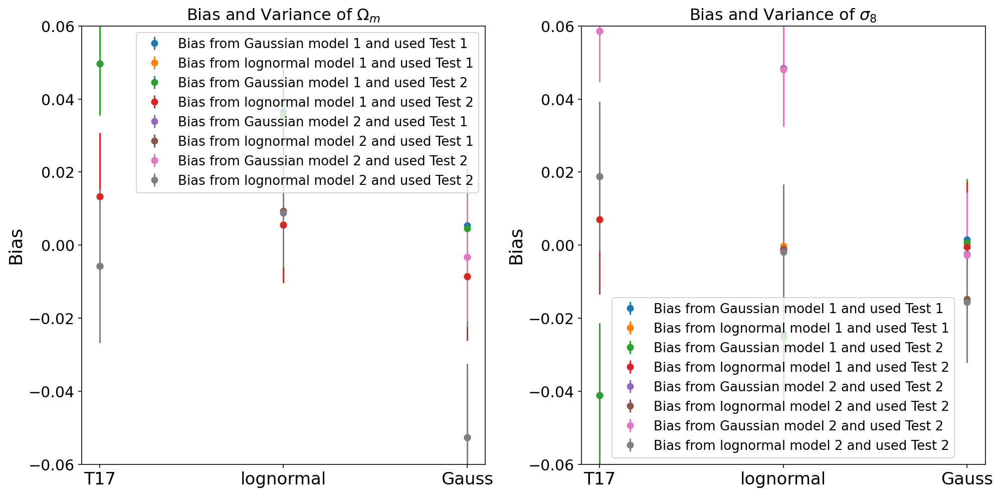

In [63]:
labels = ['T17', 'lognormal', 'Gauss']
bias_Omega_M_Gauss_11         = [bias_T17_Gauss_1_Omega_M, bias_lognormal_1_Gauss_1_Omega_M, bias_Gauss_1_Gauss_1_Omega_M]
variance_Omega_M_Gauss_11     = [var_T17_Gauss_1_Omega_M, var_lognormal_1_Gauss_1_Omega_M, var_Gauss_1_Gauss_1_Omega_M]
bias_Omega_M_lognormal_11     = [bias_T17_lognormal_1_Omega_M, bias_lognormal_1_lognormal_1_Omega_M, bias_Gauss_1_lognormal_1_Omega_M]
variance_Omega_M_lognormal_11 = [var_T17_lognormal_1_Omega_M, var_lognormal_1_lognormal_1_Omega_M, var_Gauss_1_lognormal_1_Omega_M]

bias_Omega_M_Gauss_21         = [bias_T17_Gauss_1_Omega_M, bias_lognormal_2_Gauss_1_Omega_M, bias_Gauss_2_Gauss_1_Omega_M]
variance_Omega_M_Gauss_21     = [var_T17_Gauss_1_Omega_M, var_lognormal_2_Gauss_1_Omega_M, var_Gauss_2_Gauss_1_Omega_M]
bias_Omega_M_lognormal_21     = [bias_T17_lognormal_1_Omega_M, bias_lognormal_2_lognormal_1_Omega_M, bias_Gauss_2_lognormal_1_Omega_M]
variance_Omega_M_lognormal_21 = [var_T17_lognormal_1_Omega_M, var_lognormal_2_lognormal_1_Omega_M, var_Gauss_2_lognormal_1_Omega_M]

bias_Omega_M_Gauss_12         = [bias_T17_Gauss_2_Omega_M, bias_lognormal_1_Gauss_2_Omega_M, bias_Gauss_1_Gauss_2_Omega_M]
variance_Omega_M_Gauss_12     = [var_T17_Gauss_2_Omega_M, var_lognormal_1_Gauss_2_Omega_M, var_Gauss_1_Gauss_2_Omega_M]
bias_Omega_M_lognormal_12     = [bias_T17_lognormal_2_Omega_M, bias_lognormal_1_lognormal_2_Omega_M, bias_Gauss_1_lognormal_2_Omega_M]
variance_Omega_M_lognormal_12 = [var_T17_lognormal_2_Omega_M, var_lognormal_1_lognormal_2_Omega_M, var_Gauss_1_lognormal_2_Omega_M]

bias_Omega_M_Gauss_22         = [bias_T17_Gauss_2_Omega_M, bias_lognormal_2_Gauss_2_Omega_M, bias_Gauss_2_Gauss_2_Omega_M]
variance_Omega_M_Gauss_22     = [var_T17_Gauss_2_Omega_M, var_lognormal_2_Gauss_2_Omega_M, var_Gauss_2_Gauss_2_Omega_M]
bias_Omega_M_lognormal_22     = [bias_T17_lognormal_2_Omega_M, bias_lognormal_2_lognormal_2_Omega_M, bias_Gauss_2_lognormal_2_Omega_M]
variance_Omega_M_lognormal_22 = [var_T17_lognormal_2_Omega_M, var_lognormal_2_lognormal_2_Omega_M, var_Gauss_2_lognormal_2_Omega_M]

bias_sigma_8_Gauss_11         = [bias_T17_Gauss_1_sigma_8, bias_lognormal_1_Gauss_1_sigma_8, bias_Gauss_1_Gauss_1_sigma_8]
variance_sigma_8_Gauss_11     = [var_T17_Gauss_1_sigma_8, var_lognormal_1_Gauss_1_sigma_8, var_Gauss_1_Gauss_1_sigma_8]
bias_sigma_8_lognormal_11     = [bias_T17_lognormal_1_sigma_8, bias_lognormal_1_lognormal_1_sigma_8, bias_Gauss_1_lognormal_1_sigma_8]
variance_sigma_8_lognormal_11 = [var_T17_lognormal_1_sigma_8, var_lognormal_1_lognormal_1_sigma_8, var_Gauss_1_lognormal_1_sigma_8]

bias_sigma_8_Gauss_21         = [bias_T17_Gauss_1_sigma_8, bias_lognormal_2_Gauss_1_sigma_8, bias_Gauss_2_Gauss_1_sigma_8]
variance_sigma_8_Gauss_21     = [var_T17_Gauss_1_sigma_8, var_lognormal_2_Gauss_1_sigma_8, var_Gauss_2_Gauss_1_sigma_8]
bias_sigma_8_lognormal_21     = [bias_T17_lognormal_1_sigma_8, bias_lognormal_2_lognormal_1_sigma_8, bias_Gauss_2_lognormal_1_sigma_8]
variance_sigma_8_lognormal_21 = [var_T17_lognormal_1_sigma_8, var_lognormal_2_lognormal_1_sigma_8, var_Gauss_2_lognormal_1_sigma_8]

bias_sigma_8_Gauss_12         = [bias_T17_Gauss_2_sigma_8, bias_lognormal_1_Gauss_2_sigma_8, bias_Gauss_1_Gauss_2_sigma_8]
variance_sigma_8_Gauss_12     = [var_T17_Gauss_2_sigma_8, var_lognormal_1_Gauss_2_sigma_8, var_Gauss_1_Gauss_2_sigma_8]
bias_sigma_8_lognormal_12     = [bias_T17_lognormal_2_sigma_8, bias_lognormal_1_lognormal_2_sigma_8, bias_Gauss_1_lognormal_2_sigma_8]
variance_sigma_8_lognormal_12 = [var_T17_lognormal_2_sigma_8, var_lognormal_1_lognormal_2_sigma_8, var_Gauss_1_lognormal_2_sigma_8]

bias_sigma_8_Gauss_22         = [bias_T17_Gauss_2_sigma_8, bias_lognormal_2_Gauss_2_sigma_8, bias_Gauss_2_Gauss_2_sigma_8]
variance_sigma_8_Gauss_22     = [var_T17_Gauss_2_sigma_8, var_lognormal_2_Gauss_2_sigma_8, var_Gauss_2_Gauss_2_sigma_8]
bias_sigma_8_lognormal_22     = [bias_T17_lognormal_2_sigma_8, bias_lognormal_2_lognormal_2_sigma_8, bias_Gauss_2_lognormal_2_sigma_8]
variance_sigma_8_lognormal_22 = [var_T17_lognormal_2_sigma_8, var_lognormal_2_lognormal_2_sigma_8, var_Gauss_2_lognormal_2_sigma_8]

# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))

# Plot bias for Omega_M
ax1.errorbar(labels, bias_Omega_M_Gauss_11, yerr=np.sqrt(variance_Omega_M_Gauss_11), fmt='o', label='Bias from Gaussian model 1 and used Test 1')
ax1.errorbar(labels, bias_Omega_M_lognormal_11, yerr=np.sqrt(variance_Omega_M_lognormal_11), fmt='o', label='Bias from lognormal model 1 and used Test 1')
ax1.errorbar(labels, bias_Omega_M_Gauss_21, yerr=np.sqrt(variance_Omega_M_Gauss_21), fmt='o', label='Bias from Gaussian model 1 and used Test 2')
ax1.errorbar(labels, bias_Omega_M_lognormal_21, yerr=np.sqrt(variance_Omega_M_lognormal_21), fmt='o', label='Bias from lognormal model 1 and used Test 2')
ax1.errorbar(labels, bias_Omega_M_Gauss_12, yerr=np.sqrt(variance_Omega_M_Gauss_12), fmt='o', label='Bias from Gaussian model 2 and used Test 1')
ax1.errorbar(labels, bias_Omega_M_lognormal_12, yerr=np.sqrt(variance_Omega_M_lognormal_12), fmt='o', label='Bias from lognormal model 2 and used Test 1')
ax1.errorbar(labels, bias_Omega_M_Gauss_22, yerr=np.sqrt(variance_Omega_M_Gauss_22), fmt='o', label='Bias from Gaussian model 2 and used Test 2')
ax1.errorbar(labels, bias_Omega_M_lognormal_22, yerr=np.sqrt(variance_Omega_M_lognormal_22), fmt='o', label='Bias from lognormal model 2 and used Test 2')
ax1.set_title('Bias and Variance of $\Omega_m$', fontsize=16)
ax1.tick_params(axis='x', labelsize=17)
ax1.tick_params(axis='y', labelsize=15)
ax1.set_ylim(-0.06,0.06)
ax1.set_ylabel('Bias', fontsize=18)
ax1.legend(fontsize=13)

# Plot bias for sigma_8
ax2.errorbar(labels, bias_sigma_8_Gauss_11, yerr=np.sqrt(variance_sigma_8_Gauss_11), fmt='o', label='Bias from Gaussian model 1 and used Test 1')
ax2.errorbar(labels, bias_sigma_8_lognormal_11, yerr=np.sqrt(variance_sigma_8_lognormal_11), fmt='o', label='Bias from lognormal model 1 and used Test 1')
ax2.errorbar(labels, bias_sigma_8_Gauss_21, yerr=np.sqrt(variance_sigma_8_Gauss_21), fmt='o', label='Bias from Gaussian model 1 and used Test 2')
ax2.errorbar(labels, bias_sigma_8_lognormal_21, yerr=np.sqrt(variance_sigma_8_lognormal_21), fmt='o', label='Bias from lognormal model 1 and used Test 2')
ax2.errorbar(labels, bias_sigma_8_Gauss_12, yerr=np.sqrt(variance_sigma_8_Gauss_12), fmt='o', label='Bias from Gaussian model 2 and used Test 2')
ax2.errorbar(labels, bias_sigma_8_lognormal_12, yerr=np.sqrt(variance_sigma_8_lognormal_12), fmt='o', label='Bias from lognormal model 2 and used Test 2')
ax2.errorbar(labels, bias_sigma_8_Gauss_22, yerr=np.sqrt(variance_sigma_8_Gauss_22), fmt='o', label='Bias from Gaussian model 2 and used Test 2')
ax2.errorbar(labels, bias_sigma_8_lognormal_22, yerr=np.sqrt(variance_sigma_8_lognormal_22), fmt='o', label='Bias from lognormal model 2 and used Test 2')
ax2.set_title('Bias and Variance of $\sigma_8$', fontsize=16)
ax2.tick_params(axis='x', labelsize=17)
ax2.tick_params(axis='y', labelsize=15)
ax2.set_ylabel('Bias', fontsize=18)
ax2.set_ylim(-0.06,0.06)
ax2.legend(fontsize=13)

plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Bias_variance.png',bbox_inches='tight')
plt.show();

In [64]:
dis_T17_Gauss_1             = np.sqrt((bias_T17_Gauss_1_Omega_M)**2+(bias_T17_Gauss_1_sigma_8)**2)
dis_T17_Gauss_2             = np.sqrt((bias_T17_Gauss_2_Omega_M)**2+(bias_T17_Gauss_2_sigma_8)**2)
dis_Gauss_1_Gauss_1         = np.sqrt((bias_Gauss_1_Gauss_1_Omega_M)**2+(bias_Gauss_1_Gauss_1_sigma_8)**2)
dis_lognormal_1_Gauss_1     = np.sqrt((bias_lognormal_1_Gauss_1_Omega_M)**2+(bias_lognormal_1_Gauss_1_sigma_8)**2)
dis_Gauss_2_Gauss_1         = np.sqrt((bias_Gauss_2_Gauss_1_Omega_M)**2+(bias_Gauss_2_Gauss_1_sigma_8)**2)
dis_lognormal_2_Gauss_1     = np.sqrt((bias_lognormal_2_Gauss_1_Omega_M)**2+(bias_lognormal_2_Gauss_1_sigma_8)**2)
dis_Gauss_1_Gauss_2         = np.sqrt((bias_Gauss_1_Gauss_2_Omega_M)**2+(bias_Gauss_1_Gauss_2_sigma_8)**2)
dis_lognormal_1_Gauss_2     = np.sqrt((bias_lognormal_1_Gauss_2_Omega_M)**2+(bias_lognormal_1_Gauss_2_sigma_8)**2)
dis_Gauss_2_Gauss_2         = np.sqrt((bias_Gauss_2_Gauss_2_Omega_M)**2+(bias_Gauss_2_Gauss_2_sigma_8)**2)
dis_lognormal_2_Gauss_2     = np.sqrt((bias_lognormal_2_Gauss_2_Omega_M)**2+(bias_lognormal_2_Gauss_2_sigma_8)**2)
dis_T17_lognormal_1         = np.sqrt((bias_T17_lognormal_1_Omega_M)**2+(bias_T17_lognormal_1_sigma_8)**2)
dis_T17_lognormal_2         = np.sqrt((bias_T17_lognormal_2_Omega_M)**2+(bias_T17_lognormal_2_sigma_8)**2)
dis_Gauss_1_lognormal_1     = np.sqrt((bias_Gauss_1_lognormal_1_Omega_M)**2+(bias_Gauss_1_lognormal_1_sigma_8)**2)
dis_lognormal_1_lognormal_1 = np.sqrt((bias_lognormal_1_lognormal_1_Omega_M)**2+(bias_lognormal_1_lognormal_1_sigma_8)**2)
dis_Gauss_2_lognormal_1     = np.sqrt((bias_Gauss_2_lognormal_1_Omega_M)**2+(bias_Gauss_2_lognormal_1_sigma_8)**2)
dis_lognormal_2_lognormal_1 = np.sqrt((bias_lognormal_2_lognormal_1_Omega_M)**2+(bias_lognormal_2_lognormal_1_sigma_8)**2)
dis_Gauss_1_lognormal_2     = np.sqrt((bias_Gauss_1_lognormal_2_Omega_M)**2+(bias_Gauss_1_lognormal_2_sigma_8)**2)
dis_lognormal_1_lognormal_2 = np.sqrt((bias_lognormal_1_lognormal_2_Omega_M)**2+(bias_lognormal_1_lognormal_2_sigma_8)**2)
dis_Gauss_2_lognormal_2     = np.sqrt((bias_Gauss_2_lognormal_2_Omega_M)**2+(bias_Gauss_2_lognormal_2_sigma_8)**2)
dis_lognormal_2_lognormal_2 = np.sqrt((bias_lognormal_2_lognormal_2_Omega_M)**2+(bias_lognormal_2_lognormal_2_sigma_8)**2)

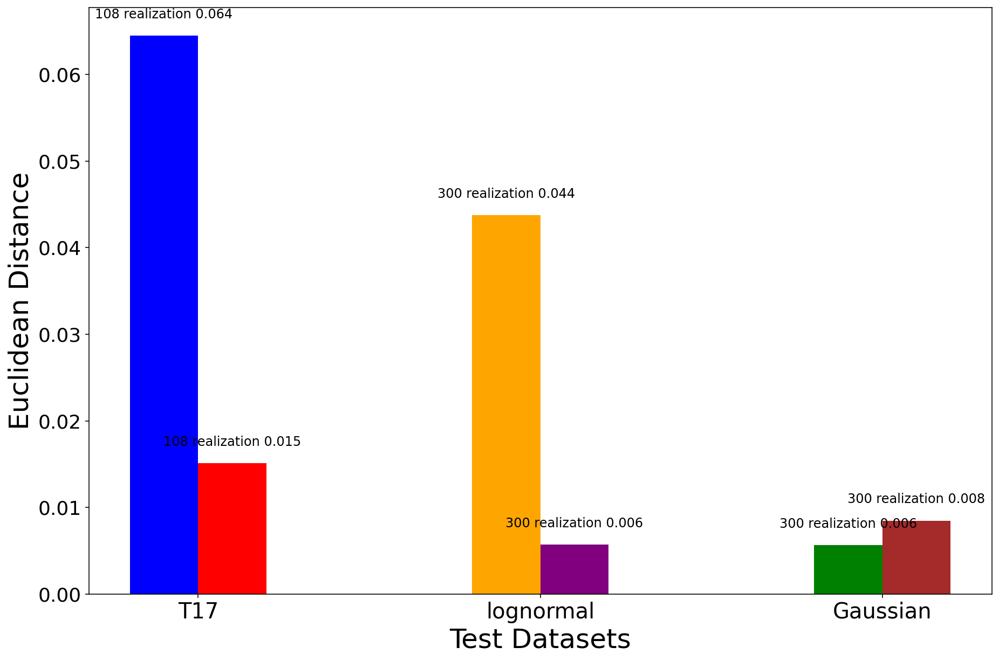

In [65]:
bias_indicators = ['T17', 'lognormal', 'Gaussian']
bar_width = 0.2  # Width of each bar
bar_positions = range(len(bias_indicators))  # X-axis positions for bars
colors1 = ['blue', 'orange','green']
colors2 = ['red', 'purple', 'brown']
# Example data (replace with your actual data)
dis_Gauss_11          = [dis_T17_Gauss_1, dis_lognormal_1_Gauss_1, dis_Gauss_1_Gauss_1]
dis_Gauss_12          = [dis_T17_Gauss_2, dis_lognormal_1_Gauss_2, dis_Gauss_1_Gauss_2]
dis_Gauss_21          = [dis_T17_Gauss_1, dis_lognormal_2_Gauss_1, dis_Gauss_2_Gauss_1]
dis_Gauss_22          = [dis_T17_Gauss_2, dis_lognormal_2_Gauss_2, dis_Gauss_2_Gauss_2]
dis_lognormal_11      = [dis_T17_lognormal_1, dis_lognormal_1_lognormal_1,dis_Gauss_1_lognormal_1]
dis_lognormal_12      = [dis_T17_lognormal_2, dis_lognormal_1_lognormal_2,dis_Gauss_1_lognormal_2]
dis_lognormal_21      = [dis_T17_lognormal_1, dis_lognormal_2_lognormal_1,dis_Gauss_2_lognormal_1]
dis_lognormal_22      = [dis_T17_lognormal_2, dis_lognormal_2_lognormal_2,dis_Gauss_2_lognormal_2]
plt.figure(figsize=(15, 10))
for i, v in enumerate(dis_Gauss_11):
    if i==0:
        plt.text(i - bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i - bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
for i, v in enumerate(dis_lognormal_11):
    if i==0:
        plt.text(i + bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i + bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
plt.bar([pos - bar_width * 0.5 for pos in bar_positions], dis_Gauss_11, width=bar_width, color=colors1, label='Trained with Gaussian')
plt.bar([pos + bar_width * 0.5 for pos in bar_positions], dis_lognormal_11, width=bar_width, color=colors2, label='Trained with lognormal')
plt.yticks(fontsize=18)
plt.xticks(fontsize=20)
plt.ylabel('Euclidean Distance', fontsize=25)
plt.xlabel('Test Datasets', fontsize=25)
plt.xticks(bar_positions, bias_indicators)
#plt.legend(fontsize=15)
#plt.title('Bias Indicator Values', fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/bias_indicatos_11.jpg',bbox_inches='tight')
plt.show();

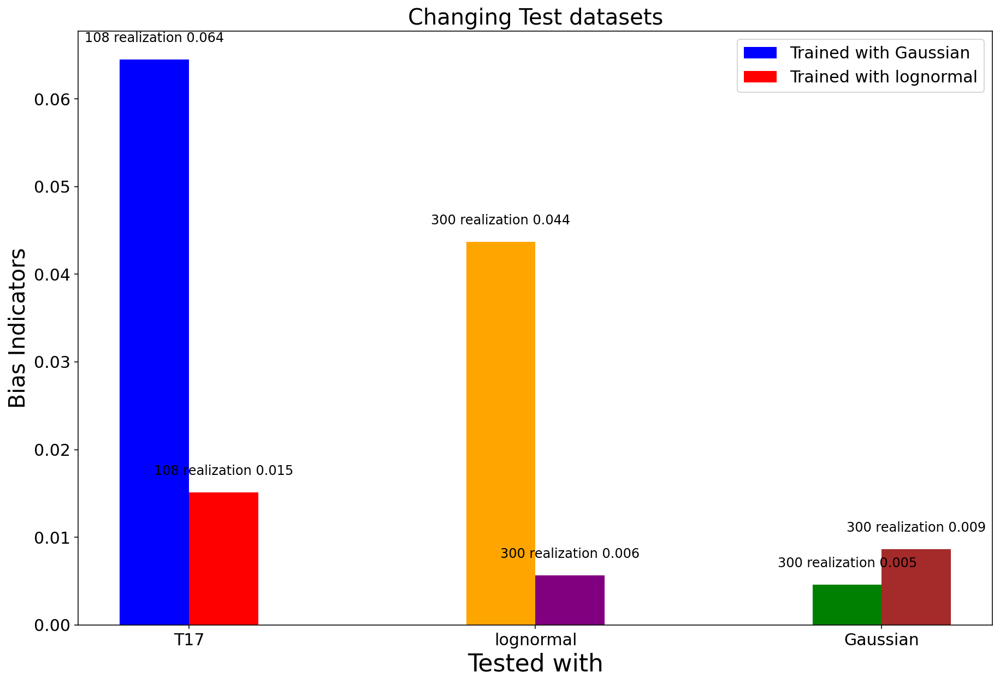

In [66]:
plt.figure(figsize=(15, 10))
for i, v in enumerate(dis_Gauss_21):
    if i==0:
        plt.text(i - bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i - bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
for i, v in enumerate(dis_lognormal_21):
    if i==0:
        plt.text(i + bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i + bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
plt.bar([pos - bar_width * 0.5 for pos in bar_positions], dis_Gauss_21, width=bar_width, color=colors1, label='Trained with Gaussian')
plt.bar([pos + bar_width * 0.5 for pos in bar_positions], dis_lognormal_21, width=bar_width, color=colors2, label='Trained with lognormal')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.ylabel('Bias Indicators', fontsize=20)
plt.xlabel('Tested with', fontsize=22)
plt.xticks(bar_positions, bias_indicators)
plt.legend(fontsize=15)
plt.title('Changing Test datasets', fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/bias_indicatos_fair_21.png',bbox_inches='tight')
plt.show();

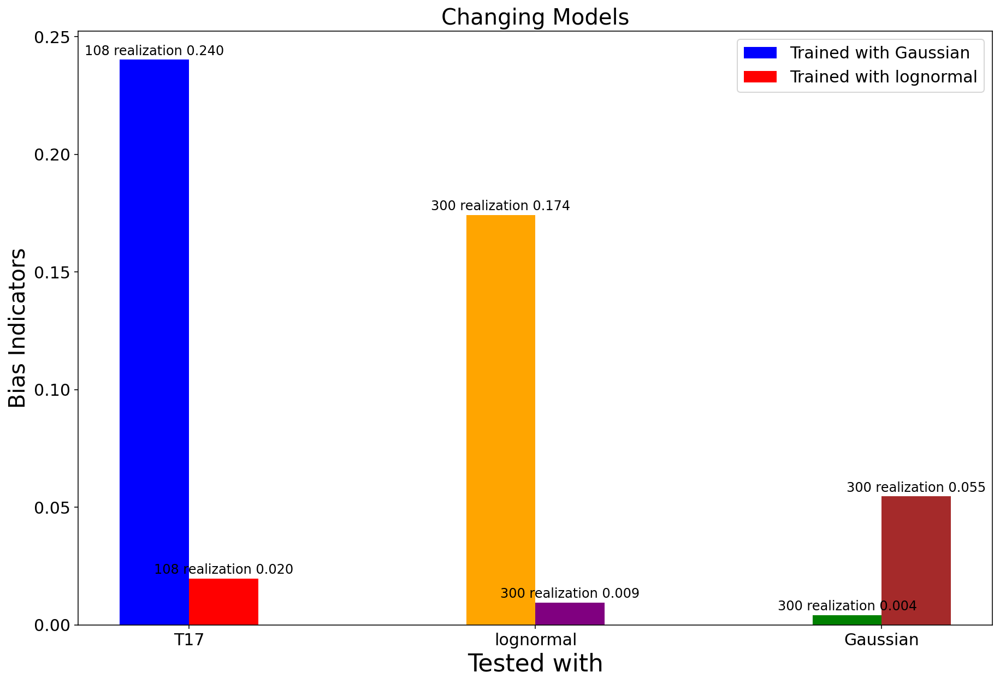

In [67]:
plt.figure(figsize=(15, 10))
for i, v in enumerate(dis_Gauss_12):
    if i==0:
        plt.text(i - bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i - bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
for i, v in enumerate(dis_lognormal_12):
    if i==0:
        plt.text(i + bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i + bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
plt.bar([pos - bar_width * 0.5 for pos in bar_positions], dis_Gauss_12, width=bar_width, color=colors1, label='Trained with Gaussian')
plt.bar([pos + bar_width * 0.5 for pos in bar_positions], dis_lognormal_12, width=bar_width, color=colors2, label='Trained with lognormal')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.ylabel('Bias Indicators', fontsize=20)
plt.xlabel('Tested with', fontsize=22)
plt.xticks(bar_positions, bias_indicators)
plt.legend(fontsize=15)
plt.title('Changing Models', fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/bias_indicatos_fair_12.png',bbox_inches='tight')
plt.show();

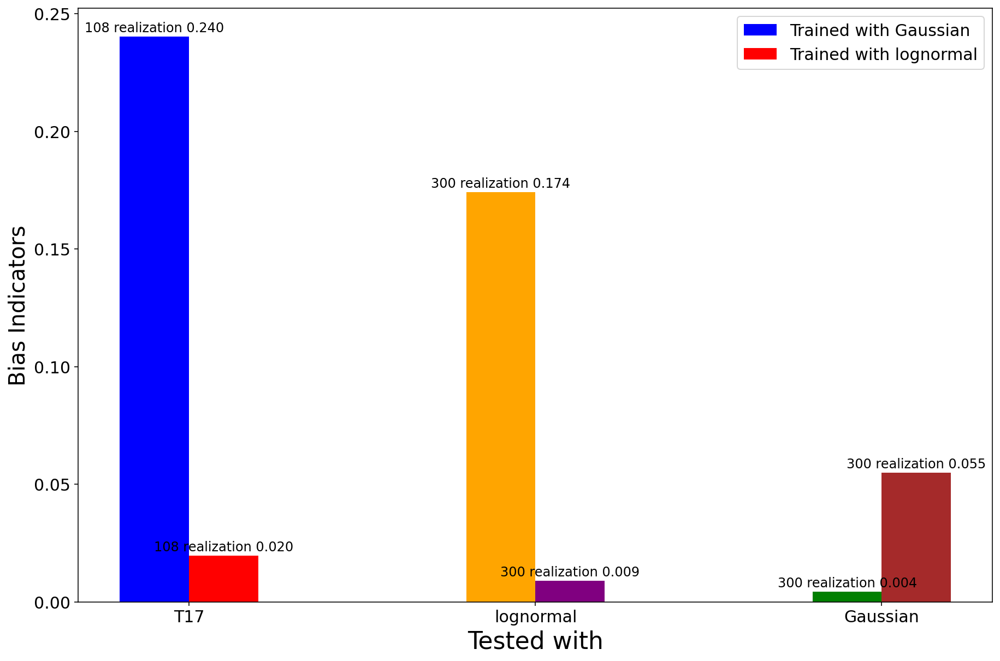

In [68]:
plt.figure(figsize=(15, 10))
for i, v in enumerate(dis_Gauss_22):
    if i==0:
        plt.text(i - bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i - bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
for i, v in enumerate(dis_lognormal_22):
    if i==0:
        plt.text(i + bar_width *0.5, v + 0.002, f'108 realization {v:.3f}', color='black', ha='center', fontsize=12)
    else:
        plt.text(i + bar_width *0.5, v + 0.002, f'300 realization {v:.3f}', color='black', ha='center', fontsize=12)
plt.bar([pos - bar_width * 0.5 for pos in bar_positions], dis_Gauss_22, width=bar_width, color=colors1, label='Trained with Gaussian')
plt.bar([pos + bar_width * 0.5 for pos in bar_positions], dis_lognormal_22, width=bar_width, color=colors2, label='Trained with lognormal')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.ylabel('Bias Indicators', fontsize=20)
plt.xlabel('Tested with', fontsize=22)
plt.xticks(bar_positions, bias_indicators)
plt.legend(fontsize=15)
#plt.title('Changing Models', fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/bias_indicatos_fair_22.jpg',bbox_inches='tight')
plt.show();

In [69]:
mu_T17_Gauss_1                  = np.array((prediction_T17_Gauss_1_Omega_M_mean, prediction_T17_Gauss_1_sigma_8_mean)).T
mu_T17_Gauss_2                  = np.array((prediction_T17_Gauss_2_Omega_M_mean, prediction_T17_Gauss_2_sigma_8_mean)).T
mu_lognormal_1_Gauss_1          = np.array((prediction_lognormal_1_Gauss_1_Omega_M_mean, prediction_lognormal_1_Gauss_1_sigma_8_mean)).T
mu_lognormal_1_Gauss_2          = np.array((prediction_lognormal_1_Gauss_2_Omega_M_mean, prediction_lognormal_1_Gauss_2_sigma_8_mean)).T
mu_lognormal_2_Gauss_1          = np.array((prediction_lognormal_2_Gauss_1_Omega_M_mean, prediction_lognormal_2_Gauss_1_sigma_8_mean)).T
mu_lognormal_2_Gauss_2          = np.array((prediction_lognormal_2_Gauss_2_Omega_M_mean, prediction_lognormal_2_Gauss_2_sigma_8_mean)).T
mu_Gauss_1_Gauss_1              = np.array((prediction_Gauss_1_Gauss_1_Omega_M_mean, prediction_Gauss_1_Gauss_1_sigma_8_mean)).T
mu_Gauss_1_Gauss_2              = np.array((prediction_Gauss_1_Gauss_2_Omega_M_mean, prediction_Gauss_1_Gauss_2_sigma_8_mean)).T
mu_Gauss_2_Gauss_1              = np.array((prediction_Gauss_2_Gauss_1_Omega_M_mean, prediction_Gauss_2_Gauss_1_sigma_8_mean)).T
mu_Gauss_2_Gauss_2              = np.array((prediction_Gauss_2_Gauss_2_Omega_M_mean, prediction_Gauss_2_Gauss_2_sigma_8_mean)).T
mu_T17_lognormal_1              = np.array((prediction_T17_lognormal_1_Omega_M_mean, prediction_T17_lognormal_1_sigma_8_mean)).T
mu_T17_lognormal_2              = np.array((prediction_T17_lognormal_2_Omega_M_mean, prediction_T17_lognormal_2_sigma_8_mean)).T
mu_lognormal_1_lognormal_1      = np.array((prediction_lognormal_1_lognormal_1_Omega_M_mean, prediction_lognormal_1_lognormal_1_sigma_8_mean)).T
mu_lognormal_1_lognormal_2      = np.array((prediction_lognormal_1_lognormal_2_Omega_M_mean, prediction_lognormal_1_lognormal_2_sigma_8_mean)).T
mu_lognormal_2_lognormal_1      = np.array((prediction_lognormal_2_lognormal_1_Omega_M_mean, prediction_lognormal_2_lognormal_1_sigma_8_mean)).T
mu_lognormal_2_lognormal_2      = np.array((prediction_lognormal_2_lognormal_2_Omega_M_mean, prediction_lognormal_2_lognormal_2_sigma_8_mean)).T
mu_Gauss_1_lognormal_1          = np.array((prediction_Gauss_1_lognormal_1_Omega_M_mean, prediction_Gauss_1_lognormal_1_sigma_8_mean)).T
mu_Gauss_1_lognormal_2          = np.array((prediction_Gauss_1_lognormal_2_Omega_M_mean, prediction_Gauss_1_lognormal_2_sigma_8_mean)).T
mu_Gauss_2_lognormal_1          = np.array((prediction_Gauss_2_lognormal_1_Omega_M_mean, prediction_Gauss_2_lognormal_1_sigma_8_mean)).T
mu_Gauss_2_lognormal_2          = np.array((prediction_Gauss_2_lognormal_2_Omega_M_mean, prediction_Gauss_2_lognormal_2_sigma_8_mean)).T
cov_T17_Gauss_1_KDE             = cov(mu_T17_Gauss_1, prediction_T17_Gauss_1[:,:2])
cov_T17_Gauss_2_KDE             = cov(mu_T17_Gauss_2, prediction_T17_Gauss_2[:,:2])
cov_lognormal_1_Gauss_1_KDE     = cov(mu_lognormal_1_Gauss_1, prediction_lognormal_1_Gauss_1[:,:2])
cov_lognormal_1_Gauss_2_KDE     = cov(mu_lognormal_1_Gauss_2, prediction_lognormal_1_Gauss_2[:,:2])
cov_lognormal_2_Gauss_1_KDE     = cov(mu_lognormal_2_Gauss_1, prediction_lognormal_2_Gauss_1[:,:2])
cov_lognormal_2_Gauss_2_KDE     = cov(mu_lognormal_2_Gauss_2, prediction_lognormal_2_Gauss_2[:,:2])
cov_Gauss_1_Gauss_1_KDE         = cov(mu_Gauss_1_Gauss_1, prediction_Gauss_1_Gauss_1[:,:2])
cov_Gauss_1_Gauss_2_KDE         = cov(mu_Gauss_1_Gauss_2, prediction_Gauss_1_Gauss_2[:,:2])
cov_Gauss_2_Gauss_1_KDE         = cov(mu_Gauss_2_Gauss_1, prediction_Gauss_2_Gauss_1[:,:2])
cov_Gauss_2_Gauss_2_KDE         = cov(mu_Gauss_2_Gauss_2, prediction_Gauss_2_Gauss_2[:,:2])
cov_T17_lognormal_1_KDE         = cov(mu_T17_lognormal_1, prediction_T17_lognormal_1[:,:2])
cov_T17_lognormal_2_KDE         = cov(mu_T17_lognormal_2, prediction_T17_lognormal_2[:,:2])
cov_lognormal_1_lognormal_1_KDE = cov(mu_lognormal_1_lognormal_1, prediction_lognormal_1_lognormal_1[:,:2])
cov_lognormal_1_lognormal_2_KDE = cov(mu_lognormal_1_lognormal_2, prediction_lognormal_1_lognormal_2[:,:2])
cov_lognormal_2_lognormal_1_KDE = cov(mu_lognormal_2_lognormal_1, prediction_lognormal_2_lognormal_1[:,:2])
cov_lognormal_2_lognormal_2_KDE = cov(mu_lognormal_2_lognormal_2, prediction_lognormal_2_lognormal_2[:,:2])
cov_Gauss_1_lognormal_1_KDE     = cov(mu_Gauss_1_lognormal_1, prediction_Gauss_1_lognormal_1[:,:2])
cov_Gauss_1_lognormal_2_KDE     = cov(mu_Gauss_1_lognormal_2, prediction_Gauss_1_lognormal_2[:,:2])
cov_Gauss_2_lognormal_1_KDE     = cov(mu_Gauss_2_lognormal_1, prediction_Gauss_2_lognormal_1[:,:2])
cov_Gauss_2_lognormal_2_KDE     = cov(mu_Gauss_2_lognormal_2, prediction_Gauss_2_lognormal_2[:,:2])

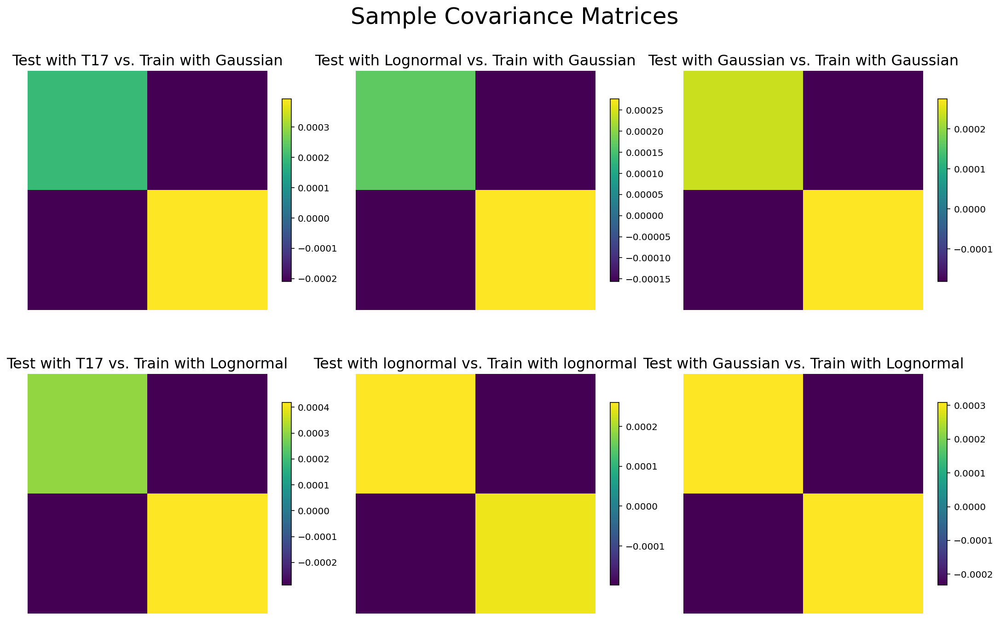

In [70]:
# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
plt.subplots_adjust(hspace=0.4)

# List of covariance matrices and their corresponding titles
cov_matrices_KDE_1 = [
    cov_T17_Gauss_1_KDE, cov_lognormal_1_Gauss_1_KDE, cov_Gauss_1_Gauss_1_KDE
    , cov_T17_lognormal_1_KDE, cov_lognormal_1_lognormal_1_KDE, cov_Gauss_1_lognormal_1_KDE
]
titles = [
    'Test with T17 vs. Train with Gaussian', 'Test with Lognormal vs. Train with Gaussian',
    'Test with Gaussian vs. Train with Gaussian', 'Test with T17 vs. Train with Lognormal',
    'Test with lognormal vs. Train with lognormal', 'Test with Gaussian vs. Train with Lognormal'
]

# Loop through subplots and plot each covariance matrix
for ax, cov_matrix, title in zip(axes.flatten(), cov_matrices_KDE_1, titles):
    im = ax.imshow(cov_matrix, cmap='viridis')
    ax.set_title(title, fontsize=16)
    ax.axis('off')
    fig.colorbar(im, ax=ax, shrink=0.6)

# Add a title and display the plot
fig.suptitle('Sample Covariance Matrices', fontsize=25)
plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/cov_KDE.jpg',bbox_inches='tight')
plt.show()

In [71]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_T17_lognormal_1_KDE                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_T17_lognormal_1_KDE, size=nsamp)
samples_T17_lognormal_2_KDE                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_T17_lognormal_2_KDE, size=nsamp)
samples_Gauss_1_lognormal_1_KDE               = np.random.multivariate_normal(mu_Gauss_1_lognormal_1, cov_Gauss_1_lognormal_1_KDE, size=nsamp)
samples_Gauss_1_lognormal_2_KDE               = np.random.multivariate_normal(mu_Gauss_1_lognormal_2, cov_Gauss_1_lognormal_2_KDE, size=nsamp)
samples_Gauss_2_lognormal_1_KDE               = np.random.multivariate_normal(mu_Gauss_2_lognormal_1, cov_Gauss_2_lognormal_1_KDE, size=nsamp)
samples_Gauss_2_lognormal_2_KDE               = np.random.multivariate_normal(mu_Gauss_2_lognormal_2, cov_Gauss_2_lognormal_2_KDE, size=nsamp)
samples_lognormal_1_lognormal_1_KDE           = np.random.multivariate_normal(mu_lognormal_1_lognormal_1, cov_lognormal_1_lognormal_1_KDE, size=nsamp)
samples_lognormal_1_lognormal_2_KDE           = np.random.multivariate_normal(mu_lognormal_1_lognormal_2, cov_lognormal_1_lognormal_2_KDE, size=nsamp)
samples_lognormal_2_lognormal_1_KDE           = np.random.multivariate_normal(mu_lognormal_2_lognormal_1, cov_lognormal_2_lognormal_1_KDE, size=nsamp)
samples_lognormal_2_lognormal_2_KDE           = np.random.multivariate_normal(mu_lognormal_2_lognormal_2, cov_lognormal_2_lognormal_2_KDE, size=nsamp)
samples_T17_lognormal_1_mcsamples_KDE         = MCSamples(samples=samples_T17_lognormal_1_KDE, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_T17_lognormal_2_mcsamples_KDE         = MCSamples(samples=samples_T17_lognormal_2_KDE, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_1_mcsamples_KDE = MCSamples(samples=samples_lognormal_1_lognormal_1_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_2_mcsamples_KDE = MCSamples(samples=samples_lognormal_1_lognormal_2_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_1_mcsamples_KDE = MCSamples(samples=samples_lognormal_2_lognormal_1_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_2_mcsamples_KDE = MCSamples(samples=samples_lognormal_2_lognormal_2_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_1_mcsamples_KDE     = MCSamples(samples=samples_Gauss_1_lognormal_1_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_2_mcsamples_KDE     = MCSamples(samples=samples_Gauss_1_lognormal_2_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_1_mcsamples_KDE     = MCSamples(samples=samples_Gauss_2_lognormal_1_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_2_mcsamples_KDE     = MCSamples(samples=samples_Gauss_2_lognormal_2_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_lognormal_11_KDE = [samples_T17_lognormal_1_mcsamples_KDE, samples_lognormal_1_lognormal_1_mcsamples_KDE, samples_Gauss_1_lognormal_1_mcsamples_KDE]
all_samples_lognormal_12_KDE = [samples_T17_lognormal_2_mcsamples_KDE, samples_lognormal_1_lognormal_2_mcsamples_KDE, samples_Gauss_1_lognormal_2_mcsamples_KDE]
all_samples_lognormal_21_KDE = [samples_T17_lognormal_1_mcsamples_KDE, samples_lognormal_2_lognormal_1_mcsamples_KDE, samples_Gauss_2_lognormal_1_mcsamples_KDE]
all_samples_lognormal_22_KDE = [samples_T17_lognormal_2_mcsamples_KDE, samples_lognormal_2_lognormal_2_mcsamples_KDE, samples_Gauss_2_lognormal_2_mcsamples_KDE]
labels = ['T17', 'lognormal', 'Gauß']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


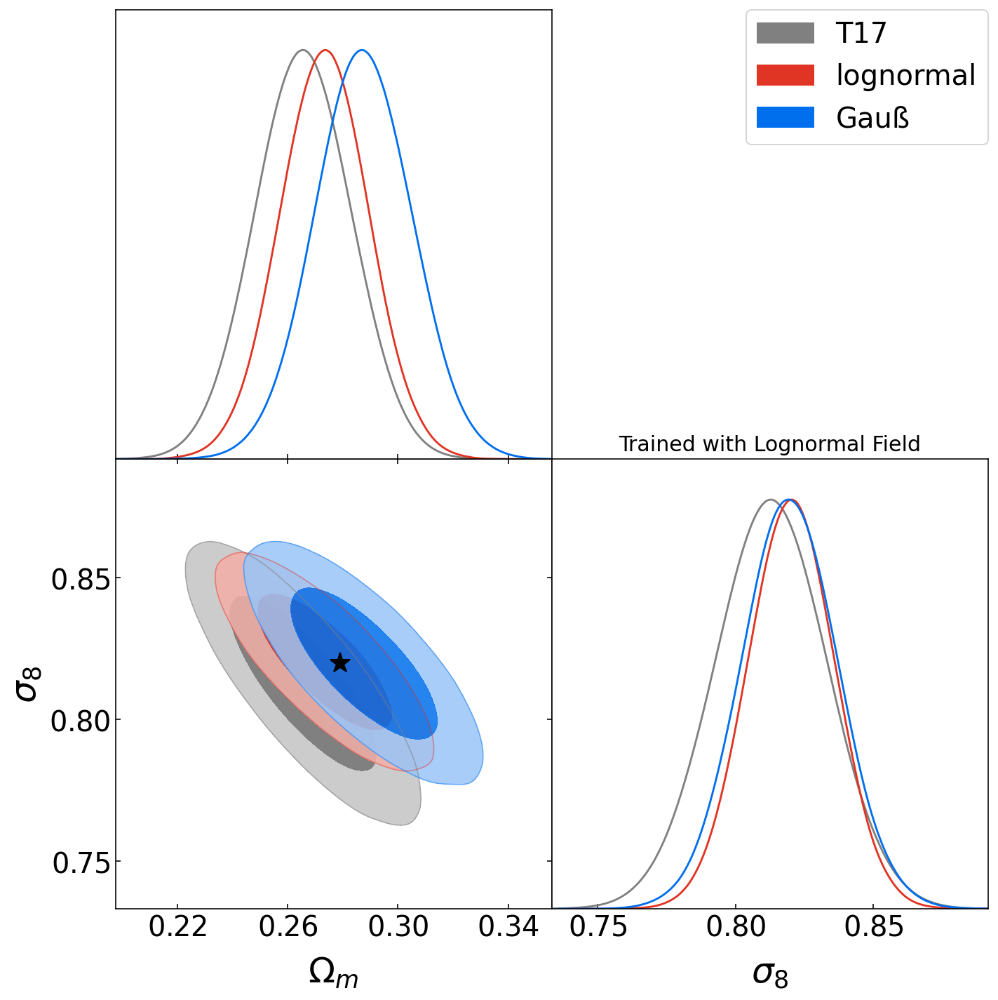

In [72]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 20
# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_lognormal_11_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Trained with Lognormal Field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_11_KDE.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

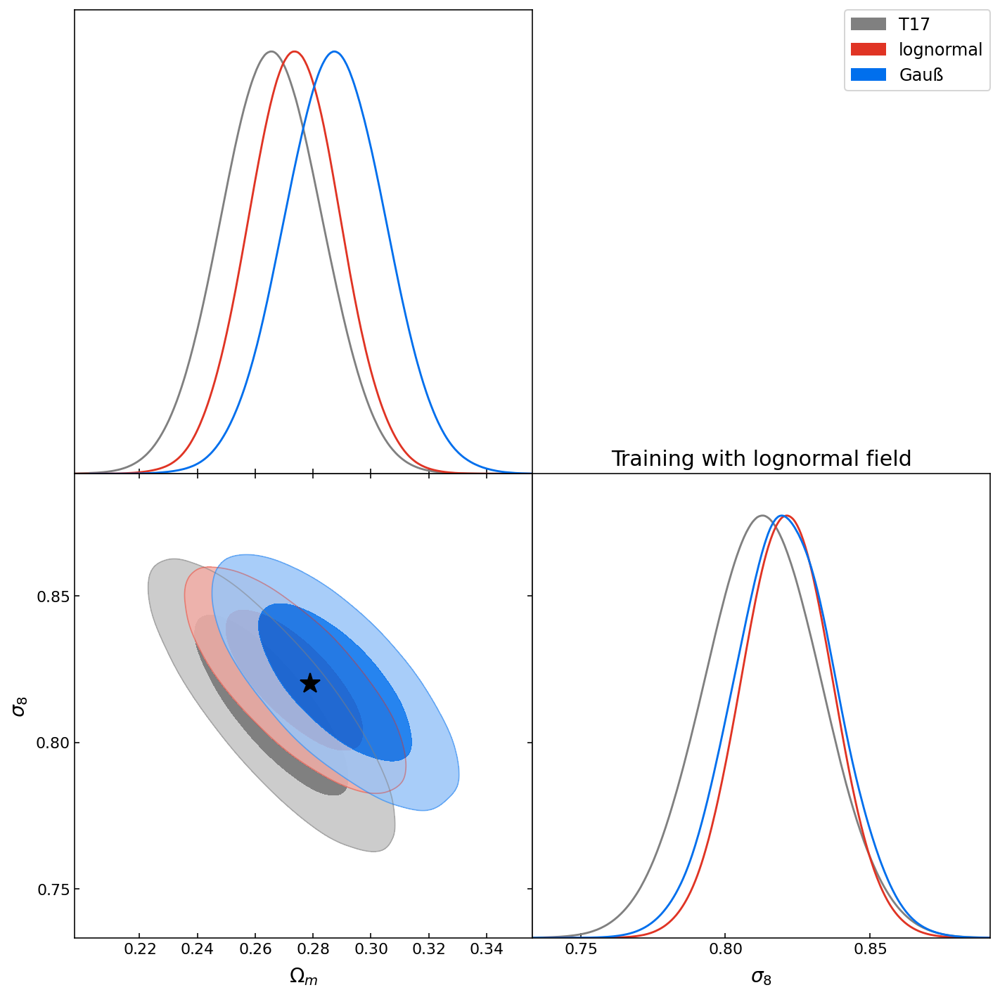

In [73]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)

# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_lognormal_21_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Training with lognormal field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_21_KDE.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

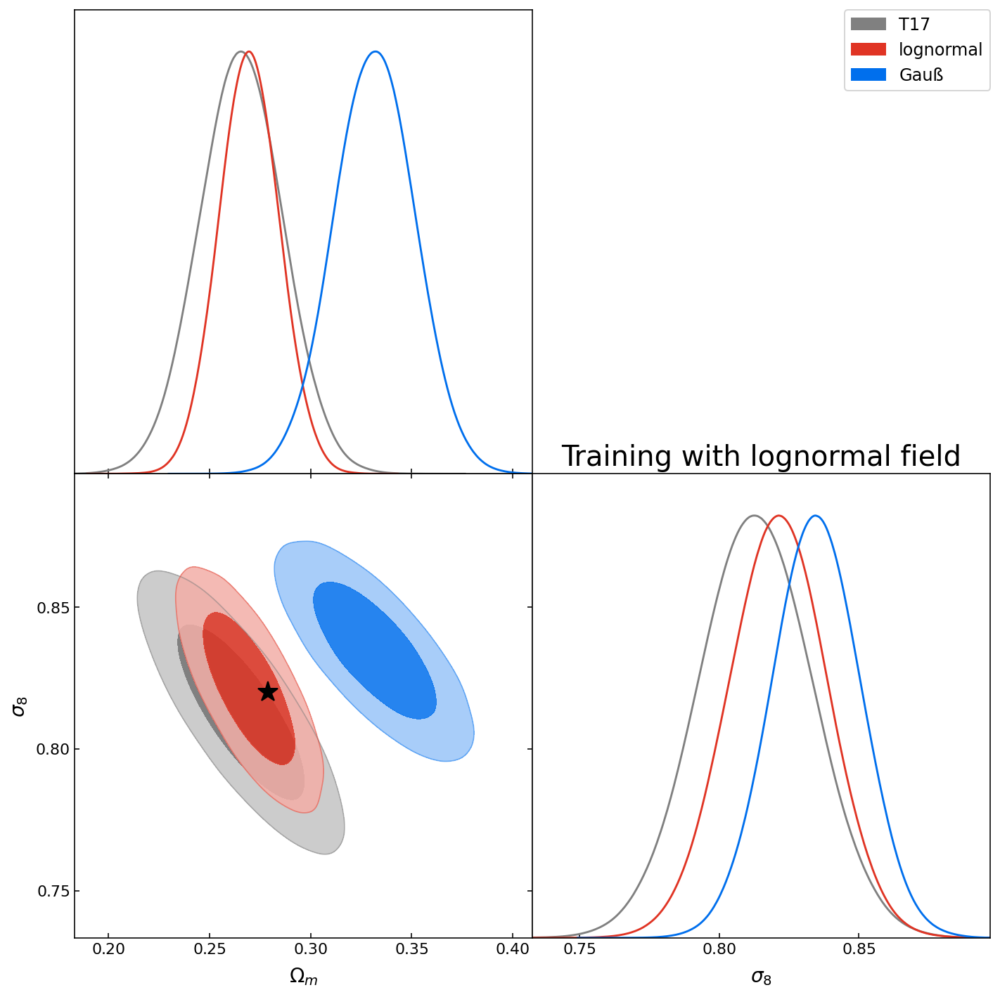

In [74]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)

# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_lognormal_12_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Training with lognormal field',fontsize=20)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_12_KDE.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

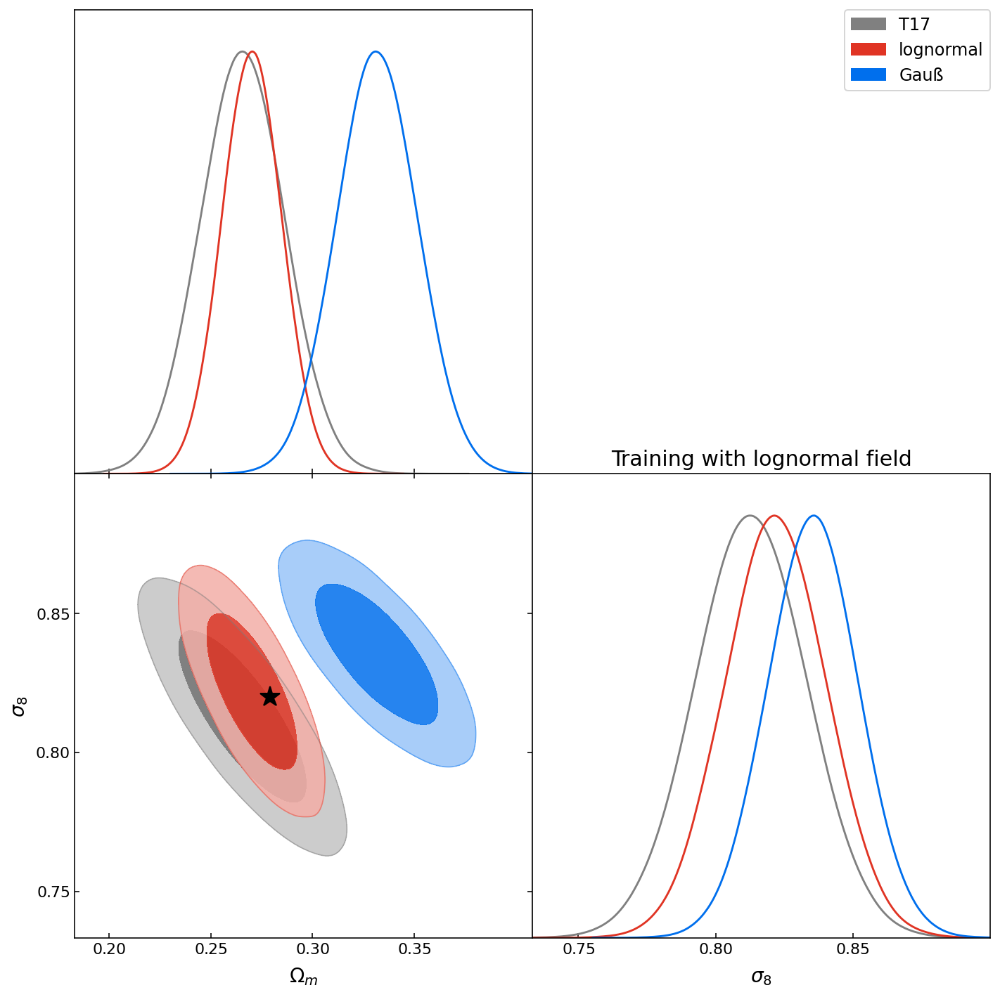

In [75]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)

# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_lognormal_22_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Training with lognormal field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_22_KDE.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [76]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_T17_Gauss_1_KDE                   = np.random.multivariate_normal(mu_T17_Gauss_1, cov_T17_Gauss_1_KDE, size=nsamp)
samples_T17_Gauss_2_KDE                   = np.random.multivariate_normal(mu_T17_Gauss_2, cov_T17_Gauss_2_KDE, size=nsamp)
samples_Gauss_1_Gauss_1_KDE               = np.random.multivariate_normal(mu_Gauss_1_Gauss_1, cov_Gauss_1_Gauss_1_KDE, size=nsamp)
samples_Gauss_1_Gauss_2_KDE               = np.random.multivariate_normal(mu_Gauss_1_Gauss_2, cov_Gauss_1_Gauss_2_KDE, size=nsamp)
samples_Gauss_2_Gauss_1_KDE               = np.random.multivariate_normal(mu_Gauss_2_Gauss_1, cov_Gauss_2_Gauss_1_KDE, size=nsamp)
samples_Gauss_2_Gauss_2_KDE               = np.random.multivariate_normal(mu_Gauss_2_Gauss_2, cov_Gauss_2_Gauss_2_KDE, size=nsamp)
samples_lognormal_1_Gauss_1_KDE           = np.random.multivariate_normal(mu_lognormal_1_Gauss_1, cov_lognormal_1_Gauss_1_KDE, size=nsamp)
samples_lognormal_1_Gauss_2_KDE           = np.random.multivariate_normal(mu_lognormal_1_Gauss_2, cov_lognormal_1_Gauss_2_KDE, size=nsamp)
samples_lognormal_2_Gauss_1_KDE           = np.random.multivariate_normal(mu_lognormal_2_Gauss_1, cov_lognormal_2_Gauss_1_KDE, size=nsamp)
samples_lognormal_2_Gauss_2_KDE           = np.random.multivariate_normal(mu_lognormal_2_Gauss_2, cov_lognormal_2_Gauss_2_KDE, size=nsamp)
samples_T17_Gauss_1_mcsamples_KDE         = MCSamples(samples=samples_T17_Gauss_1_KDE, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_T17_Gauss_2_mcsamples_KDE         = MCSamples(samples=samples_T17_Gauss_2_KDE, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_lognormal_1_Gauss_1_mcsamples_KDE = MCSamples(samples=samples_lognormal_1_Gauss_1_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_1_Gauss_2_mcsamples_KDE = MCSamples(samples=samples_lognormal_1_Gauss_2_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_Gauss_1_mcsamples_KDE = MCSamples(samples=samples_lognormal_2_Gauss_1_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_Gauss_2_mcsamples_KDE = MCSamples(samples=samples_lognormal_2_Gauss_2_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_Gauss_1_Gauss_1_mcsamples_KDE     = MCSamples(samples=samples_Gauss_1_Gauss_1_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_1_Gauss_2_mcsamples_KDE     = MCSamples(samples=samples_Gauss_1_Gauss_2_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_Gauss_1_mcsamples_KDE     = MCSamples(samples=samples_Gauss_2_Gauss_1_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_Gauss_2_mcsamples_KDE     = MCSamples(samples=samples_Gauss_2_Gauss_2_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_Gauss_11_KDE = [samples_T17_Gauss_1_mcsamples_KDE, samples_lognormal_1_Gauss_1_mcsamples_KDE, samples_Gauss_1_Gauss_1_mcsamples_KDE]
all_samples_Gauss_12_KDE = [samples_T17_Gauss_2_mcsamples_KDE, samples_lognormal_1_Gauss_2_mcsamples_KDE, samples_Gauss_1_Gauss_2_mcsamples_KDE]
all_samples_Gauss_21_KDE = [samples_T17_Gauss_1_mcsamples_KDE, samples_lognormal_2_Gauss_1_mcsamples_KDE, samples_Gauss_2_Gauss_1_mcsamples_KDE]
all_samples_Gauss_22_KDE = [samples_T17_Gauss_2_mcsamples_KDE, samples_lognormal_2_Gauss_2_mcsamples_KDE, samples_Gauss_2_Gauss_2_mcsamples_KDE]
labels = ['T17', 'lognormal', 'Gaussian']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


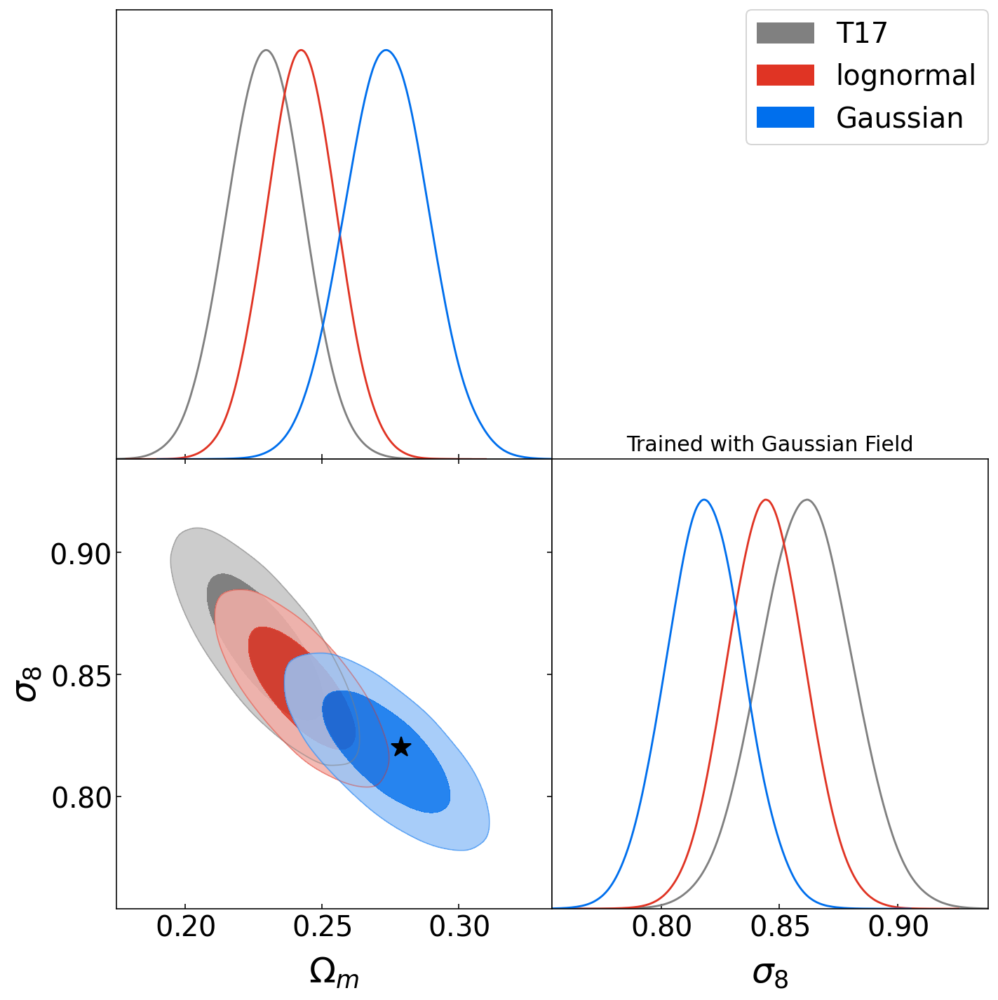

In [77]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 20
# Plot the triangle plot with all posterior distributions and priors

g.triangle_plot(all_samples_Gauss_11_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Trained with Gaussian Field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_11_KDE.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

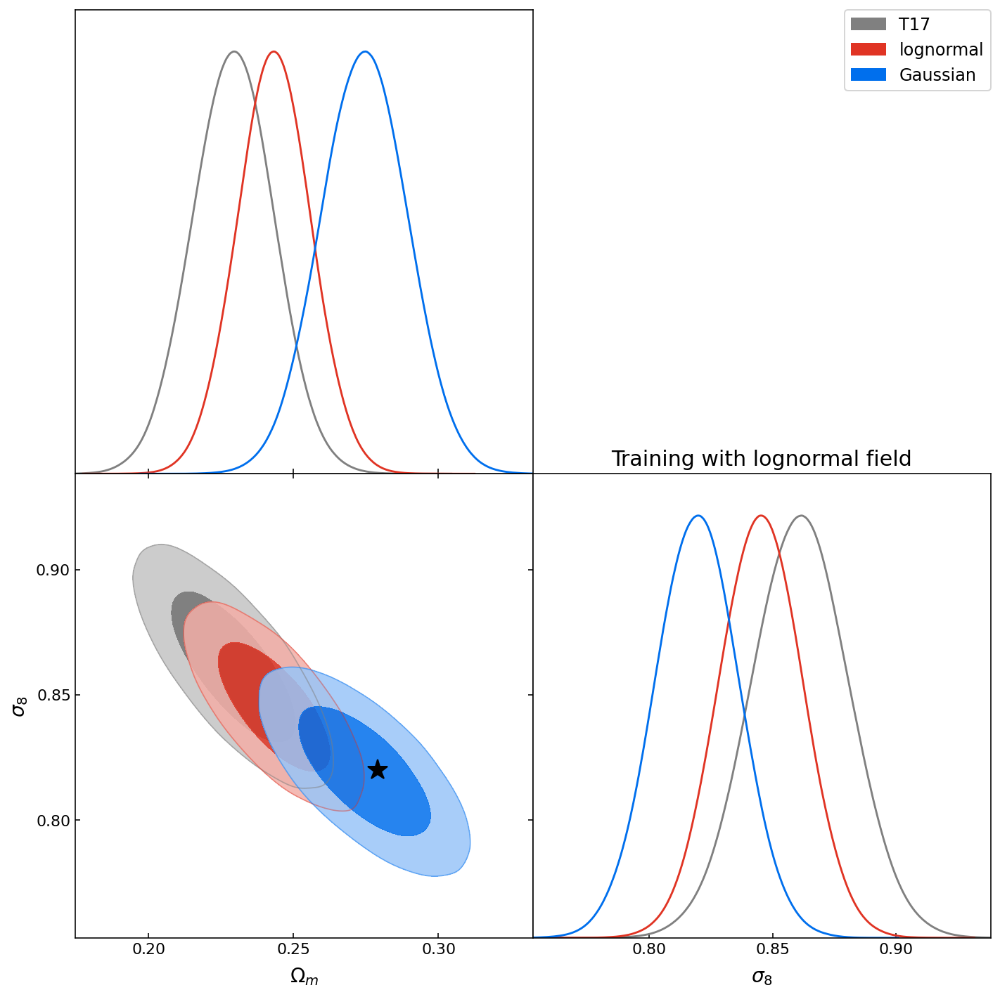

In [78]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)

# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_Gauss_21_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Training with lognormal field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_21_KDE.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

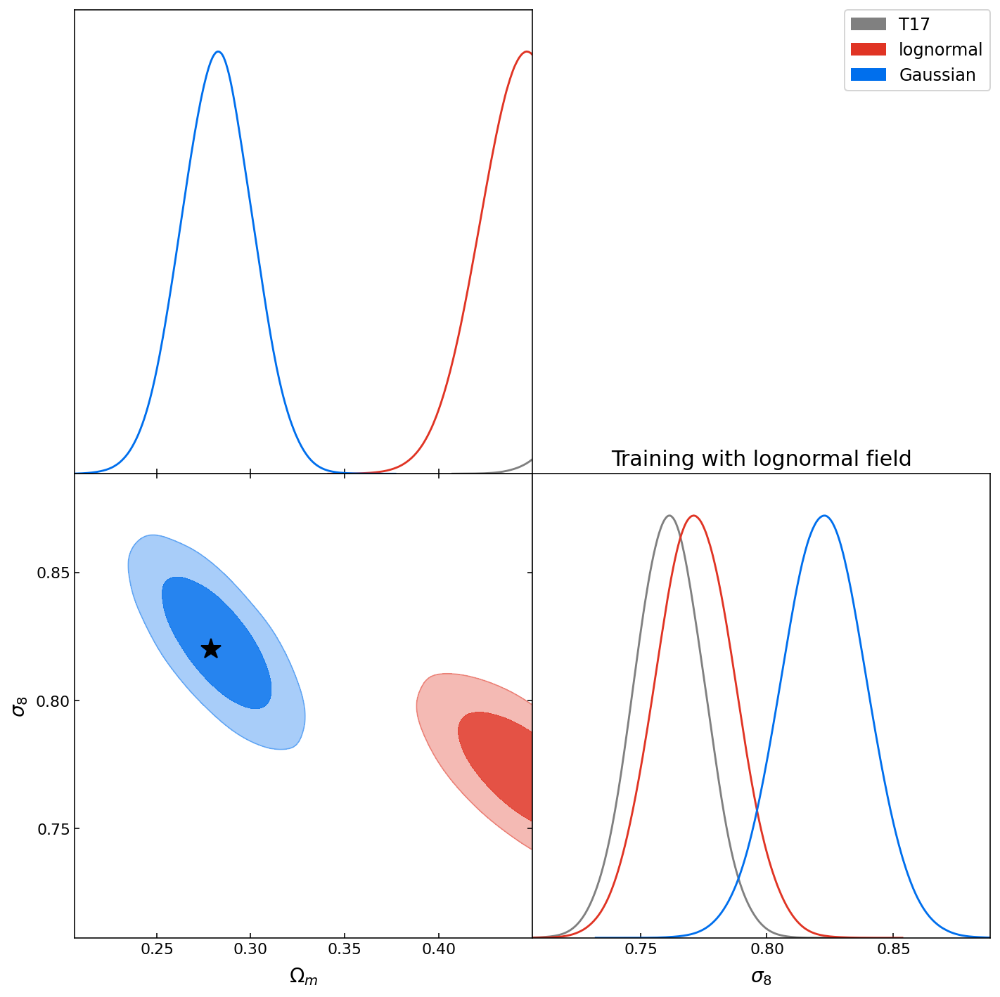

In [79]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)

# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_Gauss_12_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Training with lognormal field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_12_KDE.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

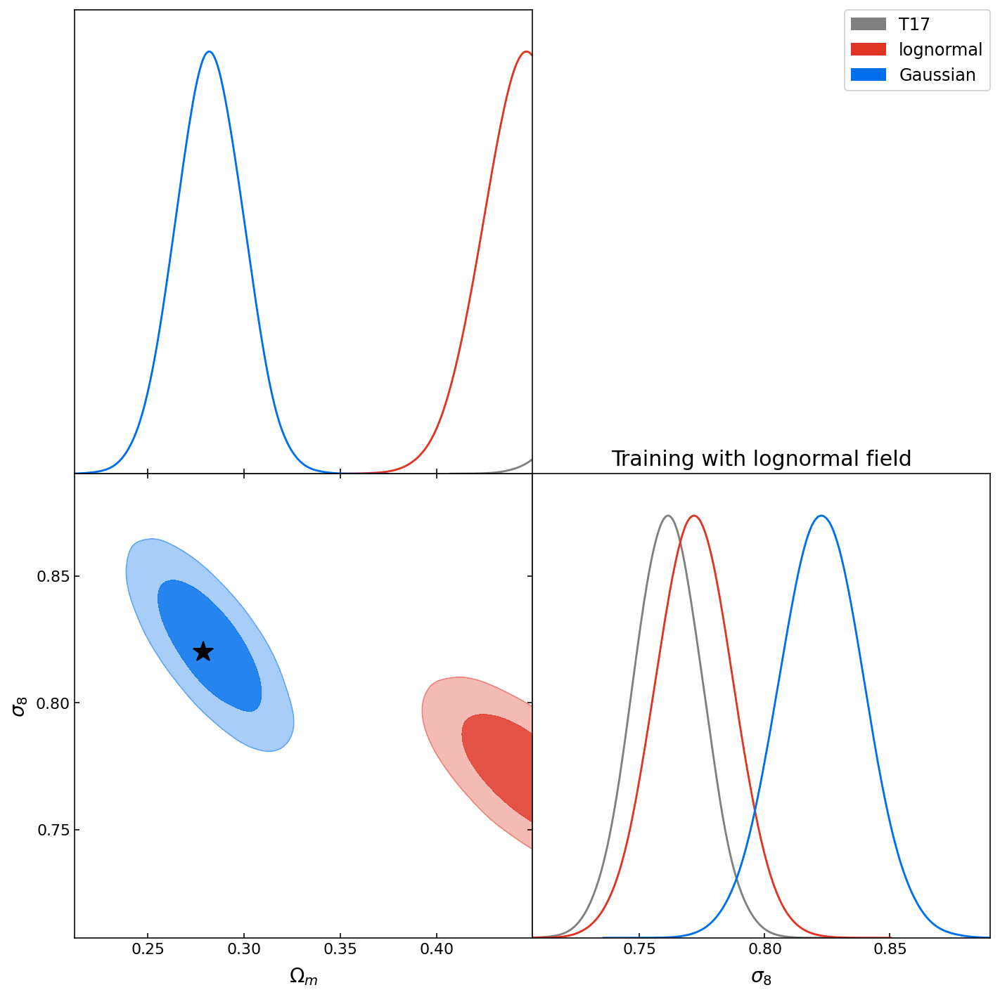

In [80]:
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)

# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_Gauss_22_KDE, filled=True, legend_labels=labels, legend_loc='upper right')
plt.title('Training with lognormal field',fontsize=15)
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_22_KDE.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

# Part 5. Plot Posterior Distribution

#### Erstmal organisiere, sonst verwirre ich später
#### $L=\begin{pmatrix} L_1 & 0\\ L_3 & L_2 \end{pmatrix}=\begin{pmatrix} e^{y_2} & 0\\ y_4 & e^{y_3} \end{pmatrix}$
####  $\Sigma=\begin{pmatrix} \sigma^2_1 & r\sigma_1\sigma_2 \\ r\sigma_1\sigma_2 & \sigma^2_2 \end{pmatrix}=\begin{pmatrix} L^2_1 & L_3L_1\\ L_3L_1 & L^2_2 \end{pmatrix}=\begin{pmatrix} e^{2y_2} & y_4e^{y_2}\\ y_4e^{y_2} & {y_4}^2+e^{2y_3} \end{pmatrix}$

In [81]:
y_2_T17_Gauss_1 = prediction_T17_Gauss_1[:,2]
y_3_T17_Gauss_1 = prediction_T17_Gauss_1[:,3]
y_4_T17_Gauss_1 = prediction_T17_Gauss_1[:,4]
y_2_T17_Gauss_2 = prediction_T17_Gauss_2[:,2]
y_3_T17_Gauss_2 = prediction_T17_Gauss_2[:,3]
y_4_T17_Gauss_2 = prediction_T17_Gauss_2[:,4]
parameter_est_T17_Gauss_1 = np.array((prediction_T17_Gauss_1[:,0],prediction_T17_Gauss_1[:,1])).T
parameter_est_T17_Gauss_2 = np.array((prediction_T17_Gauss_2[:,0],prediction_T17_Gauss_2[:,1])).T

y_2_Gauss_1_Gauss_1 = prediction_Gauss_1_Gauss_1[:,2]
y_3_Gauss_1_Gauss_1 = prediction_Gauss_1_Gauss_1[:,3]
y_4_Gauss_1_Gauss_1 = prediction_Gauss_1_Gauss_1[:,4]
y_2_Gauss_2_Gauss_1 = prediction_Gauss_2_Gauss_1[:,2]
y_3_Gauss_2_Gauss_1 = prediction_Gauss_2_Gauss_1[:,3]
y_4_Gauss_2_Gauss_1 = prediction_Gauss_2_Gauss_1[:,4]
y_2_Gauss_1_Gauss_2 = prediction_Gauss_1_Gauss_2[:,2]
y_3_Gauss_1_Gauss_2 = prediction_Gauss_1_Gauss_2[:,3]
y_4_Gauss_1_Gauss_2 = prediction_Gauss_1_Gauss_2[:,4]
y_2_Gauss_2_Gauss_2 = prediction_Gauss_2_Gauss_2[:,2]
y_3_Gauss_2_Gauss_2 = prediction_Gauss_2_Gauss_2[:,3]
y_4_Gauss_2_Gauss_2 = prediction_Gauss_2_Gauss_2[:,4]
parameter_est_Gauss_1_Gauss_1 = np.array((prediction_Gauss_1_Gauss_1[:,0],prediction_Gauss_1_Gauss_1[:,1])).T
parameter_est_Gauss_1_Gauss_2 = np.array((prediction_Gauss_1_Gauss_2[:,0],prediction_Gauss_1_Gauss_2[:,1])).T
parameter_est_Gauss_2_Gauss_1 = np.array((prediction_Gauss_2_Gauss_1[:,0],prediction_Gauss_2_Gauss_1[:,1])).T
parameter_est_Gauss_2_Gauss_2 = np.array((prediction_Gauss_2_Gauss_2[:,0],prediction_Gauss_2_Gauss_2[:,1])).T

y_2_lognormal_1_Gauss_1 = prediction_lognormal_1_Gauss_1[:,2]
y_3_lognormal_1_Gauss_1 = prediction_lognormal_1_Gauss_1[:,3]
y_4_lognormal_1_Gauss_1 = prediction_lognormal_1_Gauss_1[:,4]
y_2_lognormal_2_Gauss_1 = prediction_lognormal_2_Gauss_1[:,2]
y_3_lognormal_2_Gauss_1 = prediction_lognormal_2_Gauss_1[:,3]
y_4_lognormal_2_Gauss_1 = prediction_lognormal_2_Gauss_1[:,4]
y_2_lognormal_1_Gauss_2 = prediction_lognormal_1_Gauss_2[:,2]
y_3_lognormal_1_Gauss_2 = prediction_lognormal_1_Gauss_2[:,3]
y_4_lognormal_1_Gauss_2 = prediction_lognormal_1_Gauss_2[:,4]
y_2_lognormal_2_Gauss_2 = prediction_lognormal_2_Gauss_2[:,2]
y_3_lognormal_2_Gauss_2 = prediction_lognormal_2_Gauss_2[:,3]
y_4_lognormal_2_Gauss_2 = prediction_lognormal_2_Gauss_2[:,4]
parameter_est_lognormal_1_Gauss_1 = np.array((prediction_lognormal_1_Gauss_1[:,0],prediction_lognormal_1_Gauss_1[:,1])).T
parameter_est_lognormal_1_Gauss_2 = np.array((prediction_lognormal_1_Gauss_2[:,0],prediction_lognormal_1_Gauss_2[:,1])).T
parameter_est_lognormal_2_Gauss_1 = np.array((prediction_lognormal_2_Gauss_1[:,0],prediction_lognormal_2_Gauss_1[:,1])).T
parameter_est_lognormal_2_Gauss_2 = np.array((prediction_lognormal_2_Gauss_2[:,0],prediction_lognormal_2_Gauss_2[:,1])).T

y_2_T17_lognormal_1 = prediction_T17_lognormal_1[:,2]
y_3_T17_lognormal_1 = prediction_T17_lognormal_1[:,3]
y_4_T17_lognormal_1 = prediction_T17_lognormal_1[:,4]
y_2_T17_lognormal_2 = prediction_T17_lognormal_2[:,2]
y_3_T17_lognormal_2 = prediction_T17_lognormal_2[:,3]
y_4_T17_lognormal_2 = prediction_T17_lognormal_2[:,4]
parameter_est_T17_lognormal_1 = np.array((prediction_T17_lognormal_1[:,0],prediction_T17_lognormal_1[:,1])).T
parameter_est_T17_lognormal_2 = np.array((prediction_T17_lognormal_2[:,0],prediction_T17_lognormal_2[:,1])).T

y_2_Gauss_1_lognormal_1 = prediction_Gauss_1_lognormal_1[:,2]
y_3_Gauss_1_lognormal_1 = prediction_Gauss_1_lognormal_1[:,3]
y_4_Gauss_1_lognormal_1 = prediction_Gauss_1_lognormal_1[:,4]
y_2_Gauss_2_lognormal_1 = prediction_Gauss_2_lognormal_1[:,2]
y_3_Gauss_2_lognormal_1 = prediction_Gauss_2_lognormal_1[:,3]
y_4_Gauss_2_lognormal_1 = prediction_Gauss_2_lognormal_1[:,4]
y_2_Gauss_1_lognormal_2 = prediction_Gauss_1_lognormal_2[:,2]
y_3_Gauss_1_lognormal_2 = prediction_Gauss_1_lognormal_2[:,3]
y_4_Gauss_1_lognormal_2 = prediction_Gauss_1_lognormal_2[:,4]
y_2_Gauss_2_lognormal_2 = prediction_Gauss_2_lognormal_2[:,2]
y_3_Gauss_2_lognormal_2 = prediction_Gauss_2_lognormal_2[:,3]
y_4_Gauss_2_lognormal_2 = prediction_Gauss_2_lognormal_2[:,4]
parameter_est_Gauss_1_lognormal_1 = np.array((prediction_Gauss_1_lognormal_1[:,0],prediction_Gauss_1_lognormal_1[:,1])).T
parameter_est_Gauss_1_lognormal_2 = np.array((prediction_Gauss_1_lognormal_2[:,0],prediction_Gauss_1_lognormal_2[:,1])).T
parameter_est_Gauss_2_lognormal_1 = np.array((prediction_Gauss_2_lognormal_1[:,0],prediction_Gauss_2_lognormal_1[:,1])).T
parameter_est_Gauss_2_lognormal_2 = np.array((prediction_Gauss_2_lognormal_2[:,0],prediction_Gauss_2_lognormal_2[:,1])).T

y_2_lognormal_1_lognormal_1 = prediction_lognormal_1_lognormal_1[:,2]
y_3_lognormal_1_lognormal_1 = prediction_lognormal_1_lognormal_1[:,3]
y_4_lognormal_1_lognormal_1 = prediction_lognormal_1_lognormal_1[:,4]
y_2_lognormal_2_lognormal_1 = prediction_lognormal_2_lognormal_1[:,2]
y_3_lognormal_2_lognormal_1 = prediction_lognormal_2_lognormal_1[:,3]
y_4_lognormal_2_lognormal_1 = prediction_lognormal_2_lognormal_1[:,4]
y_2_lognormal_1_lognormal_2 = prediction_lognormal_1_lognormal_2[:,2]
y_3_lognormal_1_lognormal_2 = prediction_lognormal_1_lognormal_2[:,3]
y_4_lognormal_1_lognormal_2 = prediction_lognormal_1_lognormal_2[:,4]
y_2_lognormal_2_lognormal_2 = prediction_lognormal_2_lognormal_2[:,2]
y_3_lognormal_2_lognormal_2 = prediction_lognormal_2_lognormal_2[:,3]
y_4_lognormal_2_lognormal_2 = prediction_lognormal_2_lognormal_2[:,4]
parameter_est_lognormal_1_lognormal_1 = np.array((prediction_lognormal_1_lognormal_1[:,0],prediction_lognormal_1_lognormal_1[:,1])).T
parameter_est_lognormal_1_lognormal_2 = np.array((prediction_lognormal_1_lognormal_2[:,0],prediction_lognormal_1_lognormal_2[:,1])).T
parameter_est_lognormal_2_lognormal_1 = np.array((prediction_lognormal_2_lognormal_1[:,0],prediction_lognormal_2_lognormal_1[:,1])).T
parameter_est_lognormal_2_lognormal_2 = np.array((prediction_lognormal_2_lognormal_2[:,0],prediction_lognormal_2_lognormal_2[:,1])).T

In [82]:
def cov_parametric(y_2,y_3,y_4):
    sig1   = np.exp(2.*y_2)
    sig2   = np.exp(2.*y_3)+(y_4)**2
    r_sig  = y_4*np.exp(y_2)

    cov1       = np.array((sig1, r_sig))
    cov2       = np.array((r_sig, sig2))
    cov_output = np.array((cov1, cov2))
    return cov_output

In [83]:
def cov_parametric_2(y_2,y_3,y_4):
    y_2_mean = np.mean(y_2)
    y_3_mean = np.mean(y_3)
    y_4_mean = np.mean(y_4)
    sig1     = np.exp(2*y_2_mean)
    sig2     = np.exp(2*y_3_mean)+(y_4_mean)**2
    r_sig    = y_4_mean*np.exp(y_2_mean)

    cov1       = np.array((sig1, r_sig))
    cov2       = np.array((r_sig, sig2))
    cov_output = np.array((cov1, cov2))
    return cov_output

In [84]:
cov_para_T17_Gauss_1             = cov_parametric(y_2_T17_Gauss_1, y_3_T17_Gauss_1, y_4_T17_Gauss_1)
cov_para_T17_Gauss_2             = cov_parametric(y_2_T17_Gauss_2, y_3_T17_Gauss_1, y_4_T17_Gauss_2)

cov_para_Gauss_1_Gauss_1         = cov_parametric(y_2_Gauss_1_Gauss_1, y_3_Gauss_1_Gauss_1, y_4_Gauss_1_Gauss_1)
cov_para_Gauss_1_Gauss_2         = cov_parametric(y_2_Gauss_1_Gauss_2, y_3_Gauss_1_Gauss_2, y_4_Gauss_1_Gauss_2)
cov_para_Gauss_2_Gauss_1         = cov_parametric(y_2_Gauss_2_Gauss_1, y_3_Gauss_2_Gauss_1, y_4_Gauss_2_Gauss_1)
cov_para_Gauss_2_Gauss_2         = cov_parametric(y_2_Gauss_2_Gauss_2, y_3_Gauss_2_Gauss_2, y_4_Gauss_2_Gauss_2)

cov_para_lognormal_1_Gauss_1     = cov_parametric(y_2_lognormal_1_Gauss_1, y_3_lognormal_1_Gauss_1, y_4_lognormal_1_Gauss_1)
cov_para_lognormal_1_Gauss_2     = cov_parametric(y_2_lognormal_1_Gauss_2, y_3_lognormal_1_Gauss_2, y_4_lognormal_1_Gauss_2)
cov_para_lognormal_2_Gauss_1     = cov_parametric(y_2_lognormal_2_Gauss_1, y_3_lognormal_2_Gauss_1, y_4_lognormal_2_Gauss_1)
cov_para_lognormal_2_Gauss_2     = cov_parametric(y_2_lognormal_2_Gauss_2, y_3_lognormal_2_Gauss_2, y_4_lognormal_2_Gauss_2)

cov_para_T17_lognormal_1         = cov_parametric(y_2_T17_lognormal_1, y_3_T17_lognormal_1, y_4_T17_lognormal_1)
cov_para_T17_lognormal_2         = cov_parametric(y_2_T17_lognormal_2, y_3_T17_lognormal_2, y_4_T17_lognormal_2)

cov_para_Gauss_1_lognormal_1     = cov_parametric(y_2_Gauss_1_lognormal_1, y_3_Gauss_1_lognormal_1, y_4_Gauss_1_lognormal_1)
cov_para_Gauss_1_lognormal_2     = cov_parametric(y_2_Gauss_1_lognormal_2, y_3_Gauss_1_lognormal_2, y_4_Gauss_1_lognormal_2)
cov_para_Gauss_2_lognormal_1     = cov_parametric(y_2_Gauss_2_lognormal_1, y_3_Gauss_2_lognormal_1, y_4_Gauss_2_lognormal_1)
cov_para_Gauss_2_lognormal_2     = cov_parametric(y_2_Gauss_2_lognormal_2, y_3_Gauss_2_lognormal_2, y_4_Gauss_2_lognormal_2)

cov_para_lognormal_1_lognormal_1 = cov_parametric(y_2_lognormal_1_lognormal_1, y_3_lognormal_1_lognormal_1, y_4_lognormal_1_lognormal_1)
cov_para_lognormal_1_lognormal_2 = cov_parametric(y_2_lognormal_1_lognormal_2, y_3_lognormal_1_lognormal_2, y_4_lognormal_1_lognormal_2)
cov_para_lognormal_2_lognormal_1 = cov_parametric(y_2_lognormal_2_lognormal_1, y_3_lognormal_2_lognormal_1, y_4_lognormal_2_lognormal_1)
cov_para_lognormal_2_lognormal_2 = cov_parametric(y_2_lognormal_2_lognormal_2, y_3_lognormal_2_lognormal_2, y_4_lognormal_2_lognormal_2)

In [85]:
cov_2_para_T17_Gauss_1             = cov_parametric_2(y_2_T17_Gauss_1, y_3_T17_Gauss_1, y_4_T17_Gauss_1)
cov_2_para_T17_Gauss_2             = cov_parametric_2(y_2_T17_Gauss_2, y_3_T17_Gauss_1, y_4_T17_Gauss_2)

cov_2_para_Gauss_1_Gauss_1         = cov_parametric_2(y_2_Gauss_1_Gauss_1, y_3_Gauss_1_Gauss_1, y_4_Gauss_1_Gauss_1)
cov_2_para_Gauss_1_Gauss_2         = cov_parametric_2(y_2_Gauss_1_Gauss_2, y_3_Gauss_1_Gauss_2, y_4_Gauss_1_Gauss_2)
cov_2_para_Gauss_2_Gauss_1         = cov_parametric_2(y_2_Gauss_2_Gauss_1, y_3_Gauss_2_Gauss_1, y_4_Gauss_2_Gauss_1)
cov_2_para_Gauss_2_Gauss_2         = cov_parametric_2(y_2_Gauss_2_Gauss_2, y_3_Gauss_2_Gauss_2, y_4_Gauss_2_Gauss_2)

cov_2_para_lognormal_1_Gauss_1     = cov_parametric_2(y_2_lognormal_1_Gauss_1, y_3_lognormal_1_Gauss_1, y_4_lognormal_1_Gauss_1)
cov_2_para_lognormal_1_Gauss_2     = cov_parametric_2(y_2_lognormal_1_Gauss_2, y_3_lognormal_1_Gauss_2, y_4_lognormal_1_Gauss_2)
cov_2_para_lognormal_2_Gauss_1     = cov_parametric_2(y_2_lognormal_2_Gauss_1, y_3_lognormal_2_Gauss_1, y_4_lognormal_2_Gauss_1)
cov_2_para_lognormal_2_Gauss_2     = cov_parametric_2(y_2_lognormal_2_Gauss_2, y_3_lognormal_2_Gauss_2, y_4_lognormal_2_Gauss_2)

cov_2_para_T17_lognormal_1         = cov_parametric_2(y_2_T17_lognormal_1, y_3_T17_lognormal_1, y_4_T17_lognormal_1)
cov_2_para_T17_lognormal_2         = cov_parametric_2(y_2_T17_lognormal_2, y_3_T17_lognormal_2, y_4_T17_lognormal_2)

cov_2_para_Gauss_1_lognormal_1     = cov_parametric_2(y_2_Gauss_1_lognormal_1, y_3_Gauss_1_lognormal_1, y_4_Gauss_1_lognormal_1)
cov_2_para_Gauss_1_lognormal_2     = cov_parametric_2(y_2_Gauss_1_lognormal_2, y_3_Gauss_1_lognormal_2, y_4_Gauss_1_lognormal_2)
cov_2_para_Gauss_2_lognormal_1     = cov_parametric_2(y_2_Gauss_2_lognormal_1, y_3_Gauss_2_lognormal_1, y_4_Gauss_2_lognormal_1)
cov_2_para_Gauss_2_lognormal_2     = cov_parametric_2(y_2_Gauss_2_lognormal_2, y_3_Gauss_2_lognormal_2, y_4_Gauss_2_lognormal_2)

cov_2_para_lognormal_1_lognormal_1 = cov_parametric_2(y_2_lognormal_1_lognormal_1, y_3_lognormal_1_lognormal_1, y_4_lognormal_1_lognormal_1)
cov_2_para_lognormal_1_lognormal_2 = cov_parametric_2(y_2_lognormal_1_lognormal_2, y_3_lognormal_1_lognormal_2, y_4_lognormal_1_lognormal_2)
cov_2_para_lognormal_2_lognormal_1 = cov_parametric_2(y_2_lognormal_2_lognormal_1, y_3_lognormal_2_lognormal_1, y_4_lognormal_2_lognormal_1)
cov_2_para_lognormal_2_lognormal_2 = cov_parametric_2(y_2_lognormal_2_lognormal_2, y_3_lognormal_2_lognormal_2, y_4_lognormal_2_lognormal_2)

In [87]:
cov_T17_Gauss_1_mean             = np.mean(cov_para_T17_Gauss_1, axis=2)
cov_T17_Gauss_2_mean             = np.mean(cov_para_T17_Gauss_2, axis=2)
cov_T17_lognormal_1_mean         = np.mean(cov_para_T17_lognormal_1, axis=2)
cov_T17_lognormal_2_mean         = np.mean(cov_para_T17_lognormal_2, axis=2)
cov_lognormal_1_Gauss_1_mean     = np.mean(cov_para_lognormal_1_Gauss_1, axis=2)
cov_lognormal_1_Gauss_2_mean     = np.mean(cov_para_lognormal_1_Gauss_2, axis=2)
cov_lognormal_2_Gauss_1_mean     = np.mean(cov_para_lognormal_2_Gauss_1, axis=2)
cov_lognormal_2_Gauss_2_mean     = np.mean(cov_para_lognormal_2_Gauss_2, axis=2)
cov_lognormal_1_lognormal_1_mean = np.mean(cov_para_lognormal_1_lognormal_1, axis=2)
cov_lognormal_1_lognormal_2_mean = np.mean(cov_para_lognormal_1_lognormal_2, axis=2)
cov_lognormal_2_lognormal_1_mean = np.mean(cov_para_lognormal_2_lognormal_1, axis=2)
cov_lognormal_2_lognormal_2_mean = np.mean(cov_para_lognormal_2_lognormal_2, axis=2)
cov_Gauss_1_Gauss_1_mean         = np.mean(cov_para_Gauss_1_Gauss_1, axis=2)
cov_Gauss_1_Gauss_2_mean         = np.mean(cov_para_Gauss_1_Gauss_2, axis=2)
cov_Gauss_2_Gauss_1_mean         = np.mean(cov_para_Gauss_2_Gauss_1, axis=2)
cov_Gauss_2_Gauss_2_mean         = np.mean(cov_para_Gauss_2_Gauss_2, axis=2)
cov_Gauss_1_lognormal_1_mean     = np.mean(cov_para_Gauss_1_lognormal_1, axis=2)
cov_Gauss_1_lognormal_2_mean     = np.mean(cov_para_Gauss_1_lognormal_2, axis=2)
cov_Gauss_2_lognormal_1_mean     = np.mean(cov_para_Gauss_2_lognormal_1, axis=2)
cov_Gauss_2_lognormal_2_mean     = np.mean(cov_para_Gauss_2_lognormal_2, axis=2)

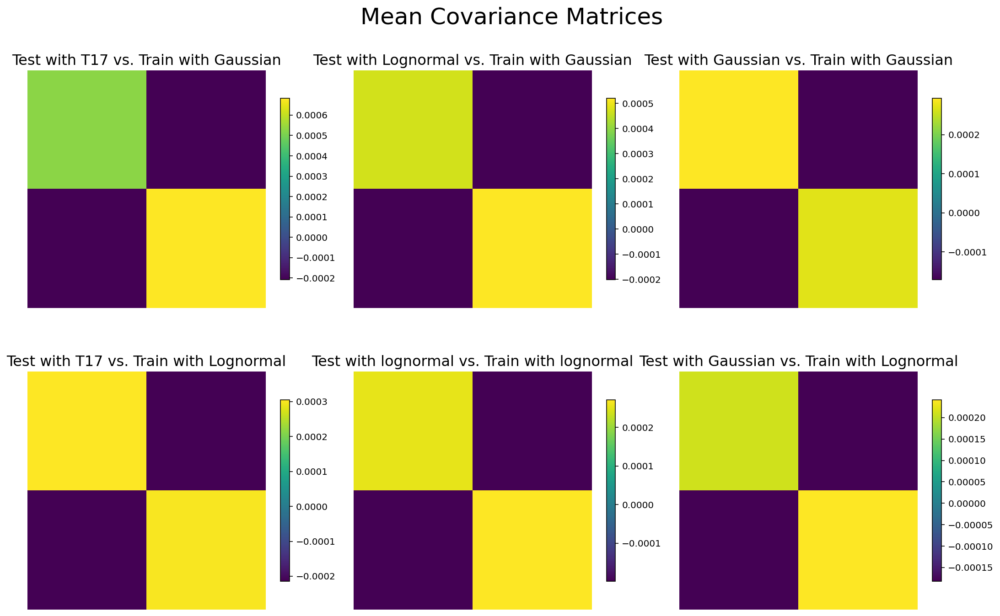

In [89]:
# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
plt.subplots_adjust(hspace=0.4)

# List of covariance matrices and their corresponding titles
cov_matrices_11 = [
    cov_T17_Gauss_1_mean, cov_lognormal_1_Gauss_1_mean, cov_Gauss_1_Gauss_1_mean
    , cov_T17_lognormal_1_mean, cov_lognormal_1_lognormal_1_mean, cov_Gauss_1_lognormal_1_mean
]
titles = [
    'Test with T17 vs. Train with Gaussian', 'Test with Lognormal vs. Train with Gaussian',
    'Test with Gaussian vs. Train with Gaussian', 'Test with T17 vs. Train with Lognormal',
    'Test with lognormal vs. Train with lognormal', 'Test with Gaussian vs. Train with Lognormal'
]

# Loop through subplots and plot each covariance matrix
for ax, cov_matrix, title in zip(axes.flatten(), cov_matrices_11, titles):
    im = ax.imshow(cov_matrix, cmap='viridis')
    ax.set_title(title, fontsize=16)
    ax.axis('off')
    fig.colorbar(im, ax=ax, shrink=0.6)

# Add a title and display the plot
fig.suptitle('Mean Covariance Matrices', fontsize=25)
plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/covs_11.png',bbox_inches='tight')
plt.show()

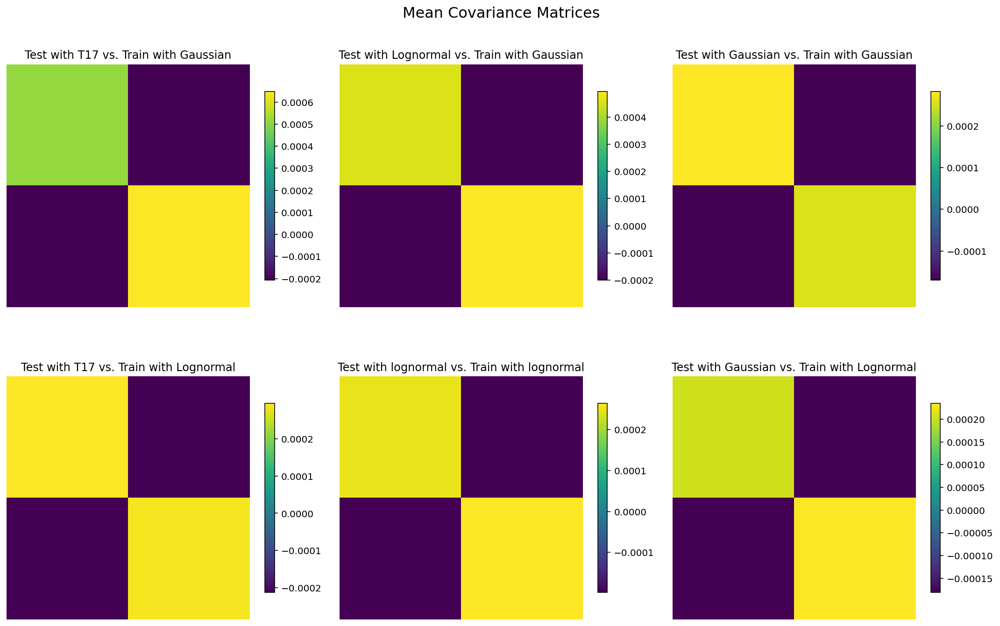

In [90]:
# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
plt.subplots_adjust(hspace=0.4)

# List of covariance matrices and their corresponding titles
cov_matrices_11 = [
    cov_2_para_T17_Gauss_1, cov_2_para_lognormal_1_Gauss_1, cov_2_para_Gauss_1_Gauss_1
    , cov_2_para_T17_lognormal_1, cov_2_para_lognormal_1_lognormal_1, cov_2_para_Gauss_1_lognormal_1
]
titles = [
    'Test with T17 vs. Train with Gaussian', 'Test with Lognormal vs. Train with Gaussian',
    'Test with Gaussian vs. Train with Gaussian', 'Test with T17 vs. Train with Lognormal',
    'Test with lognormal vs. Train with lognormal', 'Test with Gaussian vs. Train with Lognormal'
]

# Loop through subplots and plot each covariance matrix
for ax, cov_matrix, title in zip(axes.flatten(), cov_matrices_11, titles):
    im = ax.imshow(cov_matrix, cmap='viridis')
    ax.set_title(title)
    ax.axis('off')
    fig.colorbar(im, ax=ax, shrink=0.6)

# Add a title and display the plot
fig.suptitle('Mean Covariance Matrices', fontsize=16)
plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/covs_11.png',bbox_inches='tight')
plt.show()

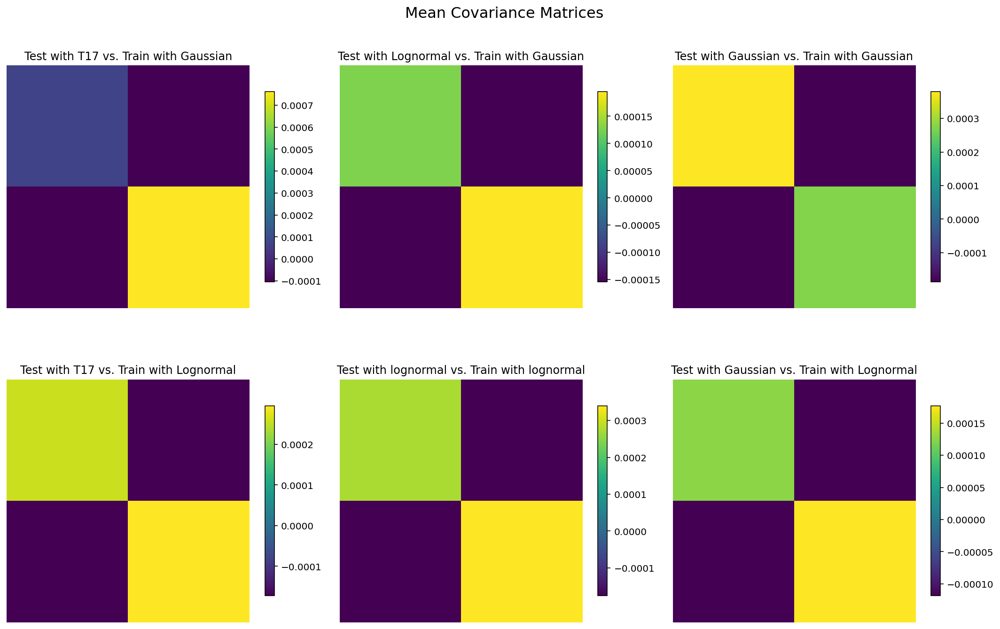

In [91]:
# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
plt.subplots_adjust(hspace=0.4)

# List of covariance matrices and their corresponding titles
cov_matrices_22 = [
    cov_T17_Gauss_2_mean, cov_lognormal_2_Gauss_2_mean, cov_Gauss_2_Gauss_2_mean
    , cov_T17_lognormal_2_mean, cov_lognormal_2_lognormal_2_mean, cov_Gauss_2_lognormal_2_mean
]
titles = [
    'Test with T17 vs. Train with Gaussian', 'Test with Lognormal vs. Train with Gaussian',
    'Test with Gaussian vs. Train with Gaussian', 'Test with T17 vs. Train with Lognormal',
    'Test with lognormal vs. Train with lognormal', 'Test with Gaussian vs. Train with Lognormal'
]

# Loop through subplots and plot each covariance matrix
for ax, cov_matrix, title in zip(axes.flatten(), cov_matrices_22, titles):
    im = ax.imshow(cov_matrix, cmap='viridis')
    ax.set_title(title)
    ax.axis('off')
    fig.colorbar(im, ax=ax, shrink=0.6)

# Add a title and display the plot
fig.suptitle('Mean Covariance Matrices', fontsize=16)
plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/covs_22.png',bbox_inches='tight')
plt.show()

In [92]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_2_T17_Gauss_1                   = np.random.multivariate_normal(mu_T17_Gauss_1, cov_2_para_T17_Gauss_1, size=nsamp)
samples_2_T17_Gauss_2                   = np.random.multivariate_normal(mu_T17_Gauss_2, cov_2_para_T17_Gauss_2, size=nsamp)
samples_2_Gauss_1_Gauss_1               = np.random.multivariate_normal(mu_Gauss_1_Gauss_1, cov_2_para_Gauss_1_Gauss_1, size=nsamp)
samples_2_Gauss_1_Gauss_2               = np.random.multivariate_normal(mu_Gauss_1_Gauss_2, cov_2_para_Gauss_1_Gauss_2, size=nsamp)
samples_2_Gauss_2_Gauss_1               = np.random.multivariate_normal(mu_Gauss_2_Gauss_1, cov_2_para_Gauss_2_Gauss_1, size=nsamp)
samples_2_Gauss_2_Gauss_2               = np.random.multivariate_normal(mu_Gauss_2_Gauss_2, cov_2_para_Gauss_2_Gauss_2, size=nsamp)
samples_2_lognormal_1_Gauss_1           = np.random.multivariate_normal(mu_lognormal_1_Gauss_1, cov_2_para_lognormal_1_Gauss_1, size=nsamp)
samples_2_lognormal_1_Gauss_2           = np.random.multivariate_normal(mu_lognormal_1_Gauss_2, cov_2_para_lognormal_1_Gauss_2, size=nsamp)
samples_2_lognormal_2_Gauss_1           = np.random.multivariate_normal(mu_lognormal_2_Gauss_1, cov_2_para_lognormal_2_Gauss_1, size=nsamp)
samples_2_lognormal_2_Gauss_2           = np.random.multivariate_normal(mu_lognormal_2_Gauss_2, cov_2_para_lognormal_2_Gauss_2, size=nsamp)
samples_2_T17_Gauss_1_mcsamples         = MCSamples(samples=samples_2_T17_Gauss_1, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_2_T17_Gauss_2_mcsamples         = MCSamples(samples=samples_2_T17_Gauss_2, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_2_lognormal_1_Gauss_1_mcsamples = MCSamples(samples=samples_2_lognormal_1_Gauss_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_lognormal_1_Gauss_2_mcsamples = MCSamples(samples=samples_2_lognormal_1_Gauss_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_lognormal_2_Gauss_1_mcsamples = MCSamples(samples=samples_2_lognormal_2_Gauss_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_lognormal_2_Gauss_2_mcsamples = MCSamples(samples=samples_2_lognormal_2_Gauss_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_Gauss_1_Gauss_1_mcsamples     = MCSamples(samples=samples_2_Gauss_1_Gauss_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_2_Gauss_1_Gauss_2_mcsamples     = MCSamples(samples=samples_2_Gauss_1_Gauss_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_2_Gauss_2_Gauss_1_mcsamples     = MCSamples(samples=samples_2_Gauss_2_Gauss_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_2_Gauss_2_Gauss_2_mcsamples     = MCSamples(samples=samples_2_Gauss_2_Gauss_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_2_Gauss_11 = [samples_2_T17_Gauss_1_mcsamples, samples_2_lognormal_1_Gauss_1_mcsamples, samples_2_Gauss_1_Gauss_1_mcsamples]
all_samples_2_Gauss_12 = [samples_2_lognormal_1_Gauss_2_mcsamples, samples_2_Gauss_1_Gauss_2_mcsamples]
all_samples_2_Gauss_21 = [samples_2_T17_Gauss_1_mcsamples, samples_2_lognormal_2_Gauss_1_mcsamples, samples_2_Gauss_2_Gauss_1_mcsamples]
all_samples_2_Gauss_22 = [samples_2_lognormal_2_Gauss_2_mcsamples, samples_2_Gauss_2_Gauss_2_mcsamples]
labels = ['T17', 'lognormal', 'Gauß']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


In [94]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_T17_Gauss_1                   = np.random.multivariate_normal(mu_T17_Gauss_1, cov_T17_Gauss_1_mean, size=nsamp)
samples_T17_Gauss_2                   = np.random.multivariate_normal(mu_T17_Gauss_2, cov_T17_Gauss_2_mean, size=nsamp)
samples_Gauss_1_Gauss_1               = np.random.multivariate_normal(mu_Gauss_1_Gauss_1, cov_Gauss_1_Gauss_1_mean, size=nsamp)
samples_Gauss_1_Gauss_2               = np.random.multivariate_normal(mu_Gauss_1_Gauss_2, cov_Gauss_1_Gauss_2_mean, size=nsamp)
samples_Gauss_2_Gauss_1               = np.random.multivariate_normal(mu_Gauss_2_Gauss_1, cov_Gauss_2_Gauss_1_mean, size=nsamp)
samples_Gauss_2_Gauss_2               = np.random.multivariate_normal(mu_Gauss_2_Gauss_2, cov_Gauss_2_Gauss_2_mean, size=nsamp)
samples_lognormal_1_Gauss_1           = np.random.multivariate_normal(mu_lognormal_1_Gauss_1, cov_lognormal_1_Gauss_1_mean, size=nsamp)
samples_lognormal_1_Gauss_2           = np.random.multivariate_normal(mu_lognormal_1_Gauss_2, cov_lognormal_1_Gauss_2_mean, size=nsamp)
samples_lognormal_2_Gauss_1           = np.random.multivariate_normal(mu_lognormal_2_Gauss_1, cov_lognormal_2_Gauss_1_mean, size=nsamp)
samples_lognormal_2_Gauss_2           = np.random.multivariate_normal(mu_lognormal_2_Gauss_2, cov_lognormal_2_Gauss_2_mean, size=nsamp)
samples_T17_Gauss_1_mcsamples         = MCSamples(samples=samples_T17_Gauss_1, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_T17_Gauss_2_mcsamples         = MCSamples(samples=samples_T17_Gauss_2, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_lognormal_1_Gauss_1_mcsamples = MCSamples(samples=samples_lognormal_1_Gauss_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_1_Gauss_2_mcsamples = MCSamples(samples=samples_lognormal_1_Gauss_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_Gauss_1_mcsamples = MCSamples(samples=samples_lognormal_2_Gauss_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_Gauss_2_mcsamples = MCSamples(samples=samples_lognormal_2_Gauss_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_Gauss_1_Gauss_1_mcsamples     = MCSamples(samples=samples_Gauss_1_Gauss_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_1_Gauss_2_mcsamples     = MCSamples(samples=samples_Gauss_1_Gauss_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_Gauss_1_mcsamples     = MCSamples(samples=samples_Gauss_2_Gauss_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_Gauss_2_mcsamples     = MCSamples(samples=samples_Gauss_2_Gauss_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_Gauss_11 = [samples_T17_Gauss_1_mcsamples, samples_lognormal_1_Gauss_1_mcsamples, samples_Gauss_1_Gauss_1_mcsamples]
all_samples_Gauss_12 = [ samples_lognormal_1_Gauss_2_mcsamples, samples_Gauss_1_Gauss_2_mcsamples]
all_samples_Gauss_21 = [samples_T17_Gauss_1_mcsamples, samples_lognormal_2_Gauss_1_mcsamples, samples_Gauss_2_Gauss_1_mcsamples]
all_samples_Gauss_22 = [ samples_lognormal_2_Gauss_2_mcsamples, samples_Gauss_2_Gauss_2_mcsamples]
labels = ['T17', 'lognormal', 'Gaussian']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


In [95]:
samples_test= [samples_Gauss_1_Gauss_1_mcsamples,samples_2_Gauss_1_Gauss_1_mcsamples]
Labels_Test = ['Mean Covariance','Mean Outputs']

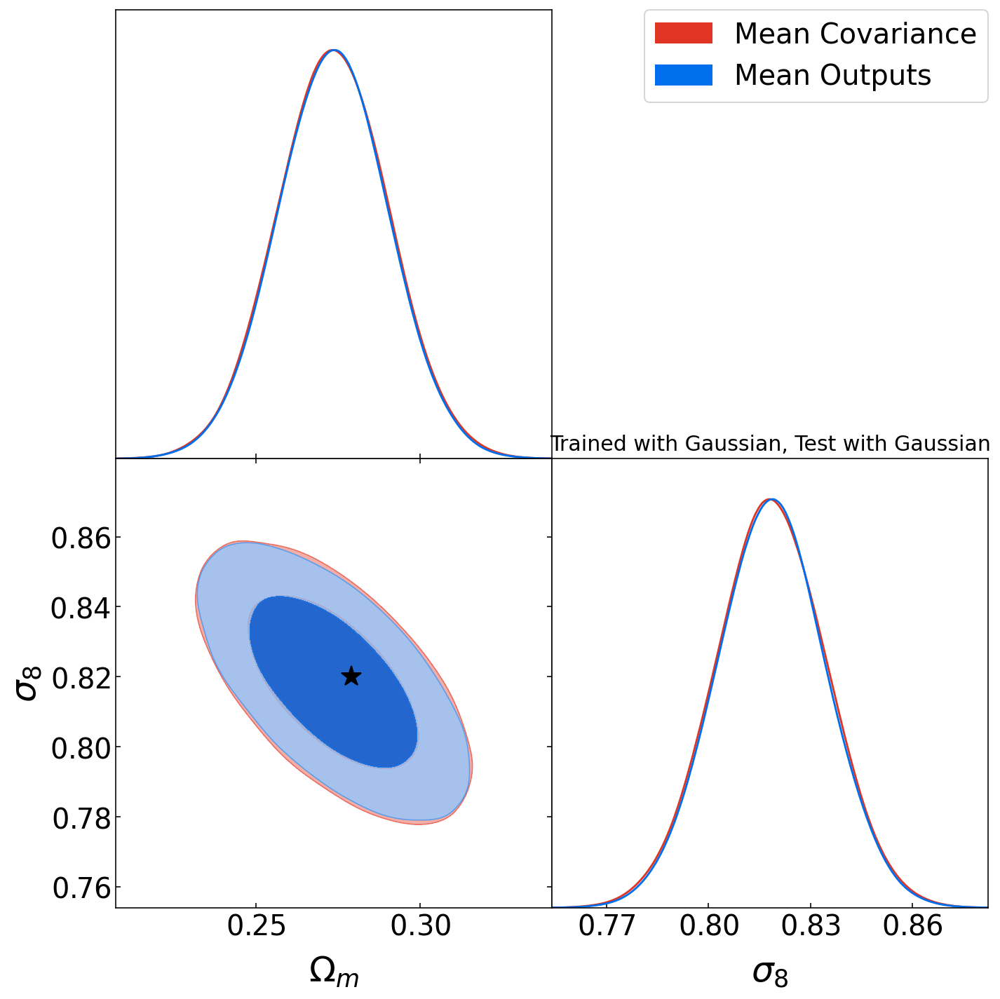

In [96]:
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 20
g.triangle_plot(samples_test, filled=True, legend_labels=Labels_Test, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
#legend =g.legend(fontsize=15)
plt.title('Trained with Gaussian, Test with Gaussian',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Test.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

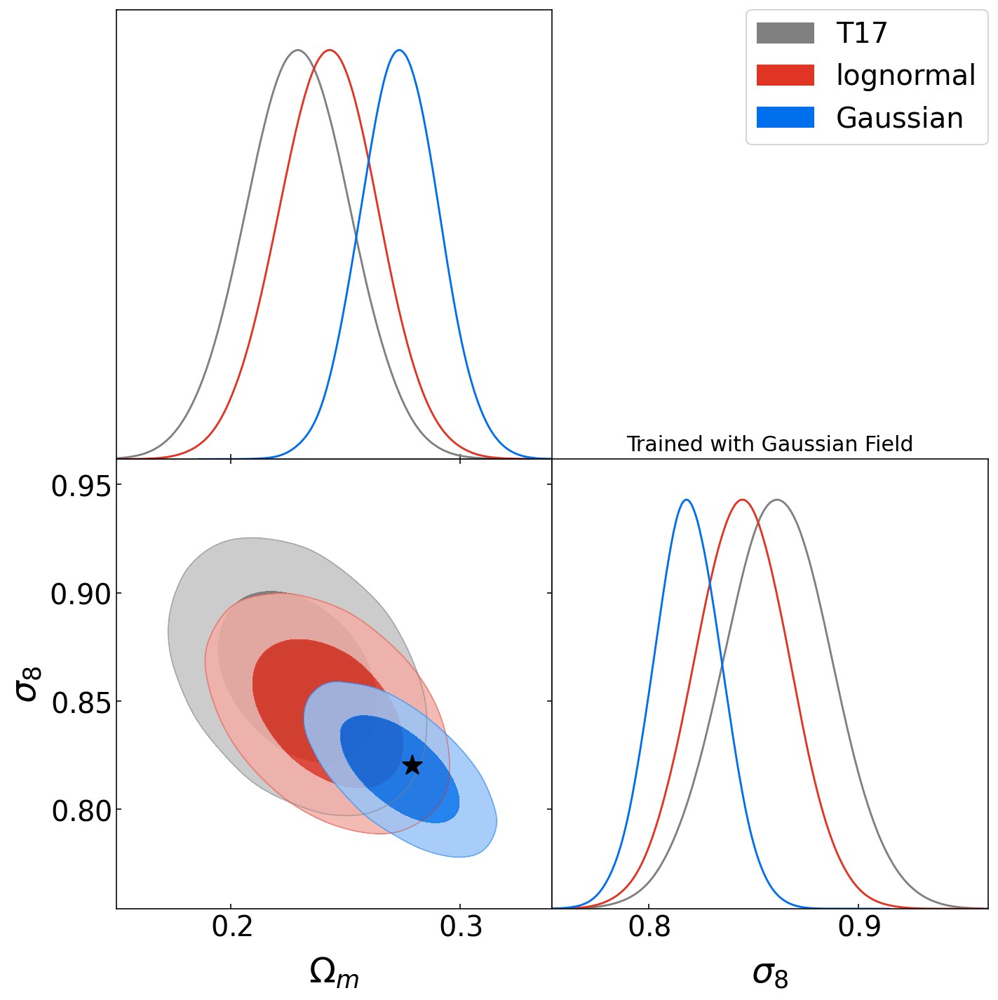

In [97]:
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 20
g.triangle_plot(all_samples_Gauss_11, filled=True, legend_labels=labels, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Gaussian Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_11.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

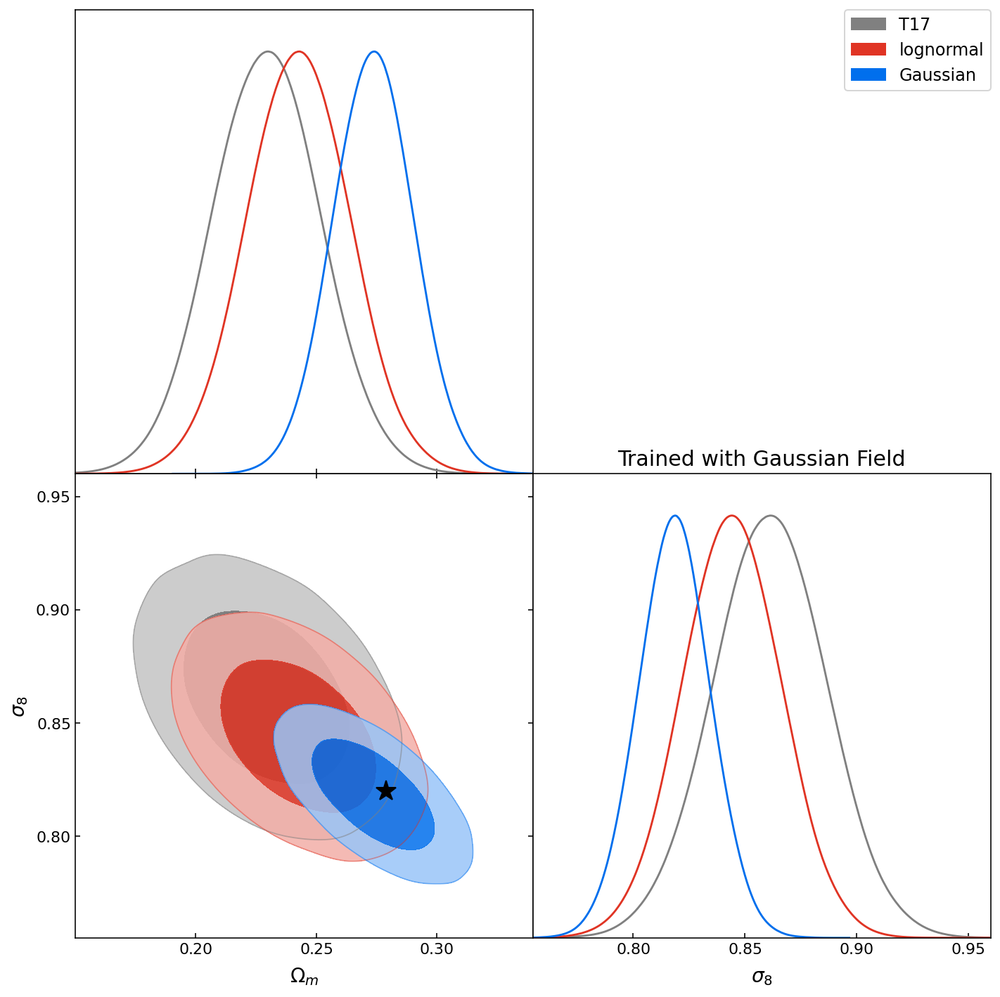

In [98]:
g = plots.get_subplot_plotter(width_inch=10)
g.triangle_plot(all_samples_2_Gauss_11, filled=True, legend_labels=labels, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Gaussian Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_2_Gauss_11.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

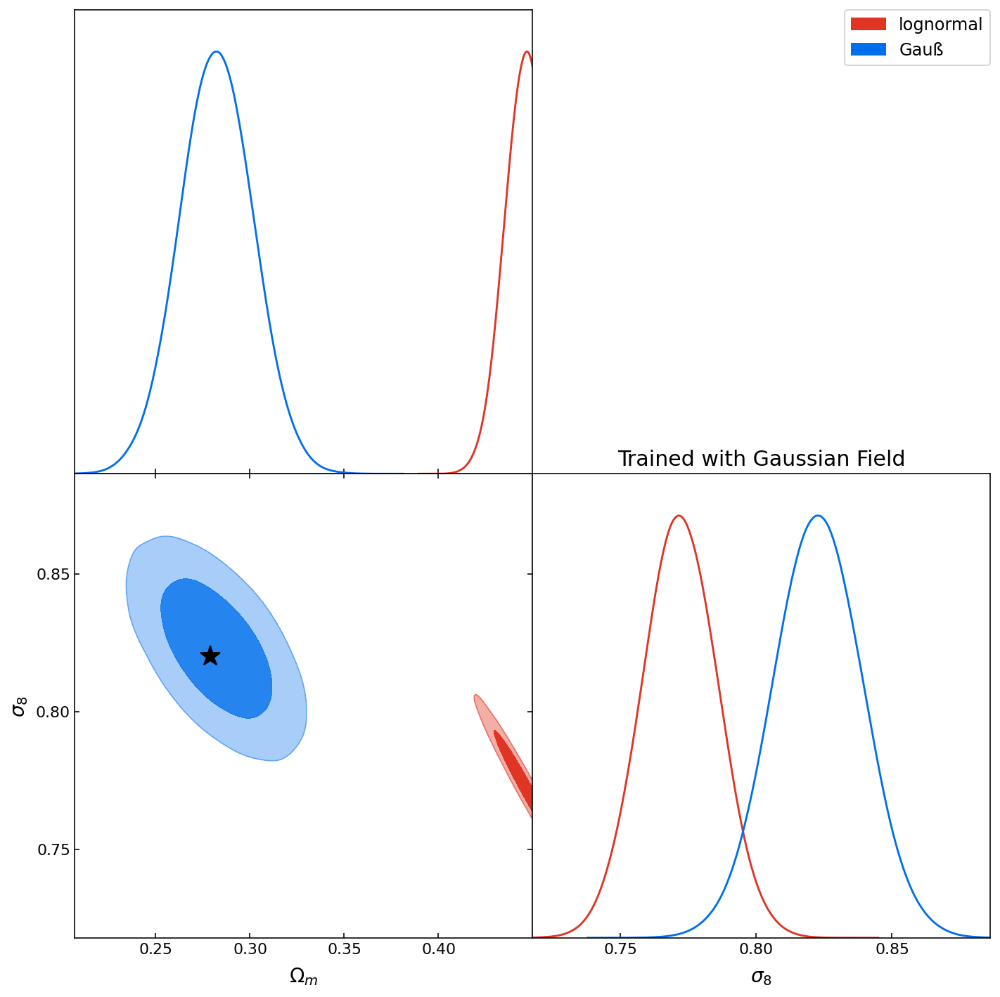

In [99]:
all_samples_Gauss_22 = [samples_lognormal_2_Gauss_2_mcsamples, samples_Gauss_2_Gauss_2_mcsamples]
labels_Gauss_22 = ['lognormal', 'Gauß']
g = plots.get_subplot_plotter(width_inch=10)
g.triangle_plot(all_samples_Gauss_22, filled=True, legend_labels=labels_Gauss_22, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Gaussian Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_22.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

#### That is better than previous, I think lognormal model 1 learned more Gaussian information and lognormal 2 learned more non-Gaussian information.

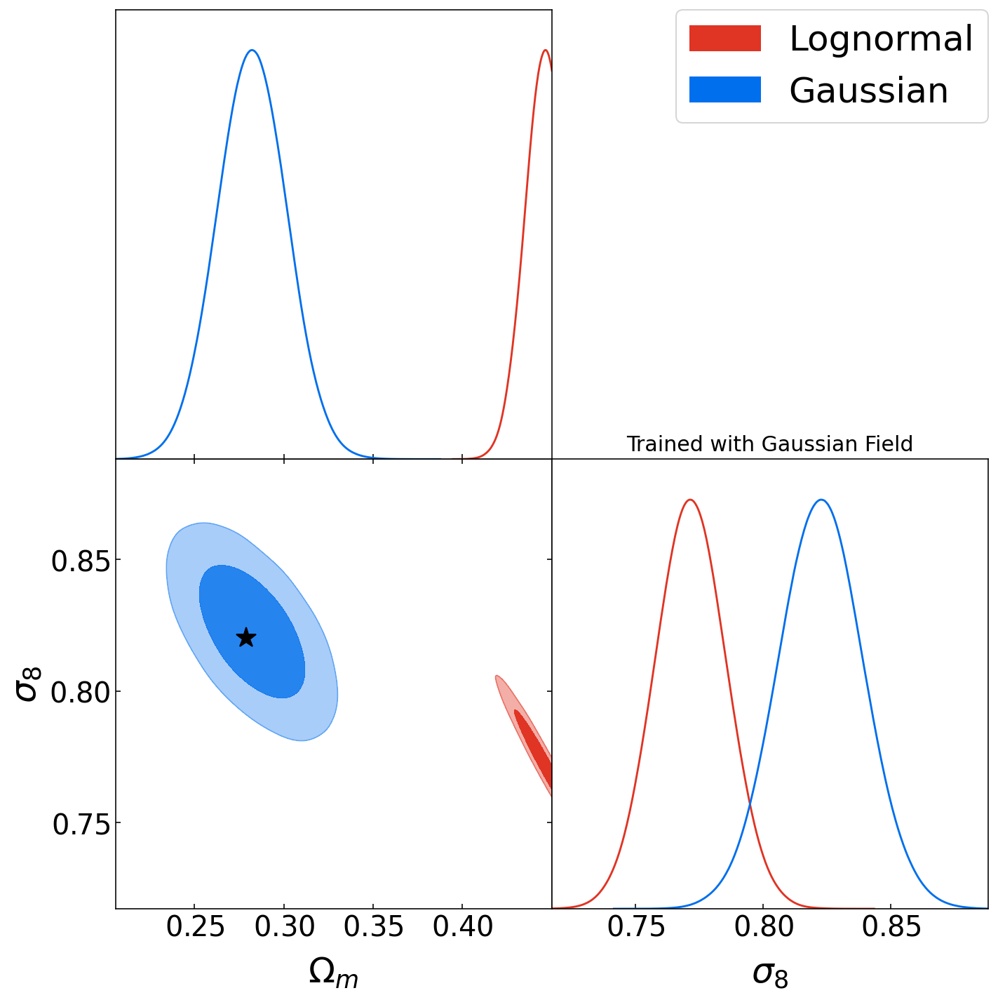

In [100]:
all_samples_Gauss_12 = [samples_lognormal_1_Gauss_2_mcsamples, samples_Gauss_1_Gauss_2_mcsamples]
labels_Gauss_12 = ['Lognormal', 'Gaussian']
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 25
g.triangle_plot(all_samples_Gauss_12, filled=True, legend_labels=labels_Gauss_12, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Gaussian Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_12.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [104]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_T17_lognormal_1_KDE                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_T17_lognormal_1_KDE, size=nsamp)
samples_T17_lognormal_2_KDE                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_T17_lognormal_2_KDE, size=nsamp)
samples_Gauss_1_lognormal_1_KDE               = np.random.multivariate_normal(mu_Gauss_1_lognormal_1, cov_Gauss_1_lognormal_1_KDE, size=nsamp)
samples_Gauss_1_lognormal_2_KDE               = np.random.multivariate_normal(mu_Gauss_1_lognormal_2, cov_Gauss_1_lognormal_2_KDE, size=nsamp)
samples_Gauss_2_lognormal_1_KDE               = np.random.multivariate_normal(mu_Gauss_2_lognormal_1, cov_Gauss_2_lognormal_1_KDE, size=nsamp)
samples_Gauss_2_lognormal_2_KDE               = np.random.multivariate_normal(mu_Gauss_2_lognormal_2, cov_Gauss_2_lognormal_2_KDE, size=nsamp)
samples_lognormal_1_lognormal_1_KDE           = np.random.multivariate_normal(mu_lognormal_1_lognormal_1, cov_lognormal_1_lognormal_1_KDE, size=nsamp)
samples_lognormal_1_lognormal_2_KDE           = np.random.multivariate_normal(mu_lognormal_1_lognormal_2, cov_lognormal_1_lognormal_2_KDE, size=nsamp)
samples_lognormal_2_lognormal_1_KDE           = np.random.multivariate_normal(mu_lognormal_2_lognormal_1, cov_lognormal_2_lognormal_1_KDE, size=nsamp)
samples_lognormal_2_lognormal_2_KDE           = np.random.multivariate_normal(mu_lognormal_2_lognormal_2, cov_lognormal_2_lognormal_2_KDE, size=nsamp)
samples_T17_lognormal_1_mcsamples_KDE         = MCSamples(samples=samples_T17_lognormal_1_KDE, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_T17_lognormal_2_mcsamples_KDE         = MCSamples(samples=samples_T17_lognormal_2_KDE, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_1_mcsamples_KDE = MCSamples(samples=samples_lognormal_1_lognormal_1_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_2_mcsamples_KDE = MCSamples(samples=samples_lognormal_1_lognormal_2_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_1_mcsamples_KDE = MCSamples(samples=samples_lognormal_2_lognormal_1_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_2_mcsamples_KDE = MCSamples(samples=samples_lognormal_2_lognormal_2_KDE, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_1_mcsamples_KDE     = MCSamples(samples=samples_Gauss_1_lognormal_1_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_2_mcsamples_KDE     = MCSamples(samples=samples_Gauss_1_lognormal_2_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_1_mcsamples_KDE     = MCSamples(samples=samples_Gauss_2_lognormal_1_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_2_mcsamples_KDE     = MCSamples(samples=samples_Gauss_2_lognormal_2_KDE, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_lognormal_11_KDE = [samples_T17_lognormal_1_mcsamples_KDE, samples_lognormal_1_lognormal_1_mcsamples_KDE, samples_Gauss_1_lognormal_1_mcsamples_KDE]
all_samples_lognormal_12_KDE = [samples_T17_lognormal_2_mcsamples_KDE, samples_lognormal_1_lognormal_2_mcsamples_KDE, samples_Gauss_1_lognormal_2_mcsamples_KDE]
all_samples_lognormal_21_KDE = [samples_T17_lognormal_1_mcsamples_KDE, samples_lognormal_2_lognormal_1_mcsamples_KDE, samples_Gauss_2_lognormal_1_mcsamples_KDE]
all_samples_lognormal_22_KDE = [samples_T17_lognormal_2_mcsamples_KDE, samples_lognormal_2_lognormal_2_mcsamples_KDE, samples_Gauss_2_lognormal_2_mcsamples_KDE]
labels = ['T17', 'lognormal', 'Gauß']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


In [106]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_T17_lognormal_1                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_T17_lognormal_1_mean, size=nsamp)
samples_T17_lognormal_2                   = np.random.multivariate_normal(mu_T17_lognormal_2, cov_T17_lognormal_2_mean, size=nsamp)
samples_Gauss_1_lognormal_1               = np.random.multivariate_normal(mu_Gauss_1_lognormal_1, cov_Gauss_1_lognormal_1_mean, size=nsamp)
samples_Gauss_1_lognormal_2               = np.random.multivariate_normal(mu_Gauss_1_lognormal_2, cov_Gauss_1_lognormal_2_mean, size=nsamp)
samples_Gauss_2_lognormal_1               = np.random.multivariate_normal(mu_Gauss_2_lognormal_1, cov_Gauss_2_lognormal_1_mean, size=nsamp)
samples_Gauss_2_lognormal_2               = np.random.multivariate_normal(mu_Gauss_2_lognormal_2, cov_Gauss_2_lognormal_2_mean, size=nsamp)
samples_lognormal_1_lognormal_1           = np.random.multivariate_normal(mu_lognormal_1_lognormal_1, cov_lognormal_1_lognormal_1_mean, size=nsamp)
samples_lognormal_1_lognormal_2           = np.random.multivariate_normal(mu_lognormal_1_lognormal_2, cov_lognormal_1_lognormal_2_mean, size=nsamp)
samples_lognormal_2_lognormal_1           = np.random.multivariate_normal(mu_lognormal_2_lognormal_1, cov_lognormal_2_lognormal_1_mean, size=nsamp)
samples_lognormal_2_lognormal_2           = np.random.multivariate_normal(mu_lognormal_2_lognormal_2, cov_lognormal_2_lognormal_2_mean, size=nsamp)
samples_T17_lognormal_1_mcsamples         = MCSamples(samples=samples_T17_lognormal_1, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_T17_lognormal_2_mcsamples         = MCSamples(samples=samples_T17_lognormal_2, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_1_mcsamples = MCSamples(samples=samples_lognormal_1_lognormal_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_2_mcsamples = MCSamples(samples=samples_lognormal_1_lognormal_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_1_mcsamples = MCSamples(samples=samples_lognormal_2_lognormal_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_2_mcsamples = MCSamples(samples=samples_lognormal_2_lognormal_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_1_mcsamples     = MCSamples(samples=samples_Gauss_1_lognormal_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_2_mcsamples     = MCSamples(samples=samples_Gauss_1_lognormal_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_1_mcsamples     = MCSamples(samples=samples_Gauss_2_lognormal_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_2_mcsamples     = MCSamples(samples=samples_Gauss_2_lognormal_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_lognormal_11 = [samples_T17_lognormal_1_mcsamples, samples_lognormal_1_lognormal_1_mcsamples, samples_Gauss_1_lognormal_1_mcsamples]
all_samples_lognormal_12 = [samples_T17_lognormal_1_mcsamples, samples_lognormal_1_lognormal_2_mcsamples, samples_Gauss_1_lognormal_2_mcsamples]
all_samples_lognormal_21 = [samples_T17_lognormal_2_mcsamples, samples_lognormal_2_lognormal_1_mcsamples, samples_Gauss_2_lognormal_1_mcsamples]
all_samples_lognormal_22 = [samples_T17_lognormal_2_mcsamples, samples_lognormal_2_lognormal_2_mcsamples, samples_Gauss_2_lognormal_2_mcsamples]
labels = ['T17', 'lognormal', 'Gauß']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


In [107]:
all_samples_Gauss_temp= [samples_lognormal_1_lognormal_1_mcsamples, samples_lognormal_1_lognormal_1_mcsamples_KDE]
labels= labels = ['Normal', 'KDE']

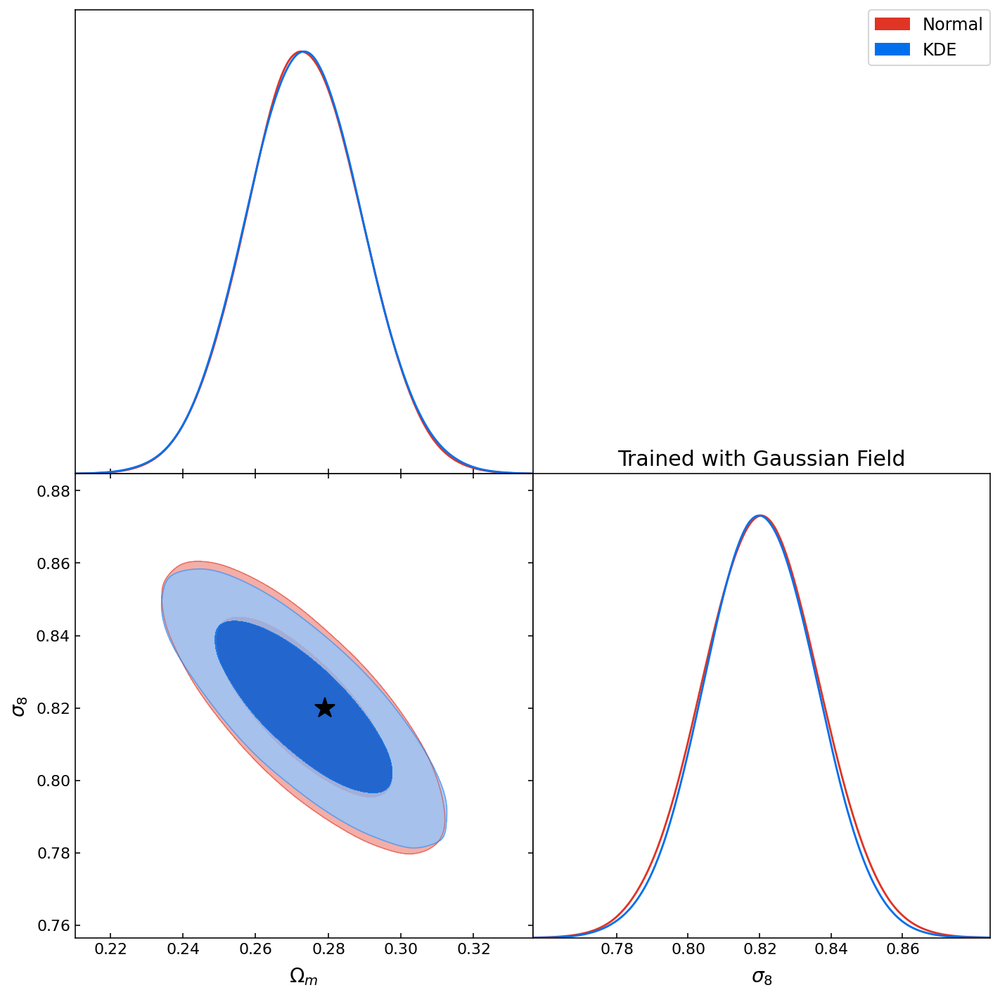

In [108]:
g = plots.get_subplot_plotter(width_inch=10)
g.triangle_plot(all_samples_Gauss_temp, filled=True, legend_labels=labels, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Gaussian Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_Gauss_temp.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [109]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_T17_lognormal_1                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_T17_lognormal_1_mean, size=nsamp)
samples_T17_lognormal_2                   = np.random.multivariate_normal(mu_T17_lognormal_2, cov_T17_lognormal_2_mean, size=nsamp)
samples_Gauss_1_lognormal_1               = np.random.multivariate_normal(mu_Gauss_1_lognormal_1, cov_Gauss_1_lognormal_1_mean, size=nsamp)
samples_Gauss_1_lognormal_2               = np.random.multivariate_normal(mu_Gauss_1_lognormal_2, cov_Gauss_1_lognormal_2_mean, size=nsamp)
samples_Gauss_2_lognormal_1               = np.random.multivariate_normal(mu_Gauss_2_lognormal_1, cov_Gauss_2_lognormal_1_mean, size=nsamp)
samples_Gauss_2_lognormal_2               = np.random.multivariate_normal(mu_Gauss_2_lognormal_2, cov_Gauss_2_lognormal_2_mean, size=nsamp)
samples_lognormal_1_lognormal_1           = np.random.multivariate_normal(mu_lognormal_1_lognormal_1, cov_lognormal_1_lognormal_1_mean, size=nsamp)
samples_lognormal_1_lognormal_2           = np.random.multivariate_normal(mu_lognormal_1_lognormal_2, cov_lognormal_1_lognormal_2_mean, size=nsamp)
samples_lognormal_2_lognormal_1           = np.random.multivariate_normal(mu_lognormal_2_lognormal_1, cov_lognormal_2_lognormal_1_mean, size=nsamp)
samples_lognormal_2_lognormal_2           = np.random.multivariate_normal(mu_lognormal_2_lognormal_2, cov_lognormal_2_lognormal_2_mean, size=nsamp)
samples_T17_lognormal_1_mcsamples         = MCSamples(samples=samples_T17_lognormal_1, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_T17_lognormal_2_mcsamples         = MCSamples(samples=samples_T17_lognormal_2, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_1_mcsamples = MCSamples(samples=samples_lognormal_1_lognormal_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_1_lognormal_2_mcsamples = MCSamples(samples=samples_lognormal_1_lognormal_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_1_mcsamples = MCSamples(samples=samples_lognormal_2_lognormal_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_lognormal_2_lognormal_2_mcsamples = MCSamples(samples=samples_lognormal_2_lognormal_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_1_mcsamples     = MCSamples(samples=samples_Gauss_1_lognormal_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_1_lognormal_2_mcsamples     = MCSamples(samples=samples_Gauss_1_lognormal_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_1_mcsamples     = MCSamples(samples=samples_Gauss_2_lognormal_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_Gauss_2_lognormal_2_mcsamples     = MCSamples(samples=samples_Gauss_2_lognormal_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_lognormal_11 = [samples_T17_lognormal_1_mcsamples, samples_lognormal_1_lognormal_1_mcsamples, samples_Gauss_1_lognormal_1_mcsamples]
all_samples_lognormal_12 = [samples_T17_lognormal_1_mcsamples, samples_lognormal_1_lognormal_2_mcsamples, samples_Gauss_1_lognormal_2_mcsamples]
all_samples_lognormal_21 = [samples_T17_lognormal_2_mcsamples, samples_lognormal_2_lognormal_1_mcsamples, samples_Gauss_2_lognormal_1_mcsamples]
all_samples_lognormal_22 = [samples_T17_lognormal_2_mcsamples, samples_lognormal_2_lognormal_2_mcsamples, samples_Gauss_2_lognormal_2_mcsamples]
labels = ['T17', 'lognormal', 'Gauß']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


In [110]:
prior_ranges = {'\Omega_m': (0.15, 0.45), '\sigma_8': (0.5, 1.1)}
param_names = ['\Omega_m', '\sigma_8']
nsamp = 100000
samples_2_T17_lognormal_1                   = np.random.multivariate_normal(mu_T17_lognormal_1, cov_2_para_T17_lognormal_1, size=nsamp)
samples_2_T17_lognormal_2                   = np.random.multivariate_normal(mu_T17_lognormal_2, cov_2_para_T17_lognormal_2, size=nsamp)
samples_2_Gauss_1_lognormal_1               = np.random.multivariate_normal(mu_Gauss_1_lognormal_1, cov_2_para_Gauss_1_lognormal_1, size=nsamp)
samples_2_Gauss_1_lognormal_2               = np.random.multivariate_normal(mu_Gauss_1_lognormal_2, cov_2_para_Gauss_1_lognormal_2, size=nsamp)
samples_2_Gauss_2_lognormal_1               = np.random.multivariate_normal(mu_Gauss_2_lognormal_1, cov_2_para_Gauss_2_lognormal_1, size=nsamp)
samples_2_Gauss_2_lognormal_2               = np.random.multivariate_normal(mu_Gauss_2_lognormal_2, cov_2_para_Gauss_2_lognormal_2, size=nsamp)
samples_2_lognormal_1_lognormal_1           = np.random.multivariate_normal(mu_lognormal_1_lognormal_1, cov_2_para_lognormal_1_lognormal_1, size=nsamp)
samples_2_lognormal_1_lognormal_2           = np.random.multivariate_normal(mu_lognormal_1_lognormal_2, cov_2_para_lognormal_1_lognormal_2, size=nsamp)
samples_2_lognormal_2_lognormal_1           = np.random.multivariate_normal(mu_lognormal_2_lognormal_1, cov_2_para_lognormal_2_lognormal_1, size=nsamp)
samples_2_lognormal_2_lognormal_2           = np.random.multivariate_normal(mu_lognormal_2_lognormal_2, cov_2_para_lognormal_2_lognormal_2, size=nsamp)
samples_2_T17_lognormal_1_mcsamples         = MCSamples(samples=samples_T17_lognormal_1, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_2_T17_lognormal_2_mcsamples         = MCSamples(samples=samples_T17_lognormal_2, names=param_names, labels=param_names, label='T17 samples', ranges=prior_ranges)
samples_2_lognormal_1_lognormal_1_mcsamples = MCSamples(samples=samples_lognormal_1_lognormal_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_lognormal_1_lognormal_2_mcsamples = MCSamples(samples=samples_lognormal_1_lognormal_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_lognormal_2_lognormal_1_mcsamples = MCSamples(samples=samples_lognormal_2_lognormal_1, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_lognormal_2_lognormal_2_mcsamples = MCSamples(samples=samples_lognormal_2_lognormal_2, names=param_names, labels=param_names, label='lognormal samples', ranges=prior_ranges)
samples_2_Gauss_1_lognormal_1_mcsamples     = MCSamples(samples=samples_Gauss_1_lognormal_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_2_Gauss_1_lognormal_2_mcsamples     = MCSamples(samples=samples_Gauss_1_lognormal_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_2_Gauss_2_lognormal_1_mcsamples     = MCSamples(samples=samples_Gauss_2_lognormal_1, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
samples_2_Gauss_2_lognormal_2_mcsamples     = MCSamples(samples=samples_Gauss_2_lognormal_2, names=param_names, labels=param_names, label='Gauss samples', ranges=prior_ranges)
all_samples_2_lognormal_11 = [samples_2_T17_lognormal_1_mcsamples, samples_2_lognormal_1_lognormal_1_mcsamples, samples_2_Gauss_1_lognormal_1_mcsamples]
all_samples_2_lognormal_12 = [samples_2_T17_lognormal_1_mcsamples, samples_2_lognormal_1_lognormal_2_mcsamples, samples_2_Gauss_1_lognormal_2_mcsamples]
all_samples_2_lognormal_21 = [samples_2_T17_lognormal_2_mcsamples, samples_2_lognormal_2_lognormal_1_mcsamples, samples_2_Gauss_2_lognormal_1_mcsamples]
all_samples_2_lognormal_22 = [samples_2_T17_lognormal_2_mcsamples, samples_2_lognormal_2_lognormal_2_mcsamples, samples_2_Gauss_2_lognormal_2_mcsamples]
labels = ['T17', 'lognormal', 'Gaussian']

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


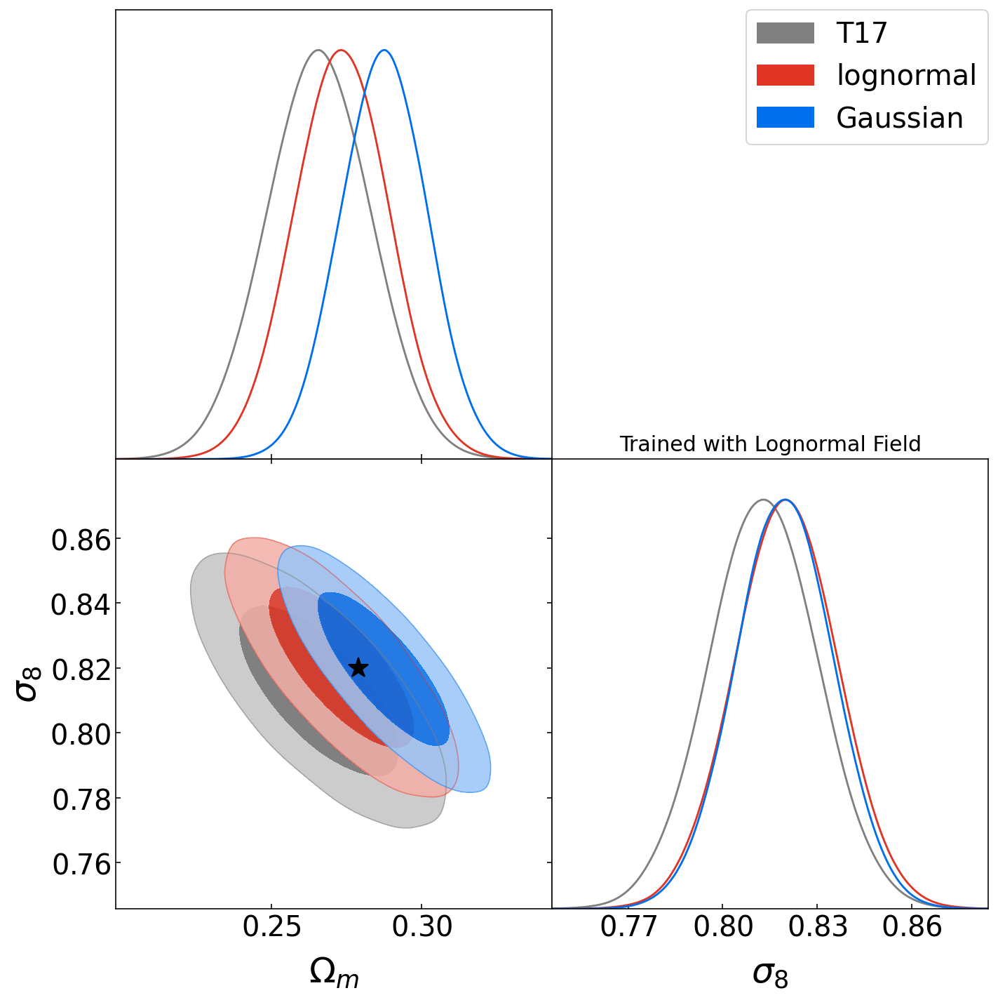

In [111]:
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 20
g.triangle_plot(all_samples_lognormal_11, filled=True, legend_labels=labels, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Lognormal Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_11.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

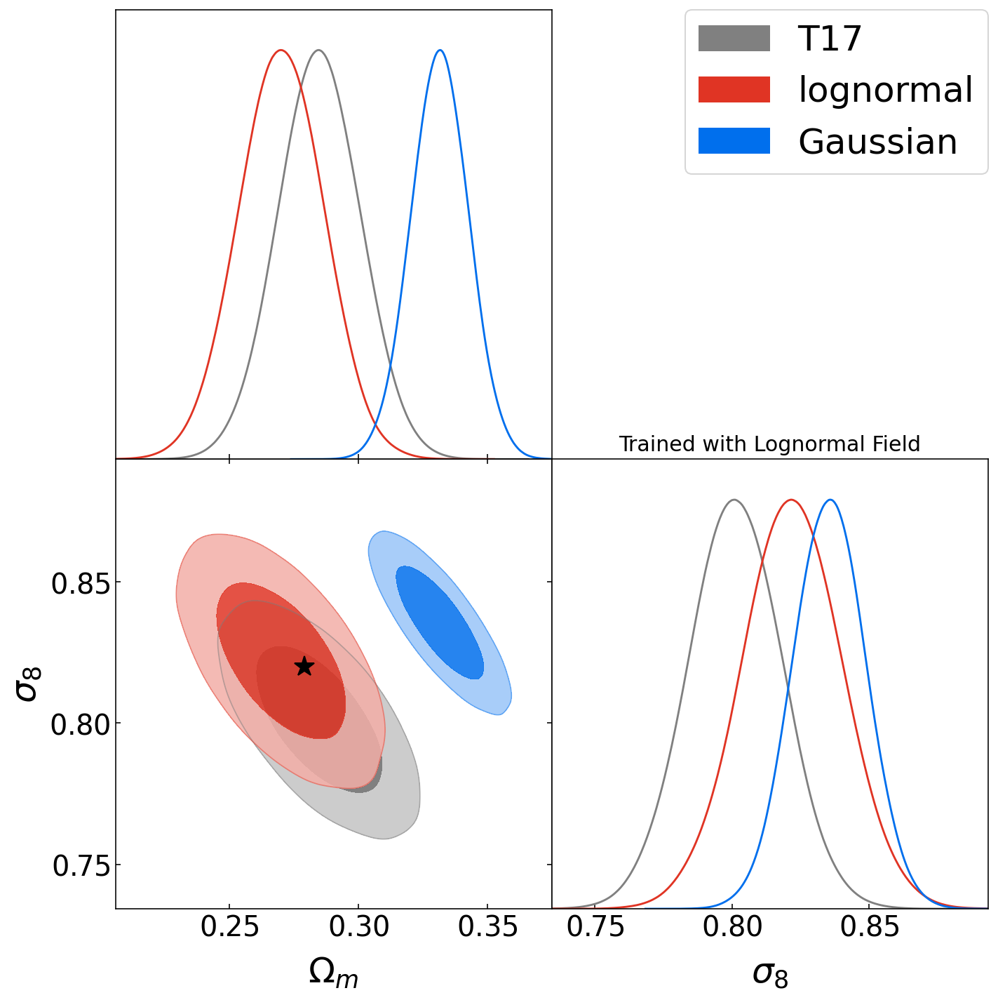

In [112]:
g = plots.get_subplot_plotter(width_inch=10, rc_sizes=True)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 25

g.triangle_plot(all_samples_lognormal_22, filled=True, legend_labels=labels, legend_loc='upper right',legend_fontsize=500)
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Lognormal Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_22.jpg', dpi=300, bbox_inches='tight')


# Show the plot
plt.show()

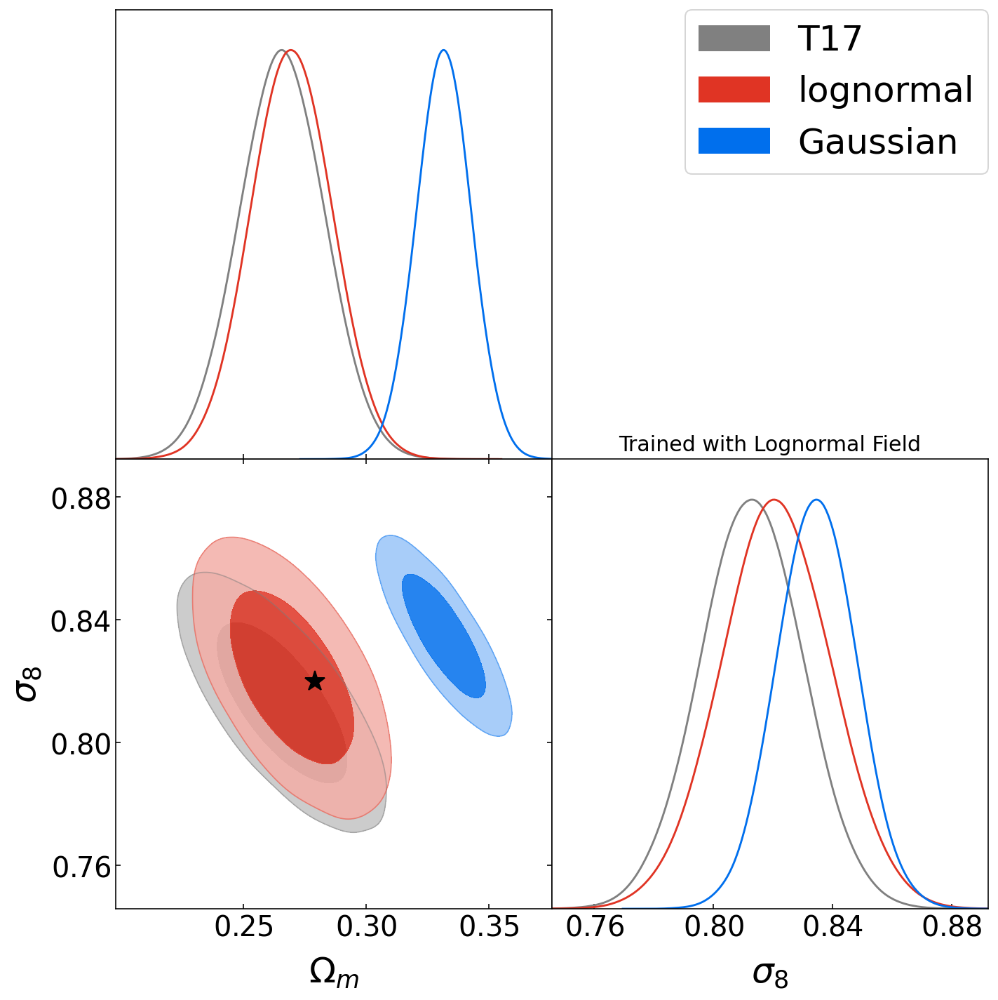

In [113]:
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 25
g.triangle_plot(all_samples_lognormal_12, filled=True, legend_labels=labels, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.title('Trained with Lognormal Field',fontsize=15)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_Train_lognormal_12.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

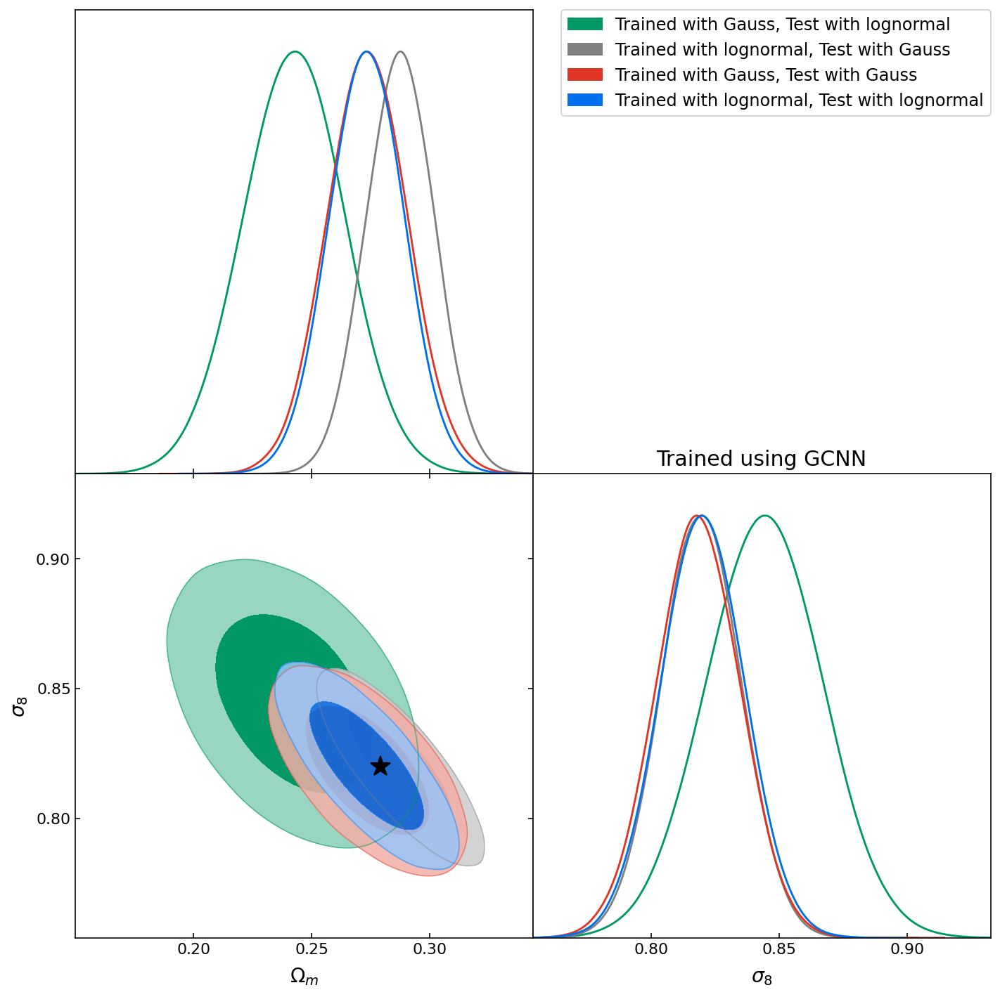

In [114]:
all_samples_Gauss_vs_Lognormal = [ samples_lognormal_1_Gauss_1_mcsamples,samples_Gauss_1_lognormal_1_mcsamples, samples_Gauss_1_Gauss_1_mcsamples,samples_lognormal_1_lognormal_1_mcsamples]
labels_Gauss_vs_Lognormal = ['Trained with Gauss, Test with lognormal','Trained with lognormal, Test with Gauss', 'Trained with Gauss, Test with Gauss','Trained with lognormal, Test with lognormal']
g = plots.get_subplot_plotter(width_inch=10)
g.triangle_plot(all_samples_Gauss_vs_Lognormal, filled=True, legend_labels=labels_Gauss_vs_Lognormal, legend_loc='upper right')
plt.title('Trained using GCNN',fontsize=15)
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Posterior_cov_Gauss_vs_Lognormal.png', dpi=300, bbox_inches='tight')
plt.show()

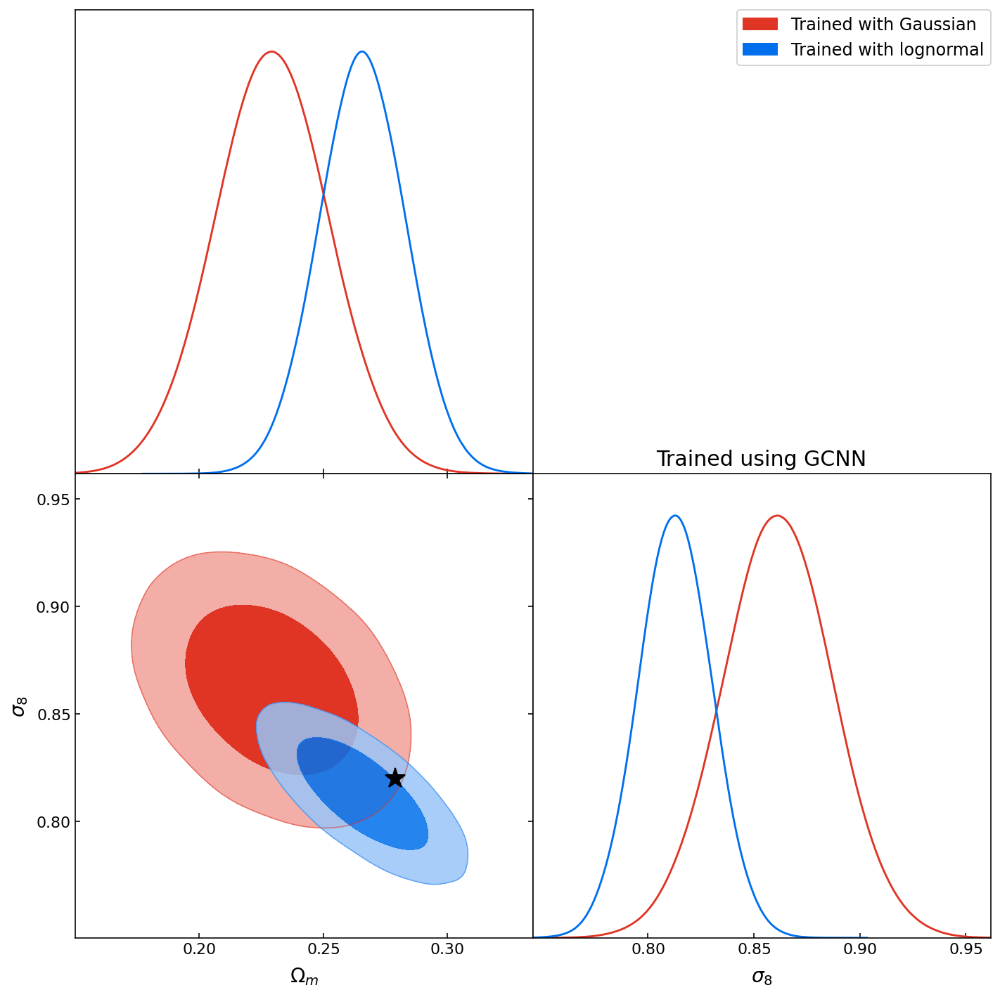

In [115]:
all_samples_T17 = [samples_T17_Gauss_1_mcsamples,samples_T17_lognormal_1_mcsamples]
labels_T17 = ['Trained with Gaussian','Trained with lognormal']
g = plots.get_subplot_plotter(width_inch=10)
g.triangle_plot(all_samples_T17, filled=True, legend_labels=labels_T17, legend_loc='upper right')
plt.title('Trained using GCNN',fontsize=15)
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/Posterior_cov_T17.png', dpi=300, bbox_inches='tight')
plt.show()

In [116]:
nsamp = 100000
samples_T17_0 = np.random.multivariate_normal(parameter_est_T17_lognormal_1[0], cov_para_T17_lognormal_1[:,:,0], size=nsamp)
samples_T17_1 = np.random.multivariate_normal(parameter_est_T17_lognormal_1[1], cov_para_T17_lognormal_1[:,:,1], size=nsamp)
samples_T17_2 = np.random.multivariate_normal(parameter_est_T17_lognormal_1[2], cov_para_T17_lognormal_1[:,:,2], size=nsamp)
samples_T17_3 = np.random.multivariate_normal(parameter_est_T17_lognormal_1[3], cov_para_T17_lognormal_1[:,:,3], size=nsamp)
samples_T17_4 = np.random.multivariate_normal(parameter_est_T17_lognormal_1[4], cov_para_T17_lognormal_1[:,:,4], size=nsamp)
samples_T17_5 = np.random.multivariate_normal(parameter_est_T17_lognormal_1[5], cov_para_T17_lognormal_1[:,:,5], size=nsamp)
samples_T17_0_mcsamples = MCSamples(samples=samples_T17_0, names=param_names, labels=param_names, label='Realization 0', ranges=prior_ranges)
samples_T17_1_mcsamples = MCSamples(samples=samples_T17_1, names=param_names, labels=param_names, label='Realization 1', ranges=prior_ranges)
samples_T17_2_mcsamples = MCSamples(samples=samples_T17_2, names=param_names, labels=param_names, label='Realization 2', ranges=prior_ranges)
samples_T17_3_mcsamples = MCSamples(samples=samples_T17_3, names=param_names, labels=param_names, label='Realization 3', ranges=prior_ranges)
samples_T17_4_mcsamples = MCSamples(samples=samples_T17_4, names=param_names, labels=param_names, label='Realization 4', ranges=prior_ranges)
samples_T17_5_mcsamples = MCSamples(samples=samples_T17_5, names=param_names, labels=param_names, label='Realization 5', ranges=prior_ranges)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


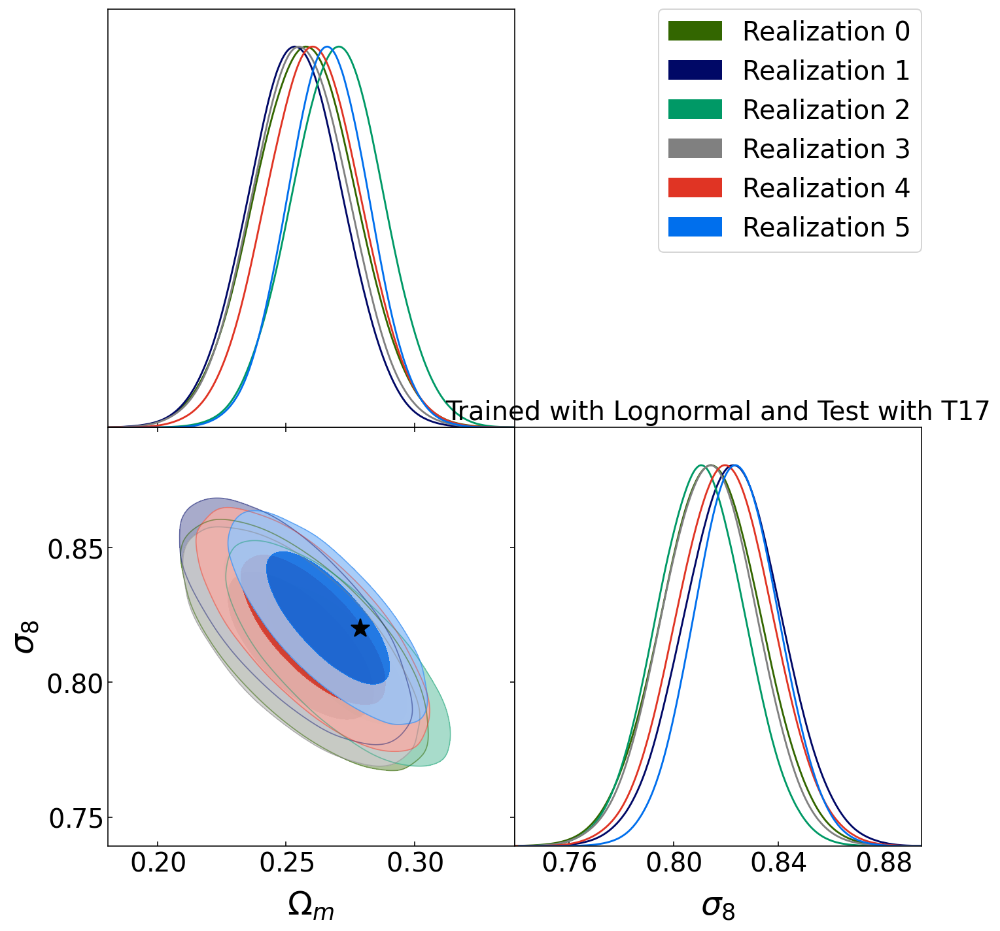

In [117]:
all_samples_various_universe = [samples_T17_0_mcsamples, samples_T17_1_mcsamples, samples_T17_2_mcsamples,samples_T17_3_mcsamples,samples_T17_4_mcsamples,samples_T17_5_mcsamples]
labels_various_universe = ['Realization 0', 'Realization 1','Realization 2','Realization 3','Realization 4','Realization 5']
# Create a getdist Plotter
g = plots.get_subplot_plotter(width_inch=10)
g.settings.axes_fontsize = 20
g.settings.lab_fontsize = 25
g.settings.legend_fontsize = 20
# Plot the triangle plot with all posterior distributions and priors
g.triangle_plot(all_samples_various_universe, filled=True, legend_labels=labels_various_universe, legend_loc='upper right')
g.subplots[1, 0].plot([fiducial_Omega_M], [fiducial_sigma_8], marker='*', label='Fiducial Cosmology', markersize=15, color="black")
plt.scatter(fiducial_Omega_M, fiducial_sigma_8, marker='*', s=300, label="fiducial cosmology")
# Save the plot to a file (optional)
plt.title('Trained with Lognormal and Test with T17',fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final//Plot/Posterior_v6/Posterior_various_universe.jpg', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [118]:
def figure_of_merit(posterior_samples):
    cov_matrix = np.cov(posterior_samples.T)
    eigvals, _ = np.linalg.eig(cov_matrix)
    return 1.0 / np.sqrt(np.prod(eigvals))

In [119]:
all_samples_cov_mean_11 = [samples_T17_Gauss_1_mcsamples, samples_T17_lognormal_1_mcsamples, samples_lognormal_1_Gauss_1_mcsamples, samples_lognormal_1_lognormal_1_mcsamples, samples_Gauss_1_Gauss_1_mcsamples, samples_Gauss_1_lognormal_1_mcsamples]
labels = ['Trained with Gauss, Test with T17', 'Trained with Lognormal, Test with T17','Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
foms_mean_11= []
for sample in all_samples_cov_mean_11:
    fom = figure_of_merit(sample.samples)
    foms_mean_11.append(fom)
all_samples_cov_KDE_11 = [samples_T17_Gauss_1_mcsamples_KDE, samples_T17_lognormal_1_mcsamples_KDE, samples_lognormal_1_Gauss_1_mcsamples_KDE, samples_lognormal_1_lognormal_1_mcsamples_KDE, samples_Gauss_1_Gauss_1_mcsamples_KDE, samples_Gauss_1_lognormal_1_mcsamples_KDE]
foms_KDE_11= []
for sample in all_samples_cov_KDE_11:
    fom = figure_of_merit(sample.samples)
    foms_KDE_11.append(fom)

In [120]:
all_samples_cov_mean_11 = [samples_T17_Gauss_1_mcsamples, samples_T17_lognormal_1_mcsamples, samples_lognormal_1_Gauss_1_mcsamples, samples_lognormal_1_lognormal_1_mcsamples, samples_Gauss_1_Gauss_1_mcsamples, samples_Gauss_1_lognormal_1_mcsamples]
labels = ['Trained with Gauss, Test with T17', 'Trained with Lognormal, Test with T17','Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
foms_mean_11= []
for sample in all_samples_cov_mean_11:
    fom = figure_of_merit(sample.samples)
    foms_mean_11.append(fom)
all_samples_cov_KDE_11 = [samples_T17_Gauss_1_mcsamples_KDE, samples_T17_lognormal_1_mcsamples_KDE, samples_lognormal_1_Gauss_1_mcsamples_KDE, samples_lognormal_1_lognormal_1_mcsamples_KDE, samples_Gauss_1_Gauss_1_mcsamples_KDE, samples_Gauss_1_lognormal_1_mcsamples_KDE]
foms_KDE_11= []
for sample in all_samples_cov_KDE_11:
    fom = figure_of_merit(sample.samples)
    foms_KDE_11.append(fom)

<Figure size 864x576 with 0 Axes>

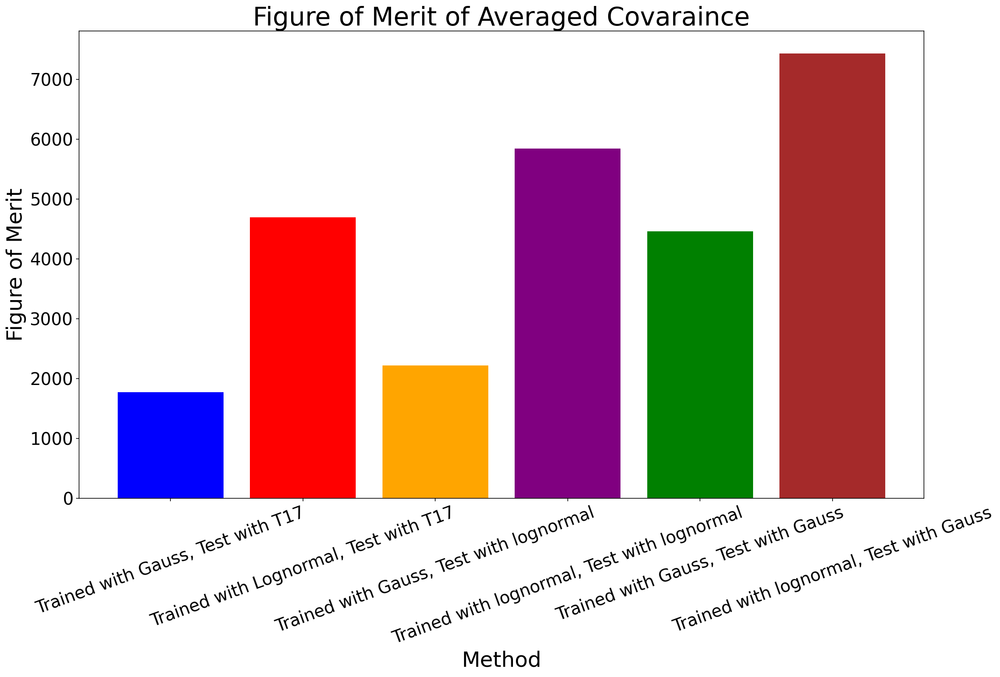

In [121]:
# Create a bar plot
plt.figure(figsize=(12, 8))
# Define custom colors for each bar
colors = ['blue', 'red', 'orange', 'purple', 'green', 'brown']

# Create a bar plot
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, foms_mean_11, color=colors)

# Add legend with the corresponding labels
#plt.legend(bars, labels, loc='upper right', bbox_to_anchor=(1.20, 1.20))

plt.xlabel('Method', fontsize=25)
plt.ylabel('Figure of Merit', fontsize=25)
plt.title('Figure of Merit of Averaged Covaraince',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/FOM_11.jpg',bbox_inches='tight')
# Display the plot
plt.show();

<Figure size 864x576 with 0 Axes>

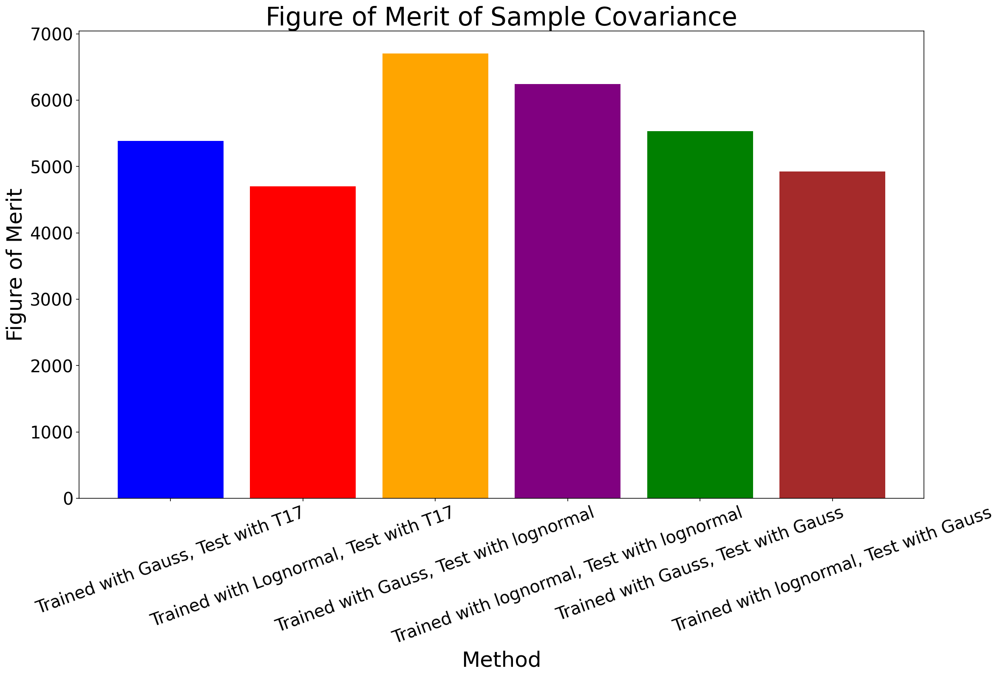

In [122]:
# Create a bar plot
plt.figure(figsize=(12, 8))
# Define custom colors for each bar
colors = ['blue', 'red', 'orange', 'purple', 'green', 'brown']

# Create a bar plot
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, foms_KDE_11, color=colors)

# Add legend with the corresponding labels
#plt.legend(bars, labels, loc='upper right', bbox_to_anchor=(1.20, 1.20))

plt.xlabel('Method', fontsize=25)
plt.ylabel('Figure of Merit', fontsize=25)
plt.title('Figure of Merit of Sample Covariance',fontsize=30)
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/FOM_KDE_11.jpg',bbox_inches='tight')
# Display the plot
plt.show();

In [123]:
all_samples_cov_mean_22 = [samples_T17_Gauss_2_mcsamples, samples_T17_lognormal_2_mcsamples, samples_lognormal_2_Gauss_2_mcsamples, samples_lognormal_2_lognormal_2_mcsamples, samples_Gauss_2_Gauss_2_mcsamples, samples_Gauss_2_lognormal_2_mcsamples]
labels = ['Trained with Gauss, Test with T17', 'Trained with Lognormal, Test with T17','Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with Gauss']
foms = []
for sample in all_samples_cov_mean_22:
    fom = figure_of_merit(sample.samples)
    foms.append(fom)

<Figure size 864x576 with 0 Axes>

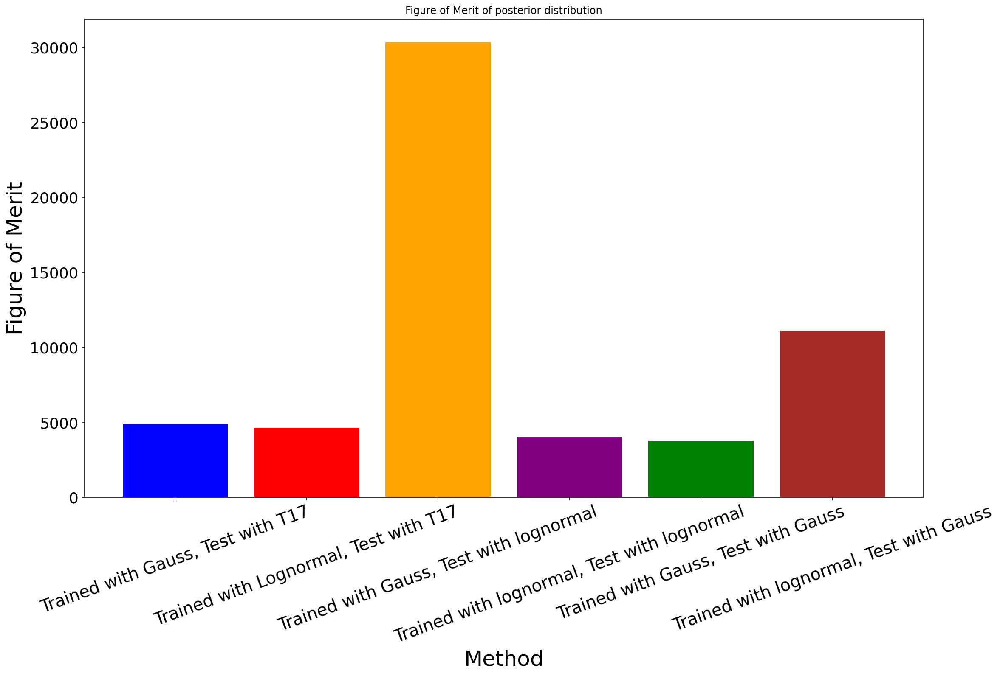

In [124]:
# Create a bar plot
plt.figure(figsize=(12, 8))
# Define custom colors for each bar
colors = ['blue', 'red', 'orange', 'purple', 'green', 'brown']

# Create a bar plot
plt.figure(figsize=(15, 10))
bars = plt.bar(labels, foms, color=colors)

# Add legend with the corresponding labels
#plt.legend(bars, labels, loc='upper right', bbox_to_anchor=(1.20, 1.20))

plt.xlabel('Method', fontsize=25)
plt.ylabel('Figure of Merit', fontsize=25)
plt.title('Figure of Merit of posterior distribution')
plt.xticks(rotation=20)
plt.tight_layout()
plt.yticks(fontsize=18)
plt.xticks(fontsize=20)
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/FOM_11.png',bbox_inches='tight')
# Display the plot
plt.show();

#### More biased more variance? Bias variance relation?

In [125]:
all_samples_cov_mean_11 = [samples_lognormal_1_lognormal_1_mcsamples_KDE, samples_lognormal_1_Gauss_1_mcsamples_KDE, samples_Gauss_1_lognormal_1_mcsamples_KDE, samples_Gauss_1_Gauss_1_mcsamples_KDE, samples_T17_lognormal_1_mcsamples_KDE, samples_T17_Gauss_1_mcsamples_KDE]
labels = ['Trained with lognormal, Test with lognormal', 'Trained with Gauss, Test with lognormal', 'Trained with lognormal, Test with Gauss', 'Trained with Gauss, Test with Gauss', 'Trained with lognormal, Test with T17', 'Trained with Gauss, Test with T17']
foms = []
for sample in all_samples_cov_mean_11:
    fom = figure_of_merit(sample.samples)
    foms.append(fom)

<Figure size 864x576 with 0 Axes>

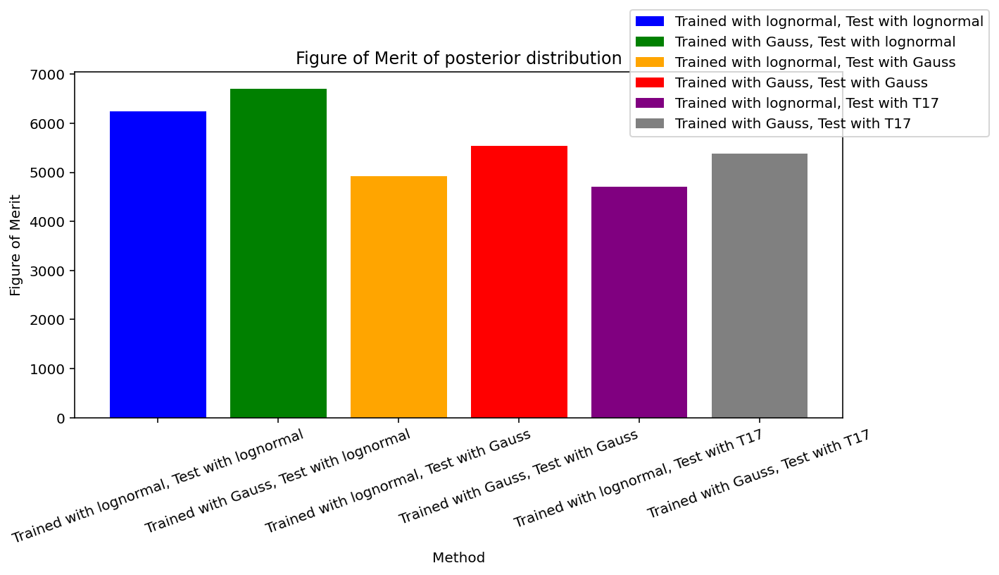

In [126]:
plt.figure(figsize=(12, 8))
# Define custom colors for each bar
colors = ['blue', 'green', 'orange', 'red', 'purple', 'gray']

# Create a bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, foms, color=colors)

# Add legend with the corresponding labels
plt.legend(bars, labels, loc='upper right', bbox_to_anchor=(1.20, 1.20))

plt.xlabel('Method')
plt.ylabel('Figure of Merit')
plt.title('Figure of Merit of posterior distribution')
plt.xticks(rotation=20)
plt.tight_layout()
plt.savefig('/home/r/R.Kanaki/Master_Arbeit_Final/Plot/Posterior_v6/FOM.png',bbox_inches='tight')
# Display the plot
plt.show();